# **E-commerce_Capstone_Project_Vikrant_Shelke**

# Step 1: Importing import packages

In [1]:
# import libraries

import pandas as pd
import numpy as np

# For visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# Supress warnings
import warnings
warnings.filterwarnings('ignore')

# Pandas settings

pd.set_option('display.max_rows', 40000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Miscellaneous imports
from datetime import datetime
from scipy.stats import norm
import re

# Step 2: Reading Data

#### Reading the main data file - ConsumerElectronics.csv into a dataframe

In [2]:
main_df = pd.read_csv(r'ConsumerElectronics.csv')

In [3]:
main_df.head(10)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
5,ACCCX3S5JGAJETYR,2015-10-17 12:07:24,2015,10,3.419189e+15,3.419189e+15,3324,1,\N,\N,Prepaid,5,-7.64154636189174E+018,-1.91905269756031E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
6,ACCCX3S5JGAJETYR,2015-10-16 14:59:57,2015,10,3.418429e+15,3.418429e+15,3695,1,\N,\N,Prepaid,6,-7.15614041481066E+016,6.40491320207757E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
7,ACCCX3S5JGAJETYR,2015-10-15 23:41:39,2015,10,3.417799e+15,3.417799e+15,3695,1,\N,\N,COD,5,9.17327596234152E+018,-1.60630305201981E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
8,ACCCX3S5JGAJETYR,2015-10-16 00:49:14,2015,10,2.417870e+15,2.417870e+15,,1,\N,\N,Prepaid,9,,,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
9,ACCCX3S5JGAJETYR,2015-10-25 22:52:34,2015,10,4.426482e+15,4.426482e+15,3695,1,\N,\N,COD,7,-7.80915606896163E+018,-9.779010321304E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5


*Reading the excel file **Media data and other information.xlsx** -into a dataframe sheet by sheet*

#### Reading the **Product List** excel data file into a dataframe

In [4]:
product_list = pd.read_excel(r'Media data and other information.xlsx', sheet_name='Product List')

In [5]:
product_list.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,NaN,Frequency,Percent
1,NaN,\N,5828,0.353464
2,NaN,AmplifierReceiver,4056,0.245994
3,NaN,AudioMP3Player,112892,6.846819
4,NaN,Binoculars,14599,0.885419


In [6]:
product_list = product_list.iloc[1: , 1:]

In [7]:
product_list.head()

,Unnamed: 1,Unnamed: 2,Unnamed: 3
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.846819
4,Binoculars,14599,0.885419
5,BoomBox,2879,0.174609


In [8]:
product_list.columns.values[0] = 'product_analytic_vertical'
product_list.columns.values[1] = 'Frequency'
product_list.columns.values[2] = 'Percent'
product_list.head()

,product_analytic_vertical,Frequency,Percent
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.846819
4,Binoculars,14599,0.885419
5,BoomBox,2879,0.174609


#### Reading the **Media Investment** excel data file into a dataframe

In [9]:
media_investment = pd.read_excel(r'Media data and other information.xlsx', sheet_name='Media Investment', skiprows=2 )
media_investment.head()

,Unnamed: 0,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,NaN,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
media_investment=media_investment.iloc[:,:13]

In [11]:
media_investment.drop( media_investment.columns[0] , axis=1, inplace =True)
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


#### Reading the **Special Sale Calendar** excel data file into a dataframe

In [12]:
sale_calendar = pd.read_excel(r'Media data and other information.xlsx', sheet_name='Special Sale Calendar', skiprows=0)
sale_calendar

,Unnamed: 0,Unnamed: 1,Sales Calendar,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,NaN,2015.0,(18-19th July),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,(15-17th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,(28-30th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,(15-17th Oct),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,(7-14th Nov),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,(25th Dec'15 - 3rd Jan'16),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,2016.0,(20-22 Jan),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,(1-2 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,(20-21 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,(14-15 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
sale_calendar.drop(sale_calendar.columns[0], axis=1, inplace= True)
sale_calendar

,Unnamed: 1,Sales Calendar,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,2015.0,(18-19th July),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,(15-17th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,(28-30th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,(15-17th Oct),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,(7-14th Nov),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,(25th Dec'15 - 3rd Jan'16),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016.0,(20-22 Jan),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,(1-2 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,(20-21 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,(14-15 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
sale_calendar.iloc[1:6, 0] = sale_calendar.iloc[0,0]
sale_calendar.iloc[7: , 0] = sale_calendar.iloc[6,0]
sale_calendar

,Unnamed: 1,Sales Calendar,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,2015.0,(18-19th July),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015.0,(15-17th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015.0,(28-30th Aug),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015.0,(15-17th Oct),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015.0,(7-14th Nov),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2015.0,(25th Dec'15 - 3rd Jan'16),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016.0,(20-22 Jan),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016.0,(1-2 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2016.0,(20-21 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2016.0,(14-15 Feb),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
sale_calendar = sale_calendar.iloc[:,:2]

In [ ]:
sale_calendar

#### Reading the **net_promoter_score (NPS)** excel file into a dataframe

In [16]:
net_promoter_score = pd.read_excel(r'Media data and other information.xlsx', sheet_name='Monthly NPS Score')
net_promoter_score.columns.values[0] = 'Score'
net_promoter_score

,Score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
net_promoter_score = net_promoter_score.iloc[:, :13]

In [ ]:
net_promoter_score

#### Reading the **Product Details** word file into a dataframe

In [18]:
!pip install python-docx


In [19]:
import pandas as pd
import io
import csv
from docx import Document

In [20]:

def read_docx_tables(filename, tab_id=None, **kwargs):
    """
    parse table(s) from a Word Document (.docx) into Pandas DataFrame(s)

    Parameters:
        filename:   file name of a Word Document

        tab_id:     parse a single table with the index: [tab_id] (counting from 0).
                    When [None] - return a list of DataFrames (parse all tables)

        kwargs:     arguments to pass to `pd.read_csv()` function

    Return: a single DataFrame if tab_id != None or a list of DataFrames otherwise
    """
    def read_docx_tab(tab, **kwargs):
        vf = io.StringIO()
        writer = csv.writer(vf)
        for row in tab.rows:
            writer.writerow(cell.text for cell in row.cells)
        vf.seek(0)
        return pd.read_csv(vf, **kwargs)

    doc = Document(filename)
    if tab_id is None:
        return [read_docx_tab(tab, **kwargs) for tab in doc.tables]
    else:
        try:
            return read_docx_tab(doc.tables[tab_id], **kwargs)
        except IndexError:
            print('Error: specified [tab_id]: {}  does not exist.'.format(tab_id))
            raise

dfs = read_docx_tables(r'Product Details.docx')

dfs[0]

,super_category,category,sub_category,vertical
0,CE,Camera,Camera,Camcorders
1,CE,Camera,Camera,DSLR
2,CE,Camera,Camera,Instant Cameras
3,CE,Camera,Camera,Point & Shoot
4,CE,Camera,Camera,SportsAndAction
5,CE,CameraAccessory,CameraAccessory,Binoculars
6,CE,CameraAccessory,CameraAccessory,CameraAccessory
7,CE,CameraAccessory,CameraAccessory,CameraBag
8,CE,CameraAccessory,CameraAccessory,CameraBattery
9,CE,CameraAccessory,CameraAccessory,CameraBatteryCharger


In [21]:
# dropping the extra column - super_category, since it is unnecessary.

product_details = pd.DataFrame(dfs[0])
product_details.drop(product_details.columns[0], axis=1, inplace = True)
product_details

,category,sub_category,vertical
0,Camera,Camera,Camcorders
1,Camera,Camera,DSLR
2,Camera,Camera,Instant Cameras
3,Camera,Camera,Point & Shoot
4,Camera,Camera,SportsAndAction
5,CameraAccessory,CameraAccessory,Binoculars
6,CameraAccessory,CameraAccessory,CameraAccessory
7,CameraAccessory,CameraAccessory,CameraBag
8,CameraAccessory,CameraAccessory,CameraBattery
9,CameraAccessory,CameraAccessory,CameraBatteryCharger


# Step 3: Data Cleaning



## 1. ConsumerElectronics.csv

In [22]:
main_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [23]:
main_df.dtypes

fsn_id                              object
order_date                          object
Year                                 int64
Month                                int64
order_id                           float64
order_item_id                      float64
gmv                                 object
units                                int64
deliverybdays                       object
deliverycdays                       object
s1_fact.order_payment_type          object
sla                                  int64
cust_id                             object
pincode                             object
product_analytic_super_category     object
product_analytic_category           object
product_analytic_sub_category       object
product_analytic_vertical           object
product_mrp                          int64
product_procurement_sla              int64
dtype: object

In [24]:
main_df.shape

(1648824, 20)

In [25]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

#### Data types correction

In [26]:
#string to datetime
main_df['order_date'] = pd.to_datetime(main_df['order_date'], format='%Y-%m-%d %H:%M:%S')

#float to string
main_df[['order_id', 'order_item_id']] = main_df[['order_id', 'order_item_id']].astype(object)

#int to string
main_df[['Year', 'Month']] = main_df[['Year', 'Month']].astype(str)

main_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   fsn_id                           1648824 non-null  object        
 1   order_date                       1648824 non-null  datetime64[ns]
 2   Year                             1648824 non-null  object        
 3   Month                            1648824 non-null  object        
 4   order_id                         1648824 non-null  object        
 5   order_item_id                    1648824 non-null  object        
 6   gmv                              1648824 non-null  object        
 7   units                            1648824 non-null  int64         
 8   deliverybdays                    1648824 non-null  object        
 9   deliverycdays                    1648824 non-null  object        
 10  s1_fact.order_payment_type    

#### Imputing 0 for **\N** values ifor columns  **deliverycdays** and **deliverybdays** by assuming \N is eqaul to zero



In [27]:
main_df['deliverybdays'] = pd.to_numeric(main_df['deliverybdays'], errors = 'coerce')
main_df['deliverybdays'].fillna(value=0, inplace =True)

main_df['deliverycdays'] = pd.to_numeric(main_df['deliverycdays'], errors = 'coerce')
main_df['deliverycdays'].fillna(value=0, inplace =True)

main_df.head(10)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400,1,0.0,0.0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900,1,0.0,0.0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990,1,0.0,0.0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690,1,0.0,0.0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618,1,0.0,0.0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
5,ACCCX3S5JGAJETYR,2015-10-17 12:07:24,2015,10,3419188825145600.0,3419188825145600.0,3324,1,0.0,0.0,Prepaid,5,-7.64154636189174E+018,-1.91905269756031E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
6,ACCCX3S5JGAJETYR,2015-10-16 14:59:57,2015,10,3418428515041500.0,3418428515041500.0,3695,1,0.0,0.0,Prepaid,6,-7.15614041481066E+016,6.40491320207757E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
7,ACCCX3S5JGAJETYR,2015-10-15 23:41:39,2015,10,3417799002820700.0,3417799002820700.0,3695,1,0.0,0.0,COD,5,9.17327596234152E+018,-1.60630305201981E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
8,ACCCX3S5JGAJETYR,2015-10-16 00:49:14,2015,10,2417869738304300.0,2417869738304300.0,,1,0.0,0.0,Prepaid,9,,,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5
9,ACCCX3S5JGAJETYR,2015-10-25 22:52:34,2015,10,4426481574167600.0,4426481574167600.0,3695,1,0.0,0.0,COD,7,-7.80915606896163E+018,-9.779010321304E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5


In [28]:
# Converting datatype of gmv from string to numeric

main_df['gmv'] = pd.to_numeric(main_df['gmv'], errors='coerce')

In [29]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   fsn_id                           1648824 non-null  object        
 1   order_date                       1648824 non-null  datetime64[ns]
 2   Year                             1648824 non-null  object        
 3   Month                            1648824 non-null  object        
 4   order_id                         1648824 non-null  object        
 5   order_item_id                    1648824 non-null  object        
 6   gmv                              1643920 non-null  float64       
 7   units                            1648824 non-null  int64         
 8   deliverybdays                    1648824 non-null  float64       
 9   deliverycdays                    1648824 non-null  float64       
 10  s1_fact.order_payment_type    

#### Invalid value fixing

In [30]:
main_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [31]:
main_df_copy = main_df.copy()
main_df_copy

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3419300926147000.0,3419300926147000.0,6400.0,1,0.0,0.0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1420830839915200.0,1420830839915200.0,6900.0,1,0.0,0.0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2421912925714800.0,2421912925714800.0,1990.0,1,0.0,0.0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4416592101738400.0,4416592101738400.0,1690.0,1,0.0,0.0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4419525153426400.0,4419525153426400.0,1618.0,1,0.0,0.0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1648819,VPLEYAP3ZYYUVESU,2015-09-27 19:20:31,2015,9,4402170060025800.0,4402170060025800.0,2200.0,1,0.0,0.0,COD,7,-9.90634340213633E+017,7.89475898877674E+018,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,2499,2
1648820,VPLEYAP3ZYYUVESU,2015-09-28 01:32:58,2015,9,1402393217090200.0,1402393217090200.0,2098.0,1,0.0,0.0,COD,10,3.04892345453077E+018,-1.45758574108572E+018,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,2499,2
1648821,VPLEYAP3ZYYUVESU,2015-09-29 07:07:57,2015,9,4403459511294400.0,4403459511294400.0,2098.0,1,0.0,0.0,COD,5,-4.53140379455183E+018,5.74649014721365E+018,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,2499,2
1648822,VPLEYAP3ZYYUVESU,2015-09-29 18:15:45,2015,9,4403860318235600.0,4403860318235600.0,2200.0,1,0.0,0.0,COD,3,-8.94046418180233E+018,2.57294814079718E+018,CE,EntertainmentSmall,TVVideoSmall,VideoPlayer,2499,2


#### SLA (Number of days it typically takes to deliver the product) ideally shouldn't be more than 60 days. So let's drop records having SLA greater than 60 days.

In [32]:
main_df = main_df.loc[(main_df['sla'] <= 60)]

In [33]:
main_df.shape

(1648813, 20)

#### Product procurement SLA (Time typically taken to procure the product) ideally can't be 1000 days. So, dropping the records having Product procurement SLA with value of 1000 days. 

In [34]:
main_df[['product_procurement_sla']].describe().T

,count,mean,std,min,25%,50%,75%,max
product_procurement_sla,1648813.0,5.402878,53.460748,-1.0,1.0,2.0,3.0,1000.0


In [35]:
main_df[['product_procurement_sla']].value_counts()

product_procurement_sla
 2                         528416
 1                         308506
 3                         303360
 5                         222102
 4                         120192
-1                          75982
 0                          42461
 6                          18560
 7                          11746
 15                          6184
 14                          5281
 1000                        4744
 13                           526
 8                            523
 9                             97
 10                            73
 12                            60
dtype: int64

In [36]:
main_df.loc[(main_df['product_procurement_sla'] == 1000)].shape

(4744, 20)

There are 4744 such records, let's drop them. Keeping records having value less than 1000.

In [37]:
main_df = main_df.loc[(main_df['product_procurement_sla'] < 1000)]
main_df.shape

(1644069, 20)

#### Let's also drop the records having negative value for **product_procurement_sla** column, since number of days to produce can't be negative.

In [38]:
main_df.loc[(main_df['product_procurement_sla'] < 0)].shape

(75982, 20)

Keeping records having value greater than zero days for **product_procurement_sla**

In [39]:
main_df = main_df.loc[(main_df['product_procurement_sla'] >= 0)]
main_df.shape

(1568087, 20)

In [40]:
1644069 - 1568087

75982

#### Handling Negative values for **deliverybdays** & **deliverycdays**

In [41]:
main_df.loc[main_df['deliverybdays'] < 0 ].shape

(38, 20)

In [42]:
main_df.loc[main_df['deliverycdays'] < 0 ].shape

(39, 20)

*   There are 38 records in the dataframe with negative values for deliverybdays.
*   There are 39 records in the dataframe with negative values for deliverycdays.

Dropping such rows since it is not possible for a product to have negative values for Dispatch Delay from Warehouse and to customer.

In [43]:
main_df = main_df.loc[ (main_df['deliverybdays'] >= 0) & (main_df['deliverycdays'] >= 0) ]

main_df.reset_index(drop=True, inplace=True)

main_df.shape

(1568048, 20)

#### Let's check **GMV** column values

In [44]:
main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv'] ].shape


(31092, 20)

So there are 31092 records, where GMV value is greater than **Product_MRP** * **units**. Let's impute such erroneous MRP values with **GMV**/**Units**.

In [45]:
main_df['product_mrp'] = np.where(  main_df['product_mrp'] < main_df['gmv']/main_df['units'],    main_df['gmv']/main_df['units']   ,  main_df['product_mrp'] )

main_df.shape

(1568048, 20)

Let's recheck where GMV value is greater than the MRP * units.

In [46]:
main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv'] ].shape


(0, 20)

All erroneous records are treated.

In [47]:
main_df.loc[main_df['gmv'] < 0].shape

(0, 20)

In [48]:
main_df.loc[main_df['product_mrp'] < 0].shape

(0, 20)

In [49]:
main_df.loc[main_df['units'] < 0].shape

(0, 20)

No erroneous records left in MRP, GMV or Units columns.

#### Let's check duplicate values.

In [50]:
main_df.duplicated().value_counts()

False    1468765
True       99283
dtype: int64

There are 99283 records which have duplicates. 
So we are dropping these records.

In [51]:
main_df.drop_duplicates( keep= 'first', inplace=True)
main_df.shape

(1468765, 20)

In [52]:
1568048 - 99283

1468765

In [53]:
main_df.duplicated().value_counts()

False    1468765
dtype: int64

As we can see above, duplicated records are successfully removed.

#### Let's check null values in columns.

In [54]:
main_df.isnull().sum().sort_values(ascending= False)

gmv                                3705
fsn_id                                0
sla                                   0
product_mrp                           0
product_analytic_vertical             0
product_analytic_sub_category         0
product_analytic_category             0
product_analytic_super_category       0
pincode                               0
cust_id                               0
s1_fact.order_payment_type            0
order_date                            0
deliverycdays                         0
deliverybdays                         0
units                                 0
order_item_id                         0
order_id                              0
Month                                 0
Year                                  0
product_procurement_sla               0
dtype: int64

Also we have observed there are few whitespaces present in some of the columns.

Let's convert them to Nan's , so that we will be able to check null values in such columns.

In [55]:
main_df.replace(' ', np.nan, inplace=True)

Rechecking null values in columns.

In [56]:
main_df.isnull().sum().sort_values(ascending= False)

gmv                                3705
pincode                            3705
cust_id                            3705
fsn_id                                0
sla                                   0
product_mrp                           0
product_analytic_vertical             0
product_analytic_sub_category         0
product_analytic_category             0
product_analytic_super_category       0
s1_fact.order_payment_type            0
order_date                            0
deliverycdays                         0
deliverybdays                         0
units                                 0
order_item_id                         0
order_id                              0
Month                                 0
Year                                  0
product_procurement_sla               0
dtype: int64

Removing records which have null values in **GMV** column.

In [57]:
main_df = main_df[ ~pd.isnull(main_df['gmv']) ]
original_shape = main_df.shape
original_shape

(1465060, 20)

Rechecking null values in columns.

In [58]:
main_df.isnull().sum().sort_values(ascending= False)

fsn_id                             0
order_date                         0
product_mrp                        0
product_analytic_vertical          0
product_analytic_sub_category      0
product_analytic_category          0
product_analytic_super_category    0
pincode                            0
cust_id                            0
sla                                0
s1_fact.order_payment_type         0
deliverycdays                      0
deliverybdays                      0
units                              0
gmv                                0
order_item_id                      0
order_id                           0
Month                              0
Year                               0
product_procurement_sla            0
dtype: int64

No null records exists in any column.

#### Now, As per business requirement, we have to use the data from **July 2015** to **June 2016**.

In [59]:
main_df.dtypes

fsn_id                                     object
order_date                         datetime64[ns]
Year                                       object
Month                                      object
order_id                                  float64
order_item_id                             float64
gmv                                       float64
units                                       int64
deliverybdays                             float64
deliverycdays                             float64
s1_fact.order_payment_type                 object
sla                                         int64
cust_id                                    object
pincode                                    object
product_analytic_super_category            object
product_analytic_category                  object
product_analytic_sub_category              object
product_analytic_vertical                  object
product_mrp                               float64
product_procurement_sla                     int64


Let's identify the records having a order_date outside of this period **( 01-Jul-2015 to 30-Jun-2016 )**

In [60]:
main_df.loc [ (main_df['order_date'].dt.floor('d') < '2015-07-01') | (main_df['order_date'].dt.floor('d') >= '2016-07-01') ].shape

(592, 20)

Removing these 592 records which falls outside our analysis period **(01-Jul-2015 to 30-Jun-2016)**.

In [61]:
main_df = main_df.loc [ (main_df['order_date'].dt.floor('d') >= '2015-07-01') & (main_df['order_date'].dt.floor('d') < '2016-07-01') ]
main_df.shape

(1464468, 20)

In [62]:
main_df[['order_date']].min()

order_date   2015-07-01 00:36:11
dtype: datetime64[ns]

In [63]:
main_df[['order_date']].max()

order_date   2016-06-30 23:59:26
dtype: datetime64[ns]

#### Let's drop insignificant columns.

In [64]:
main_df['product_analytic_super_category'].value_counts()

CE    1464468
Name: product_analytic_super_category, dtype: int64

Column **product_analytic_super_category** has only one value for all the records, which serves no use for our analysis. Let's drop this column.

In [65]:
main_df.drop(['product_analytic_super_category'], axis=1, inplace=True)

In [66]:
main_df.shape

(1464468, 19)

Also dropping columns which are unnecessory for our analysis.

In [67]:
main_df.drop(['fsn_id', 'order_id', 'order_item_id', 'cust_id'], axis=1, inplace=True)
main_df.columns

Index(['order_date', 'Year', 'Month', 'gmv', 'units', 'deliverybdays', 'deliverycdays', 's1_fact.order_payment_type', 'sla', 'pincode', 'product_analytic_category', 'product_analytic_sub_category', 'product_analytic_vertical', 'product_mrp', 'product_procurement_sla'], dtype='object')

In [68]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1464468 entries, 0 to 1468781
Data columns (total 15 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   order_date                     1464468 non-null  datetime64[ns]
 1   Year                           1464468 non-null  object        
 2   Month                          1464468 non-null  object        
 3   gmv                            1464468 non-null  float64       
 4   units                          1464468 non-null  int64         
 5   deliverybdays                  1464468 non-null  float64       
 6   deliverycdays                  1464468 non-null  float64       
 7   s1_fact.order_payment_type     1464468 non-null  object        
 8   sla                            1464468 non-null  int64         
 9   pincode                        1464468 non-null  object        
 10  product_analytic_category      1464468 non-null  objec

In [69]:
main_df.dtypes

order_date                       datetime64[ns]
Year                                     object
Month                                    object
gmv                                     float64
units                                     int64
deliverybdays                           float64
deliverycdays                           float64
s1_fact.order_payment_type               object
sla                                       int64
pincode                                  object
product_analytic_category                object
product_analytic_sub_category            object
product_analytic_vertical                object
product_mrp                             float64
product_procurement_sla                   int64
dtype: object

#### Generating a new column **Week** after **Month** column in dataset.

In [70]:
pos_index = main_df.columns.get_loc('Month') + 1

main_df.insert( loc=pos_index, column='Week', value=main_df['order_date'].dt.strftime('%V') )
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1464468 entries, 0 to 1468781
Data columns (total 16 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   order_date                     1464468 non-null  datetime64[ns]
 1   Year                           1464468 non-null  object        
 2   Month                          1464468 non-null  object        
 3   Week                           1464468 non-null  object        
 4   gmv                            1464468 non-null  float64       
 5   units                          1464468 non-null  int64         
 6   deliverybdays                  1464468 non-null  float64       
 7   deliverycdays                  1464468 non-null  float64       
 8   s1_fact.order_payment_type     1464468 non-null  object        
 9   sla                            1464468 non-null  int64         
 10  pincode                        1464468 non-null  objec

In [71]:
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3


In [72]:
# let's check the combinations for any discrepencies

main_df.groupby( ['Year', 'Week'] ).agg({'Month':"count"}).reset_index(drop=False)

,Year,Week,Month
0,2015,27,284
1,2015,28,22168
2,2015,29,22480
3,2015,30,23461
4,2015,31,15256
5,2015,32,26
6,2015,33,11
7,2015,34,8
8,2015,35,12
9,2015,36,21699


In [73]:
# Updating the year as 2015 for the week whose week# is 53 but belongs to 2016 for consistency with the other data sets

main_df.loc[ (main_df['Year']=='2016') & (main_df['Week']=='53') , 'Year'] = '2015'

In [74]:
# Updating the month as 12 for the above rows for consistency

main_df.loc[ (main_df['Year']=='2015') & (main_df['Week']=='53') , 'Month'] = '12'

In [75]:
# Dropping rows (less in number) with week# 27 as it belongs to the weeks in June 2015

main_df.drop( main_df[main_df['Week'] == '27'].index, inplace= True )

In [76]:
main_df[main_df['Week'] == '27'].shape

(0, 16)

In [77]:
# Let's rename column s1_fact.order_payment_type to order_payment_type

main_df.rename( columns={ 's1_fact.order_payment_type': 'order_payment_type' }, inplace = True)

### Feature Engineering

In [78]:
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3


#### Deriving a new column **Payday** (+- 1 for salary days)

If it is around the salary day in Ontario (1st and 15th of every month), then we will flag the column as 1 otherwise 0.

In [79]:
main_df['Payday'] = main_df['order_date'].apply( lambda x : 1 if x.strftime('%d') in ('14','15','16', '30', '31', '1') else 0 )
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0


#### Deriving a new column **is_occassion** if order date falls on special sale day or on local holiday.

If it's a holiday/occassion in Ontario, we flag it as 1 else 0.

Below is the holiday/occassion list from **1st July, 2015 to 30th June, 2016**

|Occassion|Day|
|---------|---|
|Canada Day	|July 1, 2015|
|Civic Holiday|	August 3, 2015|
|Labour Day	|September 7, 2015 |
|Thanksgiving|	October 12, 2015|
|Halloween	|October 31, 2015|
|Remembrance Day|	November 11, 2015|
|Christmas Day	|December 25, 2015|
|Boxing Day	|December 26, 2015|
|New Year's Day	|January 1, 2016|
|Islander Day	|February 15, 2016|
|Louis Riel Day	|February 15, 2016|
|Heritage Day	|February 15, 2016|
|Family Day	|February 15, 2016|
|Valentine's Day	|February 14, 2016|
|Leap Day	|February 29, 2016|
|St. Patrick's Day	|March 17, 2016|
|Good Friday	|March 25, 2016|
|Easter Monday	|March 28, 2016|
|Mother's Day	|May 8, 2016|
|Victoria Day	|May 23, 2016|
|Father's Day	|June 19, 2016|
|Aboriginal Day	|June 21, 2016|
|St. Jean Baptiste Day	|June 24, 2016|

**reference link: https://www.statutoryholidays.com/

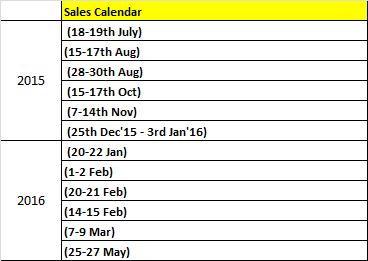

In [80]:
main_df['is_occassion']=main_df['order_date'].apply(lambda x: 1 if x in ["2015-07-01","2015-07-18","2015-07-19","2015-08-03","2015-08-15","2015-08-16","2015-08-17","2015-08-28","2015-08-29","2015-08-30",
                                                              "2015-09-07","2015-10-12","2015-10-15","2015-10-16","2015-10-17","2015-11-07","2015-11-08","2015-11-09","2015-11-10","2015-11-11",
                                                              "2015-11-12","2015-11-13","2015-11-14","2015-12-25","2015-12-26","2015-12-27","2015-12-28","2015-12-29","2015-12-30","2015-12-31",
                                                              "2016-01-01","2016-01-02","2016-01-03","2016-01-20","2016-01-21","2016-01-22","2016-02-01",
                                                              "2016-02-02","2016-02-14","2016-02-15","2016-02-20","2016-02-21","2016-03-07","2016-03-08","2016-03-09","2016-03-25","2016-05-23",
                                                              "2016-05-25","2016-05-26","2016-05-27"] else 0)
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0


#### Deriving a new column **Discount_per**.

Discount = ( ((product_mrp * units)- gmv) / (product_mrp * units) ) * 100

In [81]:
main_df['Discount_per'] = round (( ((main_df.product_mrp * main_df.units)- main_df.gmv) / (main_df.product_mrp * main_df.units) ) * 100, 2)
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92


In [82]:
min(main_df['Discount_per'] )

0.0

In [83]:
max(main_df['Discount_per'] )

100.0

#### Creating a new column **sales_price**

#### *sales_price* = GMV / Units

In [84]:
# Creating a new column into a specific position in a DataFrame
pos_index = main_df.columns.get_loc('gmv') + 1
main_df.insert(loc=pos_index,column='sales_price',value = main_df['gmv'] / main_df['units'])
main_df.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92


#### Creating a column called **Type_of_product** - Luxury / Mass_market
If GMV value is greater than 80 percentile, then luxury, else mass_market

In [85]:
pd.DataFrame(main_df['gmv']).describe(percentiles=[.70,.80,.90]).T

,count,mean,std,min,50%,70%,80%,90%,max
gmv,1464184.0,2483.960501,5622.345265,0.0,790.0,1599.0,2449.0,4300.0,226947.0


In [86]:
main_df['gmv'].quantile(.8)

2449.0

In [87]:
main_df['Type_of_product'] = main_df['gmv'].apply(lambda x:'luxury' if x >= 2449 else 'mass_market')
main_df.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market


### Outlier Treatment

In [88]:
main_df.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market


In [89]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1464184 entries, 0 to 1468781
Data columns (total 21 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   order_date                     1464184 non-null  datetime64[ns]
 1   Year                           1464184 non-null  object        
 2   Month                          1464184 non-null  object        
 3   Week                           1464184 non-null  object        
 4   gmv                            1464184 non-null  float64       
 5   sales_price                    1464184 non-null  float64       
 6   units                          1464184 non-null  int64         
 7   deliverybdays                  1464184 non-null  float64       
 8   deliverycdays                  1464184 non-null  float64       
 9   order_payment_type             1464184 non-null  object        
 10  sla                            1464184 non-null  int64

In [90]:
# numeric variables

numeric_vars = ['gmv', 'Discount_per' ,'deliverybdays','deliverycdays','sla','product_mrp','product_procurement_sla','sales_price']

#fuction to plot the boxplots for the above numeric variable list

def univariate_analysis(variable_list):
  plt.figure( figsize=(18,6) )
  for variable in variable_list:
    plt.subplot(2,4,variable_list.index(variable)+1 )
    #boxplot
    sns.boxplot(y=variable, data= main_df)
  plt.tight_layout()
  #diplay the plot
  plt.show()

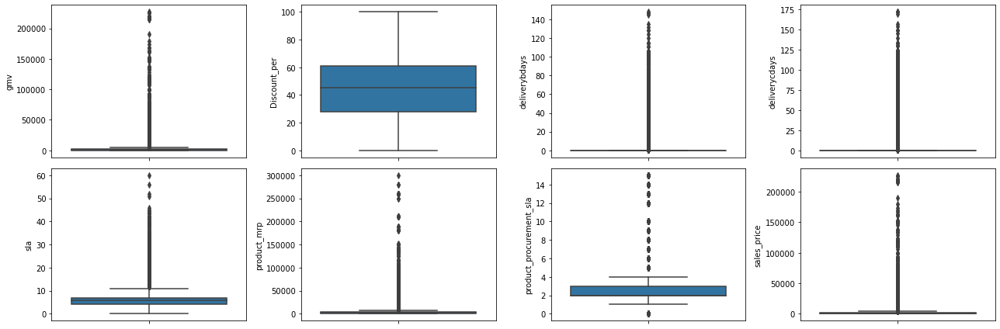

In [91]:
univariate_analysis(numeric_vars)

We can see so many outliers in the columns. But all outliers may not be random. But let's check carefully at it.

In [92]:
# Checking outliers at 25%, 50%, 75%, 90%, 95%, 99%

main_df[numeric_vars].describe(percentiles=[ 0.25,0.50, 0.75, 0.90, 0.95, 0.99 ]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1464184.0,2483.960501,5622.345265,0.0,349.00,790.00,1999.00,4300.00,11170.00,30499.0,226947.0
Discount_per,1464184.0,44.547489,22.777179,0.0,27.94,45.05,61.18,74.93,81.32,90.4,100.0
deliverybdays,1464184.0,1.031932,2.469678,0.0,0.00,0.00,0.00,5.00,6.00,8.0,148.0
deliverycdays,1464184.0,1.201824,2.875600,0.0,0.00,0.00,0.00,5.00,7.00,10.0,172.0
sla,1464184.0,5.759237,2.751173,0.0,4.00,6.00,7.00,9.00,10.00,13.0,60.0
product_mrp,1464184.0,4223.009874,8653.364948,49.0,849.00,1699.00,3499.00,7150.00,17995.00,45990.0,299999.0
product_procurement_sla,1464184.0,2.701308,1.786136,0.0,2.00,2.00,3.00,5.00,5.00,7.0,15.0
sales_price,1464184.0,2450.953962,5541.158874,0.0,349.00,775.00,1999.00,4299.00,10990.00,29746.0,226947.0


#### After analyzing above boxplots and the values distribution of above columns:

1. Columns **gmv**, **sales_price** and **product_mrp** can have occasional outliers considering the high sales during special sales. So we are keeping these column values as it is.

2. **Discount_per** has range from 0% to 100%. Products which comes as a free product with another product can be considerd as 100% discount.

3. Columns **deliverybdays**, **deliverycdays** and **sla** seems to have some noticable outliers. **So let's cap the values of these three columns upto 99 percentile.**

In [93]:
main_df[['deliverybdays', 'deliverycdays' ,'sla']].quantile([.95, .99])

,deliverybdays,deliverycdays,sla
0.95,6.0,7.0,10.0
0.99,8.0,10.0,13.0


#### Capping the values above 99 percentile to the value corresponding to 99 percentile.

In [94]:
# Updating the outlier values with values corresponding to pre-decided percentiles
main_df['deliverybdays'][np.abs(main_df['deliverybdays'] > 8.0)]= 8.0
main_df['deliverybdays'][np.abs(main_df['deliverybdays'] > 10.0)]= 10.0
main_df['sla'][np.abs(main_df['sla'] > 13.0)]= 13.0

In [95]:
print(round(100*(main_df.shape[0] / main_df_copy.shape[0])))

89


Thus we can see **89% records have been retained after outlier treatment**

In [96]:
# Checking outliers at 25%, 50%, 75%, 90%, 95%, 99%

main_df[numeric_vars].describe(percentiles=[ 0.25,0.50, 0.75, 0.90, 0.95, 0.99 ]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1464184.0,2483.960501,5622.345265,0.0,349.00,790.00,1999.00,4300.00,11170.00,30499.0,226947.0
Discount_per,1464184.0,44.547489,22.777179,0.0,27.94,45.05,61.18,74.93,81.32,90.4,100.0
deliverybdays,1464184.0,0.993989,2.061014,0.0,0.00,0.00,0.00,5.00,6.00,8.0,8.0
deliverycdays,1464184.0,1.201824,2.875600,0.0,0.00,0.00,0.00,5.00,7.00,10.0,172.0
sla,1464184.0,5.736949,2.666784,0.0,4.00,6.00,7.00,9.00,10.00,13.0,13.0
product_mrp,1464184.0,4223.009874,8653.364948,49.0,849.00,1699.00,3499.00,7150.00,17995.00,45990.0,299999.0
product_procurement_sla,1464184.0,2.701308,1.786136,0.0,2.00,2.00,3.00,5.00,5.00,7.0,15.0
sales_price,1464184.0,2450.953962,5541.158874,0.0,349.00,775.00,1999.00,4299.00,10990.00,29746.0,226947.0


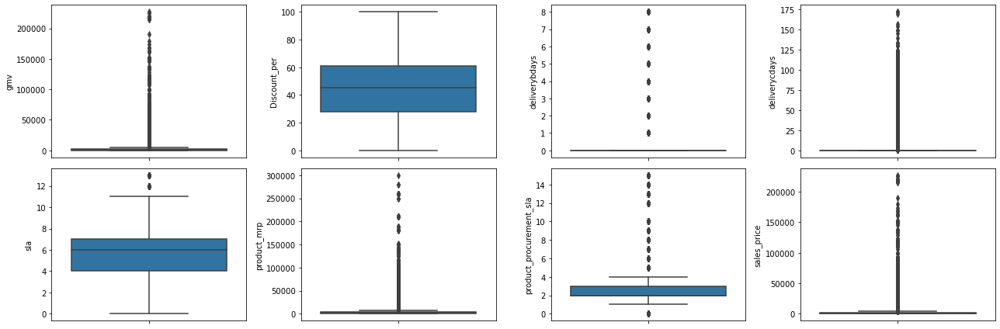

In [97]:
univariate_analysis(numeric_vars)

### Mapping months to number of weeks for the month
Below function takes input an year and generates the numbers of the weeks for each month in it

In [98]:
import calendar

def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)
            
        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [99]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [100]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

As we can see, there are a total of 52 weeks in our dataset

## 2. Media Investment

In [101]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


#### Imputing nulls with 0 for columns **Radio** and **Other**

In [102]:
media_investment['Radio'].fillna(value=0, inplace=True)
media_investment['Other'].fillna(value=0, inplace=True)

media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,0.0,0.0
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,0.0,0.0
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,0.0,0.0


In [103]:
# Temp DataFrame

media_investment_temp = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

media_investment_temp.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's divide the monthly values by the number of weeks in that month and take that as weekly data

In [104]:
i = 0

for index, row in media_investment.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:
            
            media_investment_temp.iloc[i].Year = row.Year
            media_investment_temp.iloc[i].Month = row.Month
            media_investment_temp.iloc[i]['Week'] = week
            media_investment_temp.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            media_investment_temp.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            media_investment_temp.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

    elif row.Year == 2016:
        
        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:
            
            media_investment_temp.iloc[i].Year = row.Year
            media_investment_temp.iloc[i].Month = row.Month
            media_investment_temp.iloc[i]['Week'] = week
            media_investment_temp.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            media_investment_temp.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            media_investment_temp.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            media_investment_temp.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

media_investment_temp.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [105]:
media_investment_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52 non-null     object
 1   Month              52 non-null     object
 2   Week               52 non-null     object
 3   Total Investment   52 non-null     object
 4   TV                 52 non-null     object
 5   Digital            52 non-null     object
 6   Sponsorship        52 non-null     object
 7   Content Marketing  52 non-null     object
 8   Online marketing   52 non-null     object
 9   Affiliates         52 non-null     object
 10  SEM                52 non-null     object
 11  Radio              52 non-null     object
 12  Other              52 non-null     object
dtypes: object(13)
memory usage: 5.4+ KB


In [106]:
media_investment_temp['Week'] = media_investment_temp['Week'].astype('str')

In [107]:
media_investment_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52 non-null     object
 1   Month              52 non-null     object
 2   Week               52 non-null     object
 3   Total Investment   52 non-null     object
 4   TV                 52 non-null     object
 5   Digital            52 non-null     object
 6   Sponsorship        52 non-null     object
 7   Content Marketing  52 non-null     object
 8   Online marketing   52 non-null     object
 9   Affiliates         52 non-null     object
 10  SEM                52 non-null     object
 11  Radio              52 non-null     object
 12  Other              52 non-null     object
dtypes: object(13)
memory usage: 5.4+ KB


In [108]:
media_investment = media_investment_temp

media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [109]:
# Let's check for duplicates
media_investment.duplicated('Week').value_counts()

False    52
dtype: int64

In [110]:
media_investment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52 non-null     object
 1   Month              52 non-null     object
 2   Week               52 non-null     object
 3   Total Investment   52 non-null     object
 4   TV                 52 non-null     object
 5   Digital            52 non-null     object
 6   Sponsorship        52 non-null     object
 7   Content Marketing  52 non-null     object
 8   Online marketing   52 non-null     object
 9   Affiliates         52 non-null     object
 10  SEM                52 non-null     object
 11  Radio              52 non-null     object
 12  Other              52 non-null     object
dtypes: object(13)
memory usage: 5.4+ KB


There are no duplicates

In [111]:
# Let's check for nulls

media_investment.isnull().sum()

Year                 0
Month                0
Week                 0
Total Investment     0
TV                   0
Digital              0
Sponsorship          0
Content Marketing    0
Online marketing     0
Affiliates           0
SEM                  0
Radio                0
Other                0
dtype: int64

There are no nulls as well.

In [112]:
# Let's drop Year and Month columns since we don't need them for our analysis.

del media_investment['Year']
del media_investment['Month']

media_investment.head()

,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [113]:
original_columns = media_investment.columns[1:]
original_columns

Index(['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], dtype='object')

#### Calculating 8-weeks Exponential Moving Average for all Advertising media channels

In [114]:
def ExpMovAvg_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_EMA_'+np.str(n),value=df[i].ewm(span=n, adjust=False).mean())
    return df

In [115]:
media_investment = ExpMovAvg_variables(media_investment,original_columns,8) 
media_investment.head()

,Week,Total Investment,Total Investment_EMA_8,TV,TV_EMA_8,Digital,Digital_EMA_8,Sponsorship,Sponsorship_EMA_8,Content Marketing,Content Marketing_EMA_8,Online marketing,Online marketing_EMA_8,Affiliates,Affiliates_EMA_8,SEM,SEM_EMA_8,Radio,Radio_EMA_8,Other,Other_EMA_8
0,28,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
1,29,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
2,30,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
3,31,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
4,32,1.013,3.542333,0.001,0.042222,0.256,0.549222,0.213,1.489333,0.0,0.0,0.026,0.264,0.015,0.109889,0.503,1.088667,0.0,0.0,0.0,0.0


#### Calculating 5-weeks Simple Moving Average for all Advertising media channels

In [116]:
def SimpleMovAvg_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_SMA_'+np.str(n),value=df[i].rolling(window=n).mean())
    return df

In [117]:
media_investment = SimpleMovAvg_variables(media_investment,original_columns,5) 
media_investment.head()

,Week,Total Investment,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_5,Other_EMA_8
0,28,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0.0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0.0,NaN,0.0,0.0,NaN,0.0
1,29,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0.0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0.0,NaN,0.0,0.0,NaN,0.0
2,30,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0.0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0.0,NaN,0.0,0.0,NaN,0.0
3,31,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0.0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0.0,NaN,0.0,0.0,NaN,0.0
4,32,1.013,3.6146,3.542333,0.001,0.0434,0.042222,0.256,0.5576,0.549222,0.213,1.5258,1.489333,0.0,0.0,0.0,0.026,0.2708,0.264,0.015,0.1126,0.109889,0.503,1.1054,1.088667,0.0,0.0,0.0,0.0,0.0,0.0


#### Calculating 3-weeks Simple Moving Average for all Advertising media channels

In [118]:
media_investment = SimpleMovAvg_variables(media_investment,original_columns,3) 
media_investment.head()

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8
0,28,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0.0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0
1,29,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0.0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0
2,30,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0.0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0
3,31,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0.0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0
4,32,1.013,3.181,3.6146,3.542333,0.001,0.036333,0.0434,0.042222,0.256,0.507333,0.5576,0.549222,0.213,1.307,1.5258,1.489333,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.015,0.096333,0.1126,0.109889,0.503,1.005,1.1054,1.088667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Let's calculate Ad Stock values for all Advertising media

In [119]:
# Generating TV Ad Stock values

def calculate_ad_stocks(data, engagement_factor):
    
    """initialize ad stock vectors"""
    TV_ad_stock_vector = []                     
    Digital_ad_stock_vector = []
    Sponsorship_ad_stock_vector = []
    Content_Marketing_ad_stock_vector = []
    Online_marketing_ad_stock_vector = []
    Affiliates_ad_stock_vector = []
    SEM_ad_stock_vector = []
    Radio_ad_stock_vector = []
    Other_ad_stock_vector = []
    Total_Investment_ad_stock_vector = []
    
    """initialize ad_stock_value"""
    tv_ad_stock_value = 0 
    Digital_ad_stock_value = 0
    Sponsorship_ad_stock_value = 0
    Content_Marketing_ad_stock_value = 0
    Online_marketing_ad_stock_value = 0
    Affiliates_ad_stock_value = 0
    SEM_ad_stock_value = 0
    Radio_ad_stock_value = 0
    Other_ad_stock_value = 0
    Total_Investment_ad_stock_value = 0
    
    """loop through dataset to calculate adstock values. The formula for adstock is: At = Xt + adstock rate * At-1."""
    for index, row in data.iterrows():
        tv_ad_stock_value = row['TV'] + engagement_factor * tv_ad_stock_value
        TV_ad_stock_vector.append(tv_ad_stock_value)
        Digital_ad_stock_value = row['Digital'] + engagement_factor * Digital_ad_stock_value
        Digital_ad_stock_vector.append(Digital_ad_stock_value)
        Sponsorship_ad_stock_value = row['Sponsorship'] + engagement_factor * Sponsorship_ad_stock_value
        Sponsorship_ad_stock_vector.append(Sponsorship_ad_stock_value)
        Content_Marketing_ad_stock_value = row['Content Marketing'] + engagement_factor * Content_Marketing_ad_stock_value
        Content_Marketing_ad_stock_vector.append(Content_Marketing_ad_stock_value)    
        Online_marketing_ad_stock_value = row['Online marketing'] + engagement_factor * Online_marketing_ad_stock_value
        Online_marketing_ad_stock_vector.append(Online_marketing_ad_stock_value)
        Affiliates_ad_stock_value = row['Affiliates'] + engagement_factor * Affiliates_ad_stock_value
        Affiliates_ad_stock_vector.append(Affiliates_ad_stock_value)
        SEM_ad_stock_value = row['SEM'] + engagement_factor * SEM_ad_stock_value
        SEM_ad_stock_vector.append(SEM_ad_stock_value)
        Radio_ad_stock_value = row['Radio'] + engagement_factor * Radio_ad_stock_value
        Radio_ad_stock_vector.append(Radio_ad_stock_value)
        Other_ad_stock_value = row['Other'] + engagement_factor * Other_ad_stock_value
        Other_ad_stock_vector.append(Other_ad_stock_value)
        Total_Investment_ad_stock_value = row['Total Investment'] + engagement_factor * Total_Investment_ad_stock_value
        Total_Investment_ad_stock_vector.append(Total_Investment_ad_stock_value)
    
    """add ad stock vector to dataset"""
    loc_index = data.columns.get_loc('TV_EMA_8') + 1
    data.insert(loc=loc_index,column='TV_Ad_Stock',value=TV_ad_stock_vector)
    loc_index = data.columns.get_loc('Digital_EMA_8') + 1
    data.insert(loc=loc_index,column='Digital_Ad_Stock',value=Digital_ad_stock_vector)
    loc_index = data.columns.get_loc('Sponsorship_EMA_8') + 1
    data.insert(loc=loc_index,column='Sponsorship_Ad_Stock',value=Sponsorship_ad_stock_vector)
    loc_index = data.columns.get_loc('Content Marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Content_Marketing_Ad_Stock',value=Content_Marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Online marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Online_marketing_Ad_Stock',value=Online_marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Affiliates_EMA_8') + 1
    data.insert(loc=loc_index,column='Affiliates_Ad_Stock',value=Affiliates_ad_stock_vector)
    loc_index = data.columns.get_loc('SEM_EMA_8') + 1
    data.insert(loc=loc_index,column='SEM_Ad_Stock',value=SEM_ad_stock_vector)
    loc_index = data.columns.get_loc('Radio_EMA_8') + 1
    data.insert(loc=loc_index,column='Radio_Ad_Stock',value=Radio_ad_stock_vector)
    loc_index = data.columns.get_loc('Other_EMA_8') + 1
    data.insert(loc=loc_index,column='Other_Ad_Stock',value=Other_ad_stock_vector)
    loc_index = data.columns.get_loc('Total Investment_EMA_8') + 1
    data.insert(loc=loc_index,column='Total_Investment_Ad_Stock',value=Total_Investment_ad_stock_vector)
    
    return data

In [120]:
# Assuming the value of Adstock rate(engagement factor)

media_investment = calculate_ad_stocks(data=media_investment, engagement_factor=0.6)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.265,NaN,NaN,4.265000,4.265000,0.054,NaN,NaN,0.054000,0.054000,0.633,NaN,NaN,0.633000,0.633000,1.854,NaN,NaN,1.854000,1.854000,0.0,NaN,NaN,0.000,0.000,0.332,NaN,NaN,0.332000,0.332000,0.137,NaN,NaN,0.137000,0.137000,1.256,NaN,NaN,1.256000,1.256000,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0.0,0.0
1,29,4.265,NaN,NaN,4.265000,6.824000,0.054,NaN,NaN,0.054000,0.086400,0.633,NaN,NaN,0.633000,1.012800,1.854,NaN,NaN,1.854000,2.966400,0.0,NaN,NaN,0.000,0.000,0.332,NaN,NaN,0.332000,0.531200,0.137,NaN,NaN,0.137000,0.219200,1.256,NaN,NaN,1.256000,2.009600,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0.0,0.0
2,30,4.265,4.265000,NaN,4.265000,8.359400,0.054,0.054000,NaN,0.054000,0.105840,0.633,0.633000,NaN,0.633000,1.240680,1.854,1.854000,NaN,1.854000,3.633840,0.0,0.000,NaN,0.000,0.000,0.332,0.332000,NaN,0.332000,0.650720,0.137,0.137000,NaN,0.137000,0.268520,1.256,1.256000,NaN,1.256000,2.461760,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0
3,31,4.265,4.265000,NaN,4.265000,9.280640,0.054,0.054000,NaN,0.054000,0.117504,0.633,0.633000,NaN,0.633000,1.377408,1.854,1.854000,NaN,1.854000,4.034304,0.0,0.000,NaN,0.000,0.000,0.332,0.332000,NaN,0.332000,0.722432,0.137,0.137000,NaN,0.137000,0.298112,1.256,1.256000,NaN,1.256000,2.733056,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0.0,0.000,0.0000,0.000,0.000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0.0,0.000,0.0000,0.000,0.000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0.0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0.0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0.0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,37,24.064,8.696667,5.6232,6.855364,25.898341,0.97,0.324000,0.1948,0.228066,0.976866,0.339,0.283667,0.2726,0.357904,0.757405,15.697,5.374333,3.3098,4.017169,16.179880,0.153,0.051,0.0306,0.034,0.153

In [121]:
media_investment.isnull().sum()

Week                          0
Total Investment              0
Total Investment_SMA_3        2
Total Investment_SMA_5        4
Total Investment_EMA_8        0
Total_Investment_Ad_Stock     0
TV                            0
TV_SMA_3                      2
TV_SMA_5                      4
TV_EMA_8                      0
TV_Ad_Stock                   0
Digital                       0
Digital_SMA_3                 2
Digital_SMA_5                 4
Digital_EMA_8                 0
Digital_Ad_Stock              0
Sponsorship                   0
Sponsorship_SMA_3             2
Sponsorship_SMA_5             4
Sponsorship_EMA_8             0
Sponsorship_Ad_Stock          0
Content Marketing             0
Content Marketing_SMA_3       2
Content Marketing_SMA_5       4
Content Marketing_EMA_8       0
Content_Marketing_Ad_Stock    0
Online marketing              0
Online marketing_SMA_3        2
Online marketing_SMA_5        4
Online marketing_EMA_8        0
Online_marketing_Ad_Stock     0
Affiliat

In [122]:
media_investment.fillna(value=0, inplace=True)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.265,0.000000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000000,0.0000,1.854000,1.854000,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,29,4.265,0.000000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000000,0.0000,1.854000,2.966400,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,30,4.265,4.265000,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854000,0.0000,1.854000,3.633840,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256000,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,31,4.265,4.265000,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854000,0.0000,1.854000,4.034304,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256000,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0.000,0.000,0.0000,0.000,0.000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0.000,0.000,0.0000,0.000,0.000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,37,24.06

In [123]:
media_investment.isnull().sum()

Week                          0
Total Investment              0
Total Investment_SMA_3        0
Total Investment_SMA_5        0
Total Investment_EMA_8        0
Total_Investment_Ad_Stock     0
TV                            0
TV_SMA_3                      0
TV_SMA_5                      0
TV_EMA_8                      0
TV_Ad_Stock                   0
Digital                       0
Digital_SMA_3                 0
Digital_SMA_5                 0
Digital_EMA_8                 0
Digital_Ad_Stock              0
Sponsorship                   0
Sponsorship_SMA_3             0
Sponsorship_SMA_5             0
Sponsorship_EMA_8             0
Sponsorship_Ad_Stock          0
Content Marketing             0
Content Marketing_SMA_3       0
Content Marketing_SMA_5       0
Content Marketing_EMA_8       0
Content_Marketing_Ad_Stock    0
Online marketing              0
Online marketing_SMA_3        0
Online marketing_SMA_5        0
Online marketing_EMA_8        0
Online_marketing_Ad_Stock     0
Affiliat

In [124]:
media_investment.shape

(52, 51)

## 3. NPS Score



### Let's generate weekly data from Year and Month for the nps score data

In [125]:
net_promoter_score

,Score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


### Let's reframe the above dataframe into appropriate format

In [126]:
# resetting index
net_promoter_score.reset_index(drop=True, inplace=True)

In [127]:
net_promoter_score

,Score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [128]:
# Transposing the dataframe
net_promoter_score = net_promoter_score.T

In [129]:
net_promoter_score

,0,1
Score,NPS,Stock Index
July'15,54.599588,1177.0
Aug'15,59.987101,1206.0
Sept'15,46.925419,1101.0
Oct'15,44.398389,1210.0
Nov'15,47.0,1233.0
Dec'15,45.8,1038.0
Jan'16,47.093031,1052.0
Feb'16,50.327406,1222.0
Mar'16,49.02055,1015.0


In [130]:
# resetting index
net_promoter_score.reset_index(drop=False, inplace=True)

net_promoter_score

,index,0,1
0,Score,NPS,Stock Index
1,July'15,54.599588,1177.0
2,Aug'15,59.987101,1206.0
3,Sept'15,46.925419,1101.0
4,Oct'15,44.398389,1210.0
5,Nov'15,47.0,1233.0
6,Dec'15,45.8,1038.0
7,Jan'16,47.093031,1052.0
8,Feb'16,50.327406,1222.0
9,Mar'16,49.02055,1015.0


In [131]:
# renaming columns
net_promoter_score.columns = ['Month', 'NPS', 'Stock Index']
net_promoter_score.drop(net_promoter_score.index[0], inplace=True)
net_promoter_score

,Month,NPS,Stock Index
1,July'15,54.599588,1177.0
2,Aug'15,59.987101,1206.0
3,Sept'15,46.925419,1101.0
4,Oct'15,44.398389,1210.0
5,Nov'15,47.0,1233.0
6,Dec'15,45.8,1038.0
7,Jan'16,47.093031,1052.0
8,Feb'16,50.327406,1222.0
9,Mar'16,49.02055,1015.0
10,Apr'16,51.827605,1242.0


In [132]:
nps_temp = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'NPS', 'Stock Index'])


nps_temp

,Year,Month,Week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN


In [133]:
nps_temp.shape

(52, 5)

### Let's use the same NPS Score and Stock Index values for each week of a month which is the NPS Score and Stock Index of the entire month

In [134]:
i = 0

for index, row in net_promoter_score.iterrows():

    if '15' in row['Month']:
        
        month1 = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2015[month1]:        
            
            nps_temp.iloc[i].Year = 2015
            nps_temp.iloc[i].Month = month1
            nps_temp.iloc[i].Week = week
            nps_temp.iloc[i].NPS = row['NPS']
            nps_temp.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1
        
    elif '16' in row['Month']:

        month1 = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2016[month1]:        
            
            nps_temp.iloc[i].Year = 2016
            nps_temp.iloc[i].Month = month1
            nps_temp.iloc[i].Week = week
            nps_temp.iloc[i].NPS = row['NPS']
            nps_temp.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1

nps_temp.head()

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [135]:
nps_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Year         52 non-null     object
 1   Month        52 non-null     object
 2   Week         52 non-null     object
 3   NPS          52 non-null     object
 4   Stock Index  52 non-null     object
dtypes: object(5)
memory usage: 2.2+ KB


In [136]:
nps_temp['Week'] = nps_temp['Week'].astype('str')

In [137]:
nps_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Year         52 non-null     object
 1   Month        52 non-null     object
 2   Week         52 non-null     object
 3   NPS          52 non-null     object
 4   Stock Index  52 non-null     object
dtypes: object(5)
memory usage: 2.2+ KB


In [138]:
net_promoter_score = nps_temp

net_promoter_score

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0
5,2015,Aug,33,59.987101,1206.0
6,2015,Aug,34,59.987101,1206.0
7,2015,Aug,35,59.987101,1206.0
8,2015,Aug,36,59.987101,1206.0
9,2015,Sep,37,46.925419,1101.0


In [139]:
# Checking for duplicates

net_promoter_score.duplicated('Week').value_counts()

False    52
dtype: int64

There are no duplicates

In [140]:
# checking for nulls

net_promoter_score.isnull().sum()

Year           0
Month          0
Week           0
NPS            0
Stock Index    0
dtype: int64

There are no nulls as well

In [141]:
# Let's drop Year and Month columns since we don't need them for our analysis.

del net_promoter_score['Year']
del net_promoter_score['Month']

net_promoter_score.head()

,Week,NPS,Stock Index
0,28,54.599588,1177.0
1,29,54.599588,1177.0
2,30,54.599588,1177.0
3,31,54.599588,1177.0
4,32,59.987101,1206.0


In [142]:
nps_original_columns = net_promoter_score.columns[1:]
nps_original_columns

Index(['NPS', 'Stock Index'], dtype='object')

### Calculating 5-weeks Simple Moving Average for NPS and Stock_Index

In [143]:
net_promoter_score = SimpleMovAvg_variables(net_promoter_score,nps_original_columns,5) 
net_promoter_score.head()

,Week,NPS,NPS_SMA_5,Stock Index,Stock Index_SMA_5
0,28,54.599588,NaN,1177.0,NaN
1,29,54.599588,NaN,1177.0,NaN
2,30,54.599588,NaN,1177.0,NaN
3,31,54.599588,NaN,1177.0,NaN
4,32,59.987101,55.677091,1206.0,1182.8


### Calculating 3-weeks Simple Moving Average for NPS and Stock_Index

In [144]:
net_promoter_score = SimpleMovAvg_variables(net_promoter_score,nps_original_columns,3) 
net_promoter_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.599588,NaN,NaN,1177.0,NaN,NaN
1,29,54.599588,NaN,NaN,1177.0,NaN,NaN
2,30,54.599588,54.599588,NaN,1177.0,1177.000000,NaN
3,31,54.599588,54.599588,NaN,1177.0,1177.000000,NaN
4,32,59.987101,56.395426,55.677091,1206.0,1186.666667,1182.8


In [145]:
net_promoter_score.fillna(value=0, inplace=True)
net_promoter_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,29,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,30,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,31,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,32,59.987101,56.395426,55.677091,1206.0,1186.666667,1182.8


## 4. Sale Calendar

Let's generate weekly data from Year and Month for the sale calendar data

In [146]:
sale_calendar

,Unnamed: 1,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [147]:
# Getting the data into required format

sale_calendar.columns = ['Year', 'Sale']

sale_calendar.Year = sale_calendar.Year.apply(lambda x: int(x))
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('th','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('rd','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('(','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace(')','').strip())

# Splitting 25-31 Dec into two different rows for the ease of weekly data generation

sale_calendar.iloc[5, sale_calendar.columns.get_loc('Sale')] = '25-31 Dec'
sale_calendar = sale_calendar.append({'Year' : 2016 , 'Sale' : '1-3 Jan'} , ignore_index=True)

sale_calendar.sort_values(by=['Year'], ascending = True, inplace = True)

sale_calendar

,Year,Sale
0,2015,18-19 July
1,2015,15-17 Aug
2,2015,28-30 Aug
3,2015,15-17 Oct
4,2015,7-14 Nov
5,2015,25-31 Dec
6,2016,20-22 Jan
7,2016,1-2 Feb
8,2016,20-21 Feb
9,2016,14-15 Feb


In [148]:
# Dropping '15-17 Oct' entry assuming it is erroneous

sale_calendar.drop(sale_calendar.index[3], inplace=True)

sale_calendar

,Year,Sale
0,2015,18-19 July
1,2015,15-17 Aug
2,2015,28-30 Aug
4,2015,7-14 Nov
5,2015,25-31 Dec
6,2016,20-22 Jan
7,2016,1-2 Feb
8,2016,20-21 Feb
9,2016,14-15 Feb
10,2016,7-9 Mar


In [149]:
# Temp DataFrame

sale_calendar_temp = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Sale'])

sale_calendar_temp

,Year,Month,Week,Sale
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN


Now, We will find the number of days in each week of a month on which there was a sale

In [150]:
i = 0
import datetime

for index, row in sale_calendar.iterrows():

    week_list = []
    month_list = []
    year_list = []

    date1, date2, month = re.split("[- ]", row.Sale)
    month = month[0:3] # Taking only the first 3 character of the month name
    year = row.Year
    
#     print("Date => {}-{}-{}".format(date1, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date1, month, year), "%d-%b-%Y").strftime("%V"))
#     print("Date => {}-{}-{}".format(date2, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date2, month, year), "%d-%b-%Y").strftime("%V"))
    
    date = int(date1)
    
    while date <= int(date2):
        
        # Extracting the week numbers of the range of dates in each month
        week = datetime.datetime.strptime('{}-{}-{}'.format(date, month, year), "%d-%b-%Y").strftime("%V")
        week_list.append(int(week))
        date+=1
    
    week_dict = dict.fromkeys(week_list, 0) # Generating a week list dictionary with default value as 0

    for j in week_list:
        week_dict[j] = week_dict[j] + 1

    for key, value in week_dict.items():
        sale_calendar_temp.iloc[i].Year = year
        sale_calendar_temp.iloc[i].Month = month
        sale_calendar_temp.iloc[i].Week = key
        sale_calendar_temp.iloc[i].Sale = value
        
        i+=1
    
sale_calendar_temp.dropna(axis=0, how='all', inplace=True) # Drop all rows which has all Nulls
sale_calendar_temp.sort_values(by=['Week'], ascending = True, inplace = True)

# Handling the special cases of 53 and 7 week numbers which appear twice
sale_calendar_temp.loc[sale_calendar_temp['Week'] == 53, 'Sale'] = sale_calendar_temp.loc[sale_calendar_temp['Week'] == 53, 'Sale'].sum()
sale_calendar_temp.loc[sale_calendar_temp['Week'] == 7, 'Sale'] = sale_calendar_temp.loc[sale_calendar_temp['Week'] == 7, 'Sale'].sum()

# Dropping the redundant 53 and 7 week numbers
sale_calendar_temp.drop_duplicates(subset=['Week'], keep='first', inplace=True)
sale_calendar_temp.reset_index(drop=True, inplace=True)

sale_calendar_temp.head()

,Year,Month,Week,Sale
0,2016,Jan,3,3
1,2016,Feb,5,2
2,2016,Feb,6,1
3,2016,Feb,7,3
4,2016,Mar,10,3


In [151]:
sale_calendar_temp['Week'] = sale_calendar_temp['Week'].astype('str')

In [152]:
sale_calendar = sale_calendar_temp

sale_calendar.head()

,Year,Month,Week,Sale
0,2016,Jan,3,3
1,2016,Feb,5,2
2,2016,Feb,6,1
3,2016,Feb,7,3
4,2016,Mar,10,3


In [153]:
# checking duplicates

sale_calendar.duplicated('Week').value_counts()

False    14
dtype: int64

There are no dulicates

In [154]:
# checking nulls

sale_calendar.isnull().sum()

Year     0
Month    0
Week     0
Sale     0
dtype: int64

There are no nulls.

In [155]:
# Let's drop Year and Month columns since we don't need them for our analysis.

del sale_calendar['Year']
del sale_calendar['Month']

sale_calendar.head()

,Week,Sale
0,3,3
1,5,2
2,6,1
3,7,3
4,10,3


## 5. Climate data - 2015 from excel ONTARIO-2015.csv

Let's  generate weekly data from date for the climate data of 2015

In [156]:
# Skipping the first 24 rows while reading the data to ignore the metadata

climate_data_2015 = pd.read_excel(r'ONTARIO-2015.xlsx', skiprows=24)

climate_data_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [157]:
climate_data_2015.shape

(365, 27)

In [158]:
climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    int64         
 2   Month                      365 non-null    int64         
 3   Day                        365 non-null    int64         
 4   Data Quality               229 non-null    object        
 5   Max Temp (°C)              216 non-null    float64       
 6   Max Temp Flag              13 non-null     object        
 7   Min Temp (°C)              190 non-null    float64       
 8   Min Temp Flag              39 non-null     object        
 9   Mean Temp (°C)             190 non-null    float64       
 10  Mean Temp Flag             39 non-null     object        
 11  Heat Deg Days (°C)         190 non-null    float64       
 12  Heat Deg

In [159]:
# Let's drop the columns having all null values

climate_data_2015.dropna(axis=1, thresh=1, inplace=True)

climate_data_2015.reset_index(drop=True, inplace=True)

climate_data_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN


In [160]:
climate_data_2015.shape

(365, 23)

In [161]:
climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           365 non-null    datetime64[ns]
 1   Year                365 non-null    int64         
 2   Month               365 non-null    int64         
 3   Day                 365 non-null    int64         
 4   Data Quality        229 non-null    object        
 5   Max Temp (°C)       216 non-null    float64       
 6   Max Temp Flag       13 non-null     object        
 7   Min Temp (°C)       190 non-null    float64       
 8   Min Temp Flag       39 non-null     object        
 9   Mean Temp (°C)      190 non-null    float64       
 10  Mean Temp Flag      39 non-null     object        
 11  Heat Deg Days (°C)  190 non-null    float64       
 12  Heat Deg Days Flag  39 non-null     object        
 13  Cool Deg Days (°C)  190 non-null    float64       

In [162]:
# let's drop the columns with only one distinct value

drop_columns = []

for col in climate_data_2015.columns:
    if 'Flag' in col:
        print(climate_data_2015[col].value_counts())
        print()
        drop_columns.append(col)

drop_columns.append('Data Quality')

climate_data_2015.drop(drop_columns, axis=1, inplace=True)

print(climate_data_2015.columns)

M    13
Name: Max Temp Flag, dtype: int64

M    39
Name: Min Temp Flag, dtype: int64

M    39
Name: Mean Temp Flag, dtype: int64

M    39
Name: Heat Deg Days Flag, dtype: int64

M    39
Name: Cool Deg Days Flag, dtype: int64

T    7
Name: Total Rain Flag, dtype: int64

T    9
Name: Total Snow Flag, dtype: int64

T    12
Name: Total Precip Flag, dtype: int64

T    2
Name: Snow on Grnd Flag, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [163]:
# Formatting column names

climate_data_2015.columns = [col.replace(' (°C)','').strip() for col in climate_data_2015.columns]

climate_data_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [164]:
climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          365 non-null    datetime64[ns]
 1   Year               365 non-null    int64         
 2   Month              365 non-null    int64         
 3   Day                365 non-null    int64         
 4   Max Temp           216 non-null    float64       
 5   Min Temp           190 non-null    float64       
 6   Mean Temp          190 non-null    float64       
 7   Heat Deg Days      190 non-null    float64       
 8   Cool Deg Days      190 non-null    float64       
 9   Total Rain (mm)    229 non-null    float64       
 10  Total Snow (cm)    229 non-null    float64       
 11  Total Precip (mm)  229 non-null    float64       
 12  Snow on Grnd (cm)  229 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 37.2 KB


In [165]:
climate_data_2015.shape

(365, 13)

In [166]:
# Let's drop the rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_data_2015.dropna(subset=cols, inplace=True)

climate_data_2015.reset_index(drop=True, inplace=True)

climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          190 non-null    datetime64[ns]
 1   Year               190 non-null    int64         
 2   Month              190 non-null    int64         
 3   Day                190 non-null    int64         
 4   Max Temp           190 non-null    float64       
 5   Min Temp           190 non-null    float64       
 6   Mean Temp          190 non-null    float64       
 7   Heat Deg Days      190 non-null    float64       
 8   Cool Deg Days      190 non-null    float64       
 9   Total Rain (mm)    190 non-null    float64       
 10  Total Snow (cm)    190 non-null    float64       
 11  Total Precip (mm)  190 non-null    float64       
 12  Snow on Grnd (cm)  190 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 19.4 KB


In [167]:
climate_data_2015.shape

(190, 13)

### Creating new column **Week** from the **Date/Time** column. 

In [168]:
climate_data_2015['Date/Time'] = climate_data_2015['Date/Time'].astype('str')

In [169]:
climate_data_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date/Time          190 non-null    object 
 1   Year               190 non-null    int64  
 2   Month              190 non-null    int64  
 3   Day                190 non-null    int64  
 4   Max Temp           190 non-null    float64
 5   Min Temp           190 non-null    float64
 6   Mean Temp          190 non-null    float64
 7   Heat Deg Days      190 non-null    float64
 8   Cool Deg Days      190 non-null    float64
 9   Total Rain (mm)    190 non-null    float64
 10  Total Snow (cm)    190 non-null    float64
 11  Total Precip (mm)  190 non-null    float64
 12  Snow on Grnd (cm)  190 non-null    float64
dtypes: float64(9), int64(3), object(1)
memory usage: 19.4+ KB


In [170]:
climate_data_2015['Week'] = climate_data_2015['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_data_2015['Week'] = climate_data_2015['Week'].apply(lambda x: str(x).lstrip('0'))

climate_data_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-01-01,2015,1,1,0.0,-8.5,-4.3,22.3,0.0,0.0,0.0,0.0,0.0,1
1,2015-01-02,2015,1,2,3.0,-3.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,1
2,2015-01-03,2015,1,3,2.5,-4.0,-0.8,18.8,0.0,24.0,0.0,24.0,0.0,1
3,2015-01-04,2015,1,4,2.5,0.0,1.3,16.7,0.0,0.0,1.0,1.0,0.0,1
4,2015-01-05,2015,1,5,-10.0,-13.5,-11.8,29.8,0.0,0.0,3.0,3.0,1.0,2


In [171]:
# Extracting July to Dec month's data as per our requirement.

climate_data_2015 = climate_data_2015[climate_data_2015['Month'] >= 7]
climate_data_2015.reset_index(drop=True, inplace=True)

climate_data_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27


In [172]:
# Let's sort the data by Week

climate_data_2015.sort_values(by=['Week'], ascending = True, inplace = True)

In [173]:
climate_data_2015.head(20)

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27
5,2015-07-07,2015,7,7,26.0,18.0,22.0,0.0,4.0,8.6,0.0,8.6,0.0,28
6,2015-07-08,2015,7,8,20.0,12.5,16.3,1.7,0.0,14.4,0.0,14.4,0.0,28
7,2015-07-09,2015,7,9,24.0,17.0,20.5,0.0,2.5,3.5,0.0,3.5,0.0,28
8,2015-07-10,2015,7,10,26.0,13.0,19.5,0.0,1.5,0.0,0.0,0.0,0.0,28
9,2015-07-11,2015,7,11,28.0,13.5,20.8,0.0,2.8,0.0,0.0,0.0,0.0,28


In [174]:
# Getting weekly data

climate_data_2015 = climate_data_2015.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_data_2015.head(20)

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,28.0,10.0,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.350000,0.0,0.350000,0.0
6,33,31.0,14.5,23.950000,0.000000,5.950000,2.900000,0.0,2.900000,0.0
7,34,31.5,15.0,23.450000,0.000000,5.450000,5.133333,0.0,5.133333,0.0
8,35,29.0,14.0,20.250000,0.750000,3.000000,0.000000,0.0,0.000000,0.0
9,36,32.0,17.5,24.460000,0.000000,6.460000,12.120000,0.0,12.120000,0.0


In [175]:
# Let's drop 27th week data as it belongs to June 2015

climate_data_2015.drop(climate_data_2015[climate_data_2015['Week'] == '27'].index, inplace = True)

In [176]:
# Checking duplicates

climate_data_2015.duplicated().any()

False

There are no duplicates

In [177]:
# Checking nulls

climate_data_2015.isnull().sum()

Week                 0
Max Temp             0
Min Temp             0
Mean Temp            0
Heat Deg Days        0
Cool Deg Days        0
Total Rain (mm)      0
Total Snow (cm)      0
Total Precip (mm)    0
Snow on Grnd (cm)    0
dtype: int64

There are no nulls

## 6. Climate data - 2016 from excel ONTARIO-2016.csv

Let's  generate weekly data from date for the climate data of 2016


In [178]:
# Skipping the first 24 rows while reading the data to ignore the metadata

climate_data_2016 = pd.read_excel(r'ONTARIO-2016.xlsx', skiprows=24)

climate_data_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [179]:
climate_data_2016.shape

(366, 27)

In [180]:
climate_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    int64         
 2   Month                      366 non-null    int64         
 3   Day                        366 non-null    int64         
 4   Data Quality               227 non-null    object        
 5   Max Temp (°C)              226 non-null    float64       
 6   Max Temp Flag              1 non-null      object        
 7   Min Temp (°C)              219 non-null    float64       
 8   Min Temp Flag              8 non-null      object        
 9   Mean Temp (°C)             219 non-null    float64       
 10  Mean Temp Flag             8 non-null      object        
 11  Heat Deg Days (°C)         219 non-null    float64       
 12  Heat Deg

In [181]:
# Let's drop the columns having all null values

climate_data_2016.dropna(axis=1, thresh=1, inplace=True)

climate_data_2016.reset_index(drop=True, inplace=True)

climate_data_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [182]:
climate_data_2016.shape

(366, 23)

In [183]:
climate_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           366 non-null    datetime64[ns]
 1   Year                366 non-null    int64         
 2   Month               366 non-null    int64         
 3   Day                 366 non-null    int64         
 4   Data Quality        227 non-null    object        
 5   Max Temp (°C)       226 non-null    float64       
 6   Max Temp Flag       1 non-null      object        
 7   Min Temp (°C)       219 non-null    float64       
 8   Min Temp Flag       8 non-null      object        
 9   Mean Temp (°C)      219 non-null    float64       
 10  Mean Temp Flag      8 non-null      object        
 11  Heat Deg Days (°C)  219 non-null    float64       
 12  Heat Deg Days Flag  8 non-null      object        
 13  Cool Deg Days (°C)  219 non-null    float64       

In [184]:
# let's drop the columns with only one distinct value

drop_columns = []

for col in climate_data_2016.columns:
    if 'Flag' in col:
        print(climate_data_2016[col].value_counts())
        print()
        drop_columns.append(col)

drop_columns.append('Data Quality')

climate_data_2016.drop(drop_columns, axis=1, inplace=True)

print(climate_data_2016.columns)

M    1
Name: Max Temp Flag, dtype: int64

M    8
Name: Min Temp Flag, dtype: int64

M    8
Name: Mean Temp Flag, dtype: int64

M    8
Name: Heat Deg Days Flag, dtype: int64

M    8
Name: Cool Deg Days Flag, dtype: int64

T    3
Name: Total Rain Flag, dtype: int64

T    7
Name: Total Snow Flag, dtype: int64

T    7
Name: Total Precip Flag, dtype: int64

T    6
Name: Snow on Grnd Flag, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [185]:
climate_data_2016.shape

(366, 13)

In [186]:
climate_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           366 non-null    datetime64[ns]
 1   Year                366 non-null    int64         
 2   Month               366 non-null    int64         
 3   Day                 366 non-null    int64         
 4   Max Temp (°C)       226 non-null    float64       
 5   Min Temp (°C)       219 non-null    float64       
 6   Mean Temp (°C)      219 non-null    float64       
 7   Heat Deg Days (°C)  219 non-null    float64       
 8   Cool Deg Days (°C)  219 non-null    float64       
 9   Total Rain (mm)     227 non-null    float64       
 10  Total Snow (cm)     227 non-null    float64       
 11  Total Precip (mm)   227 non-null    float64       
 12  Snow on Grnd (cm)   227 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory 

In [187]:
# Formatting column names

climate_data_2016.columns = [col.replace(' (°C)','').strip() for col in climate_data_2016.columns]

climate_data_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [188]:
# Let's drop the rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_data_2016.dropna(subset=cols, inplace=True)

climate_data_2016.reset_index(drop=True, inplace=True)

climate_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date/Time          219 non-null    datetime64[ns]
 1   Year               219 non-null    int64         
 2   Month              219 non-null    int64         
 3   Day                219 non-null    int64         
 4   Max Temp           219 non-null    float64       
 5   Min Temp           219 non-null    float64       
 6   Mean Temp          219 non-null    float64       
 7   Heat Deg Days      219 non-null    float64       
 8   Cool Deg Days      219 non-null    float64       
 9   Total Rain (mm)    219 non-null    float64       
 10  Total Snow (cm)    219 non-null    float64       
 11  Total Precip (mm)  219 non-null    float64       
 12  Snow on Grnd (cm)  219 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory usage: 22.4 KB


In [189]:
climate_data_2016.shape

(219, 13)

### Creating new column **Week** from the **Date/Time** column. 

In [190]:
climate_data_2016['Date/Time'] = climate_data_2016['Date/Time'].astype('str')

In [191]:
climate_data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date/Time          219 non-null    object 
 1   Year               219 non-null    int64  
 2   Month              219 non-null    int64  
 3   Day                219 non-null    int64  
 4   Max Temp           219 non-null    float64
 5   Min Temp           219 non-null    float64
 6   Mean Temp          219 non-null    float64
 7   Heat Deg Days      219 non-null    float64
 8   Cool Deg Days      219 non-null    float64
 9   Total Rain (mm)    219 non-null    float64
 10  Total Snow (cm)    219 non-null    float64
 11  Total Precip (mm)  219 non-null    float64
 12  Snow on Grnd (cm)  219 non-null    float64
dtypes: float64(9), int64(3), object(1)
memory usage: 22.4+ KB


In [192]:
climate_data_2016['Week'] = climate_data_2016['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_data_2016['Week'] = climate_data_2016['Week'].apply(lambda x: str(x).lstrip('0'))

climate_data_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [193]:
# Extracting Jan to June month's data

climate_data_2016 = climate_data_2016[climate_data_2016['Month'] <= 6]
climate_data_2016.reset_index(drop=True, inplace=True)

climate_data_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [194]:
climate_data_2016.tail()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
88,2016-06-24,2016,6,24,29.0,13.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,25
89,2016-06-25,2016,6,25,30.5,13.0,21.8,0.0,3.8,0.0,0.0,0.0,0.0,25
90,2016-06-26,2016,6,26,34.0,18.5,26.3,0.0,8.3,3.2,0.0,3.2,0.0,25
91,2016-06-27,2016,6,27,34.5,20.0,27.3,0.0,9.3,0.0,0.0,0.0,0.0,26
92,2016-06-30,2016,6,30,30.0,13.0,21.5,0.0,3.5,2.0,0.0,2.0,0.0,26


In [195]:
# Let's sort the data by Week

climate_data_2016.sort_values(by=['Week'], ascending = True, inplace = True)

In [196]:
climate_data_2016.head(10)

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
23,2016-03-13,2016,3,13,11.0,5.0,8.0,10.0,0.0,23.8,0.0,23.8,0.0,10
22,2016-03-09,2016,3,9,20.0,9.0,14.5,3.5,0.0,3.2,0.0,3.2,0.0,10
21,2016-03-07,2016,3,7,18.0,-2.0,8.0,10.0,0.0,0.0,0.0,0.0,0.0,10
27,2016-03-18,2016,3,18,11.0,-2.5,4.3,13.7,0.0,0.0,0.0,0.0,0.0,11
26,2016-03-17,2016,3,17,13.5,5.5,9.5,8.5,0.0,0.0,0.0,0.0,0.0,11
25,2016-03-16,2016,3,16,16.0,5.5,10.8,7.2,0.0,0.8,0.0,0.8,0.0,11
24,2016-03-15,2016,3,15,15.0,7.0,11.0,7.0,0.0,1.2,0.0,1.2,0.0,11


In [197]:
# Getting weekly data

climate_data_2016 = climate_data_2016.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_data_2016.head(10)

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.0
1,10,20.0,-2.0,10.166667,7.833333,0.0,9.000000,0.000000,9.000000,0.0
2,11,16.0,-2.5,8.900000,9.100000,0.0,0.500000,0.000000,0.500000,0.0
3,12,20.5,-3.5,5.720000,12.280000,0.0,12.800000,0.000000,12.800000,0.0
4,13,16.0,-5.0,6.871429,11.128571,0.0,2.828571,0.542857,3.371429,0.0
5,14,11.5,-8.5,1.250000,16.750000,0.0,2.350000,0.550000,2.900000,0.0
6,15,24.0,-2.0,9.920000,8.080000,0.0,0.000000,0.000000,0.000000,0.0
7,16,25.0,4.0,12.625000,5.375000,0.0,0.000000,0.000000,0.000000,0.0
8,17,22.5,4.0,10.433333,7.566667,0.0,5.266667,0.000000,5.266667,0.0
9,18,22.5,3.5,11.920000,6.080000,0.0,2.160000,0.000000,2.160000,0.0


In [198]:
# Checking duplicates

climate_data_2016.duplicated().any()

False

There are no duplicates

In [199]:
# Checking nulls

climate_data_2016.isnull().sum()

Week                 0
Max Temp             0
Min Temp             0
Mean Temp            0
Heat Deg Days        0
Cool Deg Days        0
Total Rain (mm)      0
Total Snow (cm)      0
Total Precip (mm)    0
Snow on Grnd (cm)    0
dtype: int64

There are no nulls

## List Difference function

In [200]:
def list_diff(list1, list2): 
    return (list(set(list1) - set(list2)))

## Concatenating Climate Datasets

In [201]:
print(list_diff(list(climate_data_2015.columns), list(climate_data_2016.columns)))

[]


In [202]:
print(climate_data_2015.shape)
print(climate_data_2016.shape)

(26, 10)
(25, 10)


Let's concatenate the climate data sets to form a single one to be merged with the order data set


In [203]:
climate_2015_2016 = pd.concat([climate_data_2015, climate_data_2016], axis = 0)

climate_2015_2016.shape

(51, 10)

In [204]:
climate_2015_2016.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51 entries, 1 to 24
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Week               51 non-null     object 
 1   Max Temp           51 non-null     float64
 2   Min Temp           51 non-null     float64
 3   Mean Temp          51 non-null     float64
 4   Heat Deg Days      51 non-null     float64
 5   Cool Deg Days      51 non-null     float64
 6   Total Rain (mm)    51 non-null     float64
 7   Total Snow (cm)    51 non-null     float64
 8   Total Precip (mm)  51 non-null     float64
 9   Snow on Grnd (cm)  51 non-null     float64
dtypes: float64(9), object(1)
memory usage: 4.4+ KB


In [205]:
climate_2015_2016.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.350000,0.0,0.350000,0.0


In [206]:
climate_2015_2016.Week.unique()

array(['28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38',
       '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49',
       '50', '51', '52', '53', '1', '10', '11', '12', '13', '14', '15',
       '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25',
       '26', '4', '5', '6', '7', '8', '9'], dtype=object)

In [207]:
climate_2015_2016.Week.unique().shape

(51,)

## As stated in problem statement, let's extract seperate dataframes for 3 product subcategories - **camera accessory**, **home audio** and **gaming accessory**

In [208]:
main_df.shape

(1464184, 21)

In [209]:
main_df['product_analytic_sub_category'].value_counts()

Speaker                468307
CameraAccessory        215901
GamingAccessory        185876
TVVideoSmall           133192
HomeAudio              111061
AudioMP3Player         103463
Game                    96839
Camera                  87552
GamingConsole           26984
CameraStorage           16558
AudioAccessory          10702
HomeTheatre              4197
AmplifierReceiver        3455
GameMembershipCards        97
Name: product_analytic_sub_category, dtype: int64

In [210]:
eleckart_CameraAccessory = main_df.loc[main_df['product_analytic_sub_category']=='CameraAccessory']
eleckart_GamingAccessory = main_df.loc[main_df['product_analytic_sub_category']=='GamingAccessory']
eleckart_HomeAudio = main_df.loc[main_df['product_analytic_sub_category']=='HomeAudio']

In [211]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(215901, 21)
(185876, 21)
(111061, 21)


In [212]:
eleckart_CameraAccessory.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market


### Lets convert some binary variables to numeric format

In [213]:
eleckart_CameraAccessory['is_cod'] = eleckart_CameraAccessory['order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
eleckart_GamingAccessory['is_cod'] = eleckart_GamingAccessory['order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
eleckart_HomeAudio['is_cod'] = eleckart_HomeAudio['order_payment_type'].apply(lambda x:1 if x=='cod' else 0)

eleckart_CameraAccessory['is_mass_market'] = eleckart_CameraAccessory['Type_of_product'].apply(lambda x:1 if x=='mass_market' else 0)
eleckart_GamingAccessory['is_mass_market'] = eleckart_GamingAccessory['Type_of_product'].apply(lambda x:1 if x=='mass_market' else 0)
eleckart_HomeAudio['is_mass_market'] = eleckart_HomeAudio['Type_of_product'].apply(lambda x:1 if x=='mass_market' else 0)

eleckart_CameraAccessory.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product,is_cod,is_mass_market
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market,0,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market,0,1


### Deleting columns **order_payment_type** and **Type_of_product**

In [214]:
drop_columns = ['order_payment_type','Type_of_product']

eleckart_CameraAccessory.drop(drop_columns, axis=1, inplace=True)
eleckart_GamingAccessory.drop(drop_columns, axis=1, inplace=True)
eleckart_HomeAudio.drop(drop_columns, axis=1, inplace=True)

eleckart_CameraAccessory.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,is_cod,is_mass_market
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,0,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,0,1


### Creating dummy columns for categorical variable(product_analytic_vertical) with multiple levels.

In [215]:
# Creating dummy variables for the remaining categorical variable
dummy1 = pd.get_dummies(eleckart_CameraAccessory[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy2 = pd.get_dummies(eleckart_GamingAccessory[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy3 = pd.get_dummies(eleckart_HomeAudio[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)

# Adding the results to the original dataframes
eleckart_CameraAccessory = pd.concat([eleckart_CameraAccessory, dummy1], axis=1)
eleckart_GamingAccessory = pd.concat([eleckart_GamingAccessory, dummy2], axis=1)
eleckart_HomeAudio = pd.concat([eleckart_HomeAudio, dummy3], axis=1)

In [216]:
eleckart_CameraAccessory.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


### Dropping the **product_analytic_vertical** variable

In [217]:
eleckart_CameraAccessory = eleckart_CameraAccessory.drop('product_analytic_vertical', axis=1)
eleckart_GamingAccessory = eleckart_GamingAccessory.drop('product_analytic_vertical', axis=1)
eleckart_HomeAudio = eleckart_HomeAudio.drop('product_analytic_vertical', axis=1)

In [218]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(215901, 43)
(185876, 34)
(111061, 30)


### Checking unique values in 3 newly created dataframes

In [219]:
# Unique value frequencies - eleckart_CameraAccessory
unique_values = pd.DataFrame(eleckart_CameraAccessory.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(eleckart_CameraAccessory.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_category,1,object
is_cod,1,int64
is_occassion,1,int64
product_analytic_sub_category,1,object
product_vertical_CameraEyeCup,2,uint8


In [220]:
# Unique value frequencies - eleckart_GamingAccessory
unique_values = pd.DataFrame(eleckart_GamingAccessory.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(eleckart_GamingAccessory.dtypes)
unique_values.head()

,Unique Value Count,dtype
is_occassion,1,int64
product_analytic_sub_category,1,object
product_analytic_category,1,object
is_cod,1,int64
product_vertical_GamingMouse,2,uint8


In [221]:
# Unique value frequencies - eleckart_HomeAudio
unique_values = pd.DataFrame(eleckart_HomeAudio.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(eleckart_HomeAudio.dtypes)
unique_values.head()

,Unique Value Count,dtype
is_occassion,1,int64
is_cod,1,int64
product_analytic_sub_category,1,object
product_analytic_category,1,object
product_vertical_SoundMixer,2,uint8


We can see that in all 3 dataframes, columns 'product_analytic_category' & 'product_analytic_sub_category' have only 1 unique value. Hence we will drop these 2 columns from the 3 dataframes.

In [222]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ['product_analytic_category', 'product_analytic_sub_category']

eleckart_CameraAccessory.drop(drop_columns, axis=1, inplace=True)
eleckart_GamingAccessory.drop(drop_columns, axis=1, inplace=True)
eleckart_HomeAudio.drop(drop_columns, axis=1, inplace=True)

In [223]:
eleckart_CameraAccessory.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,sla,pincode,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,5,-7.79175582905735E+018,7190.0,0,0,0,10.99,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,7,7.33541149097431E+018,7190.0,0,0,0,4.03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,10,-7.47768776228657E+018,2099.0,3,0,0,5.19,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,4,-5.83593163877661E+018,2099.0,3,1,0,19.49,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,6,5.34735360997242E+017,2099.0,3,0,0,22.92,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [224]:
# checking null values

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

False
False
False


There are no null values.

In [225]:
eleckart_CameraAccessory.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215901 entries, 0 to 1465000
Data columns (total 41 columns):
 #   Column                                 Non-Null Count   Dtype         
---  ------                                 --------------   -----         
 0   order_date                             215901 non-null  datetime64[ns]
 1   Year                                   215901 non-null  object        
 2   Month                                  215901 non-null  object        
 3   Week                                   215901 non-null  object        
 4   gmv                                    215901 non-null  float64       
 5   sales_price                            215901 non-null  float64       
 6   units                                  215901 non-null  int64         
 7   deliverybdays                          215901 non-null  float64       
 8   deliverycdays                          215901 non-null  float64       
 9   sla                                    215901 n

### Grouing by Week to get the wekly level data by taking mean of all the values per week.

In [226]:
eleckart_CameraAccessory = eleckart_CameraAccessory.groupby(['Week']).agg({'gmv':"sum",'Discount_per':'mean','deliverybdays': "mean", \
                                          'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'Payday':'sum','is_occassion':'sum','is_cod':'sum', 'is_mass_market':'sum', \
                                          'product_vertical_CameraAccessory':'sum', \
                                          'product_vertical_CameraBag':'sum', 'product_vertical_CameraBattery':'sum', \
                                          'product_vertical_CameraBatteryCharger':'sum', 'product_vertical_CameraBatteryGrip': \
                                          'sum','product_vertical_CameraEyeCup':'sum','product_vertical_CameraFilmRolls':'sum', \
                                          'product_vertical_CameraHousing':'sum','product_vertical_CameraLEDLight':'sum', \
                                          'product_vertical_CameraMicrophone':'sum','product_vertical_CameraMount':'sum', \
                                          'product_vertical_CameraRemoteControl':'sum', 'product_vertical_CameraTripod':'sum', \
                                          'product_vertical_ExtensionTube':'sum', 'product_vertical_Filter':'sum', \
                                          'product_vertical_Flash':'sum','product_vertical_FlashShoeAdapter':'sum', \
                                          'product_vertical_Lens':'sum','product_vertical_ReflectorUmbrella':'sum', \
                                          'product_vertical_Softbox':'sum','product_vertical_Strap':'sum', \
                                          'product_vertical_Teleconverter':'sum','product_vertical_Telescope':'sum'}) \
.reset_index(drop=False)

In [227]:
eleckart_CameraAccessory.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,Payday,is_occassion,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,0,0,0,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,1474,0,0,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,0,0,0,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,1054,0,0,3148,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38
4,05,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,0,0,0,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43


In [228]:
eleckart_CameraAccessory.shape

(51, 34)

In [229]:
eleckart_GamingAccessory.columns

Index(['order_date', 'Year', 'Month', 'Week', 'gmv', 'sales_price', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'pincode', 'product_mrp', 'product_procurement_sla', 'Payday', 'is_occassion', 'Discount_per', 'is_cod', 'is_mass_market', 'product_vertical_GameControlMount', 'product_vertical_GamePad', 'product_vertical_GamingAccessoryKit', 'product_vertical_GamingAdapter', 'product_vertical_GamingChargingStation', 'product_vertical_GamingHeadset', 'product_vertical_GamingKeyboard', 'product_vertical_GamingMemoryCard', 'product_vertical_GamingMouse', 'product_vertical_GamingMousePad', 'product_vertical_GamingSpeaker', 'product_vertical_JoystickGamingWheel', 'product_vertical_MotionController', 'product_vertical_TVOutCableAccessory'], dtype='object')

In [230]:
eleckart_GamingAccessory = eleckart_GamingAccessory.groupby(['Week']).agg({'gmv':"sum",'Discount_per':'mean','deliverybdays': "mean", \
                                                                          'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                                               'Payday':'sum','is_occassion':'sum','is_cod':'sum', 'is_mass_market':'sum',
                                                               'product_vertical_GameControlMount':'sum', \
                                                               'product_vertical_GamePad':'sum', \
                                                               'product_vertical_GamingAccessoryKit':'sum', \
                                                               'product_vertical_GamingAdapter':'sum', \
                                                               'product_vertical_GamingChargingStation':'sum', \
                                                               'product_vertical_GamingHeadset':'sum', \
                                                               'product_vertical_GamingKeyboard':'sum', \
                                                               'product_vertical_GamingMemoryCard':'sum', \
                                                               'product_vertical_GamingMouse':'sum', \
                                                               'product_vertical_GamingMousePad':'sum', \
                                                               'product_vertical_GamingSpeaker':'sum', 
                                                               'product_vertical_JoystickGamingWheel':'sum', \
                                                               'product_vertical_MotionController':'sum', \
                                                               'product_vertical_TVOutCableAccessory':'sum'}) \
.reset_index(drop=False)
eleckart_GamingAccessory.shape

(52, 25)

In [231]:
eleckart_HomeAudio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 111061 entries, 2783 to 1467163
Data columns (total 28 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   order_date                         111061 non-null  datetime64[ns]
 1   Year                               111061 non-null  object        
 2   Month                              111061 non-null  object        
 3   Week                               111061 non-null  object        
 4   gmv                                111061 non-null  float64       
 5   sales_price                        111061 non-null  float64       
 6   units                              111061 non-null  int64         
 7   deliverybdays                      111061 non-null  float64       
 8   deliverycdays                      111061 non-null  float64       
 9   sla                                111061 non-null  int64         
 10  pincode         

In [232]:
eleckart_HomeAudio.columns

Index(['order_date', 'Year', 'Month', 'Week', 'gmv', 'sales_price', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'pincode', 'product_mrp', 'product_procurement_sla', 'Payday', 'is_occassion', 'Discount_per', 'is_cod', 'is_mass_market', 'product_vertical_DJController', 'product_vertical_Dock', 'product_vertical_DockingStation', 'product_vertical_FMRadio', 'product_vertical_HiFiSystem', 'product_vertical_HomeAudioSpeaker', 'product_vertical_KaraokePlayer', 'product_vertical_SlingBox', 'product_vertical_SoundMixer', 'product_vertical_VoiceRecorder'], dtype='object')

In [233]:
eleckart_HomeAudio = eleckart_HomeAudio.groupby(['Week']).agg({'gmv':"sum",'Discount_per':'mean','deliverybdays': "mean", \
                                                    'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                                    'Payday':'sum','is_occassion':'sum','is_cod':'sum', 'is_mass_market':'sum', \
                                                   'product_vertical_DJController':'sum', \
                                                   'product_vertical_Dock':'sum', 'product_vertical_DockingStation':'sum', \
                                                   'product_vertical_FMRadio':'sum', 'product_vertical_HiFiSystem':'sum', \
                                                   'product_vertical_HomeAudioSpeaker':'sum', \
                                                   'product_vertical_KaraokePlayer':'sum', 'product_vertical_SlingBox':'sum', \
                                                   'product_vertical_SoundMixer':'sum','product_vertical_VoiceRecorder':'sum'})\
.reset_index(drop=False)
eleckart_HomeAudio.shape

(49, 21)

### Now Calculating Payday week & Holiday week

If Payday falls within the week(Payday > 0), then payday week = 1, else 0

If holiday falls within the week(is_occassion > 0), then holiday week = 1, else 0

In [234]:
eleckart_CameraAccessory['payday_week'] = eleckart_CameraAccessory['Payday'].apply(lambda x:1 if x > 0 else 0)
eleckart_GamingAccessory['payday_week'] = eleckart_GamingAccessory['Payday'].apply(lambda x:1 if x > 0 else 0)
eleckart_HomeAudio['payday_week'] = eleckart_HomeAudio['Payday'].apply(lambda x:1 if x > 0 else 0)

eleckart_CameraAccessory['holiday_week'] = eleckart_CameraAccessory['is_occassion'].apply(lambda x:1 if x > 0 else 0)
eleckart_GamingAccessory['holiday_week'] = eleckart_GamingAccessory['is_occassion'].apply(lambda x:1 if x > 0 else 0)
eleckart_HomeAudio['holiday_week'] = eleckart_HomeAudio['is_occassion'].apply(lambda x:1 if x > 0 else 0)

eleckart_CameraAccessory.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,Payday,is_occassion,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,0,0,0,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,1474,0,0,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,0,0,0,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37,0,0
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,1054,0,0,3148,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0
4,05,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,0,0,0,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,0


In [235]:
# Deleting columns Payday and is_occassion

drop_columns = ['Payday','is_occassion']

eleckart_CameraAccessory = eleckart_CameraAccessory.drop(drop_columns, axis=1)
eleckart_GamingAccessory = eleckart_GamingAccessory.drop(drop_columns, axis=1)
eleckart_HomeAudio = eleckart_HomeAudio.drop(drop_columns, axis=1)

eleckart_CameraAccessory.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,0,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,0,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,0,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37,0,0
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,0,3148,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0
4,05,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,0,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,0


In [236]:
eleckart_CameraAccessory.shape

(51, 34)

In [237]:
eleckart_GamingAccessory.shape

(52, 25)

In [238]:
eleckart_HomeAudio.shape

(49, 21)

## Dataframes Merging

In [239]:
# checking unique values in Week column for all the three dataframes

eleckart_CameraAccessory.Week.unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '28', '29', '30', '31', '32', '33', '35',
       '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46',
       '47', '48', '49', '50', '51', '52', '53'], dtype=object)

In [240]:
eleckart_GamingAccessory.Week.unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '28', '29', '30', '31', '32', '33', '34',
       '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45',
       '46', '47', '48', '49', '50', '51', '52', '53'], dtype=object)

In [241]:
eleckart_HomeAudio.Week.unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '28', '29', '30', '31', '32', '36', '37',
       '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53'], dtype=object)

In [242]:
# Formatting pre merge

eleckart_CameraAccessory.Week = eleckart_CameraAccessory.Week.apply(lambda x: x.lstrip('0'))
eleckart_GamingAccessory.Week = eleckart_GamingAccessory.Week.apply(lambda x: x.lstrip('0'))
eleckart_HomeAudio.Week = eleckart_HomeAudio.Week.apply(lambda x: x.lstrip('0'))

In [243]:
eleckart_HomeAudio.Week.unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '28', '29', '30', '31', '32', '36', '37', '38',
       '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49',
       '50', '51', '52', '53'], dtype=object)

### Merging Media Investment Dataset 

In [244]:
eleckart_CameraAccessory = pd.merge(eleckart_CameraAccessory, media_investment, how='left', on='Week')
eleckart_GamingAccessory = pd.merge(eleckart_GamingAccessory, media_investment, how='left', on='Week')
eleckart_HomeAudio = pd.merge(eleckart_HomeAudio, media_investment, how='left', on='Week')

In [245]:
# checking nulls

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

False
False
False


In [246]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(51, 84)
(52, 75)
(49, 71)


### Merging Net Promoter Score Data Set

In [247]:
eleckart_CameraAccessory = pd.merge(eleckart_CameraAccessory, net_promoter_score, how='left', on='Week')
eleckart_GamingAccessory = pd.merge(eleckart_GamingAccessory, net_promoter_score, how='left', on='Week')
eleckart_HomeAudio = pd.merge(eleckart_HomeAudio, net_promoter_score, how='left', on='Week')

In [248]:
# checking nulls

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

False
False
False


In [249]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(51, 90)
(52, 81)
(49, 77)


### Merging Climate Data Sets

In [250]:
eleckart_CameraAccessory = pd.merge(eleckart_CameraAccessory, climate_2015_2016, how='left', on='Week')
eleckart_GamingAccessory = pd.merge(eleckart_GamingAccessory, climate_2015_2016, how='left', on='Week')
eleckart_HomeAudio = pd.merge(eleckart_HomeAudio, climate_2015_2016, how='left', on='Week')

In [251]:
# checking nulls

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

True
True
True


In [252]:
eleckart_CameraAccessory.isnull().sum()

Week                                     0
gmv                                      0
Discount_per                             0
deliverybdays                            0
deliverycdays                            0
sla                                      0
product_procurement_sla                  0
is_cod                                   0
is_mass_market                           0
product_vertical_CameraAccessory         0
product_vertical_CameraBag               0
product_vertical_CameraBattery           0
product_vertical_CameraBatteryCharger    0
product_vertical_CameraBatteryGrip       0
product_vertical_CameraEyeCup            0
product_vertical_CameraFilmRolls         0
product_vertical_CameraHousing           0
product_vertical_CameraLEDLight          0
product_vertical_CameraMicrophone        0
product_vertical_CameraMount             0
product_vertical_CameraRemoteControl     0
product_vertical_CameraTripod            0
product_vertical_ExtensionTube           0
product_ver

In [253]:
eleckart_CameraAccessory.isnull().any(axis=1)

0     False
1     False
2      True
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
20    False
21    False
22    False
23    False
24    False
25    False
26    False
27    False
28    False
29    False
30    False
31    False
32    False
33    False
34    False
35    False
36    False
37    False
38    False
39    False
40    False
41    False
42    False
43    False
44    False
45    False
46    False
47    False
48    False
49    False
50    False
dtype: bool

There are nulls for week number 3

Since the number of rows with nulls is only 1, we will drop them

In [254]:
cols = ['Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']

eleckart_CameraAccessory.dropna(subset=cols, inplace=True)
eleckart_GamingAccessory.dropna(subset=cols, inplace=True)
eleckart_HomeAudio.dropna(subset=cols, inplace=True)

In [255]:
# checking nulls again

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

False
False
False


In [256]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(50, 99)
(51, 90)
(48, 86)


Now there are no nulls

### Merging Sale Calendar Data Set

In [257]:
eleckart_CameraAccessory = pd.merge(eleckart_CameraAccessory, sale_calendar, how='left', on='Week')
eleckart_GamingAccessory = pd.merge(eleckart_GamingAccessory, sale_calendar, how='left', on='Week')
eleckart_HomeAudio = pd.merge(eleckart_HomeAudio, sale_calendar, how='left', on='Week')

In [258]:
#Checking nulls

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

True
True
True


In [259]:
eleckart_CameraAccessory.isnull().any(axis=1)

0      True
1      True
2      True
3     False
4     False
5     False
6      True
7      True
8     False
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19    False
20     True
21     True
22     True
23     True
24     True
25     True
26    False
27     True
28     True
29     True
30    False
31    False
32     True
33     True
34     True
35     True
36     True
37     True
38     True
39     True
40     True
41    False
42    False
43     True
44     True
45     True
46     True
47     True
48    False
49    False
dtype: bool

In [260]:
eleckart_CameraAccessory.isnull().sum()

Week                                      0
gmv                                       0
Discount_per                              0
deliverybdays                             0
deliverycdays                             0
sla                                       0
product_procurement_sla                   0
is_cod                                    0
is_mass_market                            0
product_vertical_CameraAccessory          0
product_vertical_CameraBag                0
product_vertical_CameraBattery            0
product_vertical_CameraBatteryCharger     0
product_vertical_CameraBatteryGrip        0
product_vertical_CameraEyeCup             0
product_vertical_CameraFilmRolls          0
product_vertical_CameraHousing            0
product_vertical_CameraLEDLight           0
product_vertical_CameraMicrophone         0
product_vertical_CameraMount              0
product_vertical_CameraRemoteControl      0
product_vertical_CameraTripod             0
product_vertical_ExtensionTube  

There are nul values for **Sale** column only.

In [261]:
# Imputing the nulls with 0 meaning for those weeks there was 0 days in special sale

eleckart_CameraAccessory['Sale'].fillna(value=0, inplace=True)
eleckart_GamingAccessory['Sale'].fillna(value=0, inplace=True)
eleckart_HomeAudio['Sale'].fillna(value=0, inplace=True)

In [262]:
#Checking nulls again

print(eleckart_CameraAccessory.isnull().values.any())
print(eleckart_GamingAccessory.isnull().values.any())
print(eleckart_HomeAudio.isnull().values.any())

False
False
False


No nulls now.

In [263]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(50, 100)
(51, 91)
(48, 87)


In [264]:
eleckart_CameraAccessory.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
0,1,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,0,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0,18.549,23.973667,25.0586,22.026271,55.827691,1.095,1.264333,1.2982,1.177750,3.029435,0.114,0.548667,0.6356,0.627434,1.201981,1.050,9.800667,11.5508,9.191035,20.371640,0.225,0.253000,0.2586,0.235696,0.591280,5.725,5.659000,5.6458,5.234402,13.858825,1.842,1.752,1.7340,1.633464,4.332222,1.050,2.213333,2.446,2.271204,4.994131,0.675,0.225,0.135,0.150000,0.675000,6.773,2.257667,1.3546,1.505111,6.773000,47.093031,46.231010,46.058606,1052.0,1042.666667,1040.8,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000,0
1,2,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,0,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0,18.549,21.261333,23.4312,21.253544,52.045615,1.095,1.179667,1.2474,1.159361,2.912661,0.114,0.331333,0.5052,0.513338,0.835188,1.050,5.425333,8.9256,7.381916,13.272984,0.225,0.239000,0.2502,0.233319,0.579768,5.725,5.692000,5.6656,5.343424,14.040295,1.842,1.797,1.7610,1.679805,4.441333,1.050,1.631667,2.097,1.999826,4.046478,0.675,0.450,0.270,0.266667,1.080000,6.773,4.515333,2.7092,2.675753,10.836800,47.093031,46.662021,46.317213,1052.0,1047.333333,1043.6,4.5,-12.0,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333,0
2,4,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,0,3148,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0,18.549,18.549000,20.1764,20.185082,48.414821,1.095,1.095000,1.1458,1.133935,2.800558,0.114,0.114000,0.2444,0.355575,0.483068,1.050,1.050000,3.6752,4.880418,6.458274,0.225,0.225000,0.2334,0.230033,0.568717,5.725,5.725000,5.7052,5.494170,14.214506,1.842,1.842,1.8150,1.743882,4.546080,1.050,1.050000,1.399,1.624586,3.136732,0.675,0.675,0.540,0.427984,1.468800,6.773,6.773000,5.4184,4.294419,14.738048,47.093031,47.093031,46.834425,1052.0,1052.000000,1049.2,5.5,-9.0,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000,0
3,5,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,0,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,

### Sorting the dataframes by **Week** from July 2015 to June 2016

In [265]:
eleckart_CameraAccessory['Week'] = eleckart_CameraAccessory['Week'].astype('int64')
eleckart_GamingAccessory['Week'] = eleckart_GamingAccessory['Week'].astype('int64')
eleckart_HomeAudio['Week'] = eleckart_HomeAudio['Week'].astype('int64')

In [266]:
eleckart_CameraAccessory_1 = eleckart_CameraAccessory.loc[eleckart_CameraAccessory['Week'] >= 28]
eleckart_CameraAccessory_2= eleckart_CameraAccessory.loc[eleckart_CameraAccessory['Week'] < 28]

eleckart_GamingAccessory_1 = eleckart_GamingAccessory.loc[eleckart_GamingAccessory['Week'] >= 28]
eleckart_GamingAccessory_2 = eleckart_GamingAccessory.loc[eleckart_GamingAccessory['Week'] < 28]

eleckart_HomeAudio_1 = eleckart_HomeAudio.loc[eleckart_HomeAudio['Week'] >= 28]
eleckart_HomeAudio_2 = eleckart_HomeAudio.loc[eleckart_HomeAudio['Week'] < 28]

eleckart_CameraAccessory = eleckart_CameraAccessory_1.append(eleckart_CameraAccessory_2)
eleckart_GamingAccessory = eleckart_GamingAccessory_1.append(eleckart_GamingAccessory_2)
eleckart_HomeAudio = eleckart_HomeAudio_1.append(eleckart_HomeAudio_2)

eleckart_GamingAccessory.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,product_vertical_MotionController,product_vertical_TVOutCableAccessory,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,2.688958e+06,40.174910,0.000000,0.000000,5.429812,3.213343,0,2625,0,930.0,104.0,49,0,206.0,422.0,36.0,955.0,56,0,14,27,79,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0
26,29,2.270363e+06,42.688931,0.000000,0.000000,5.326652,2.721232,0,2458,0,1552.0,131.0,45,0,202.0,173.0,36.0,381.0,47,0,14,16,97,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0,2
27,30,2.588844e+06,37.110373,0.000000,0.000000,5.420082,2.603279,0,2169,0,1044.0,165.0,38,0,292.0,188.0,29.0,484.0,68,0,17,21,94,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0,0
28,31,1.900937e+06,42.873608,0.008576,0.010292,5.671241,3.188679,0,1564,0,668.0,101.0,32,0,448.0,84.0,13.0,247.0,37,1,27,14,77,1,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0,0
29,32,2.295000e+03,62.937500,0.000000,0.000000,7.250000,2.250000,0,4,0,2.0,0.0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,1,0,0,1.013,3.181,3.6146,3.5423

In [267]:
print(eleckart_CameraAccessory.shape)
print(eleckart_GamingAccessory.shape)
print(eleckart_HomeAudio.shape)

(50, 100)
(51, 91)
(48, 87)


# Step 3: EDA and Visualizations

In [268]:
main_df.shape

(1464184, 21)

### Creating a dataframe for product sub categories are camera accessory, home audio and gaming accessory

In [269]:
required_df = main_df.loc[(main_df['product_analytic_sub_category'] == 'CameraAccessory')| \
                        (main_df['product_analytic_sub_category'] == 'GamingAccessory')| \
                        (main_df['product_analytic_sub_category'] == 'HomeAudio')]

required_df.shape

(512838, 21)

In [270]:
required_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512838 entries, 0 to 1467163
Data columns (total 21 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_date                     512838 non-null  datetime64[ns]
 1   Year                           512838 non-null  object        
 2   Month                          512838 non-null  object        
 3   Week                           512838 non-null  object        
 4   gmv                            512838 non-null  float64       
 5   sales_price                    512838 non-null  float64       
 6   units                          512838 non-null  int64         
 7   deliverybdays                  512838 non-null  float64       
 8   deliverycdays                  512838 non-null  float64       
 9   order_payment_type             512838 non-null  object        
 10  sla                            512838 non-null  int64         
 11 

### Top 10 Product Verticals which brought the Maximum Revenue for 3 product sub-categories

In [271]:
highest_gmv = pd.DataFrame(required_df.groupby(['product_analytic_sub_category','product_analytic_vertical'])['gmv'].sum().sort_values(ascending=False).reset_index()).head(10)
highest_gmv['product_in_category'] = highest_gmv[['product_analytic_vertical','product_analytic_sub_category']].apply(lambda x: ' in '.join(x), axis=1)
highest_gmv.head(20)

,product_analytic_sub_category,product_analytic_vertical,gmv,product_in_category
0,HomeAudio,HomeAudioSpeaker,1.873206e+08,HomeAudioSpeaker in HomeAudio
1,CameraAccessory,Lens,1.085308e+08,Lens in CameraAccessory
2,GamingAccessory,GamePad,6.187440e+07,GamePad in GamingAccessory
3,GamingAccessory,GamingHeadset,3.199049e+07,GamingHeadset in GamingAccessory
4,CameraAccessory,Binoculars,2.658427e+07,Binoculars in CameraAccessory
5,GamingAccessory,GamingMouse,2.632837e+07,GamingMouse in GamingAccessory
6,CameraAccessory,CameraBattery,2.356174e+07,CameraBattery in CameraAccessory
7,CameraAccessory,CameraBag,2.249499e+07,CameraBag in CameraAccessory
8,CameraAccessory,Flash,2.228150e+07,Flash in CameraAccessory
9,HomeAudio,FMRadio,2.222170e+07,FMRadio in HomeAudio


### Finding the percentage of Luxury & Mass-market Products from 3 sub-categories

In [272]:
required_df['luxury'] = required_df['Type_of_product'].apply(lambda x:1 if x=='luxury' else 0)
required_df['mass_market'] = required_df['Type_of_product'].apply(lambda x:1 if x=='mass_market' else 0)
required_df.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product,luxury,mass_market
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury,1,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury,1,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market,0,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market,0,1


In [273]:
product_type = pd.DataFrame(required_df.groupby('product_analytic_sub_category')['luxury','mass_market'].sum().reset_index())
product_type

,product_analytic_sub_category,luxury,mass_market
0,CameraAccessory,18444,197457
1,GamingAccessory,13116,172760
2,HomeAudio,37050,74011


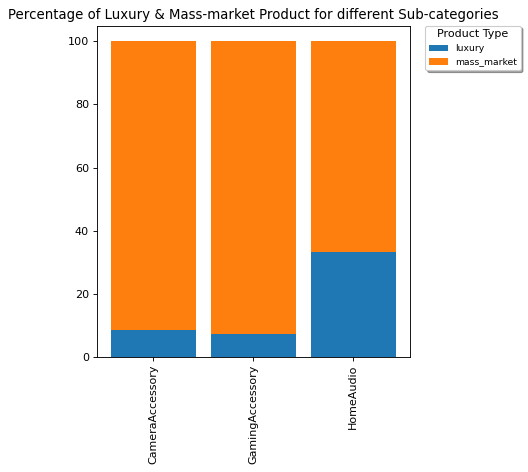

In [274]:
# From raw value to percentage
r = [0,1,2]
totals = [i+j for i,j in zip(product_type['luxury'], product_type['mass_market'])]
luxury = [i / j * 100 for i,j in zip(product_type['luxury'], totals)]
mass_market = [i / j * 100 for i,j in zip(product_type['mass_market'], totals)]
names = list(product_type['product_analytic_sub_category'])

# plot
# adjust figure size
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k')

barWidth = 0.85
# Create Luxury Bars
plt.bar(r, luxury, width=barWidth)
# Create mass_market Bars
plt.bar(r, mass_market, bottom=[i for i in luxury], width=barWidth)
# Custom x axis
plt.xticks(r, names, rotation='vertical')
plt.legend(['luxury','mass_market'],frameon=True, fontsize='small', shadow='True', title='Product Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Percentage of Luxury & Mass-market Product for different Sub-categories")

# Show graphic
plt.tight_layout()
plt.show()

Percentage of luxury products under **HomeAudio** is much more compared to the other sub categories.

### Finding the percentage of COD & Prepaid Products from 3 sub-categories

In [275]:
required_df['Prepaid'] = required_df['order_payment_type'].apply(lambda x:1 if x=='Prepaid' else 0)
required_df['COD'] = required_df['order_payment_type'].apply(lambda x:1 if x=='COD' else 0)
required_df.head()

,order_date,Year,Month,Week,gmv,sales_price,units,deliverybdays,deliverycdays,order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,Payday,is_occassion,Discount_per,Type_of_product,luxury,mass_market,Prepaid,COD
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,COD,5,-7.79175582905735E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,10.99,luxury,1,0,0,1
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,COD,7,7.33541149097431E+018,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,0,0,4.03,luxury,1,0,0,1
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,COD,10,-7.47768776228657E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,5.19,mass_market,0,1,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,Prepaid,4,-5.83593163877661E+018,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,1,0,19.49,mass_market,0,1,1,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,Prepaid,6,5.34735360997242E+017,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,0,0,22.92,mass_market,0,1,1,0


In [276]:
payment_type = pd.DataFrame(required_df.groupby('product_analytic_sub_category')['Prepaid','COD'].sum().reset_index())
payment_type

,product_analytic_sub_category,Prepaid,COD
0,CameraAccessory,65462,150439
1,GamingAccessory,45273,140603
2,HomeAudio,27123,83938


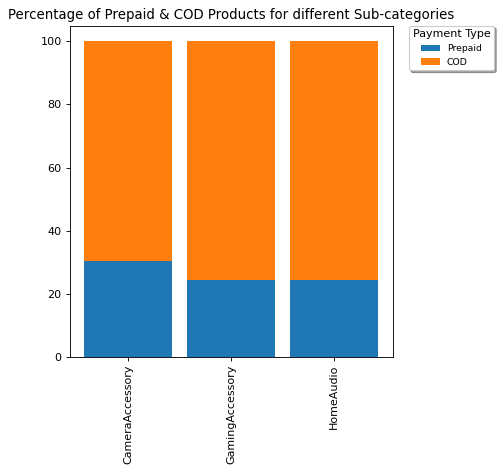

In [277]:
# From raw value to percentage
r = [0,1,2]
totals = [i+j for i,j in zip(payment_type['Prepaid'], payment_type['COD'])]
prepaid = [i / j * 100 for i,j in zip(payment_type['Prepaid'], totals)]
cod = [i / j * 100 for i,j in zip(payment_type['COD'], totals)]
names = list(payment_type['product_analytic_sub_category'])

# plot
# adjust figure size
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k')

barWidth = 0.85
# Create prepaid Bars
plt.bar(r, prepaid, width=barWidth)
# Create cod Bars
plt.bar(r, cod, bottom=[i for i in prepaid], width=barWidth)
# Custom x axis
plt.xticks(r, names, rotation='vertical')
plt.legend(['Prepaid','COD'],frameon=True, fontsize='small', shadow='True', title='Payment Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Percentage of Prepaid & COD Products for different Sub-categories")

# Show graphic
plt.tight_layout()
plt.show()

Percentage of prepaid payments under Camera Accessory is slightly more compared to the other sub categories.

### Comparing Distribution of **Discount_per** for 2 product types - Luxury and Mass Market

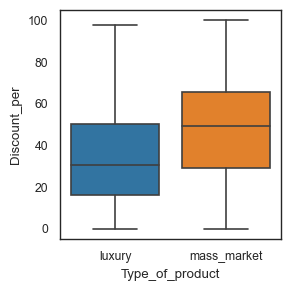

In [278]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(3, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.boxplot(x='Type_of_product', y='Discount_per',  data=required_df)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

The median discount percentage offered for luxury items is less compared to that of Mass Market Products.

### Displaying trend of NPS and Stock Index by week

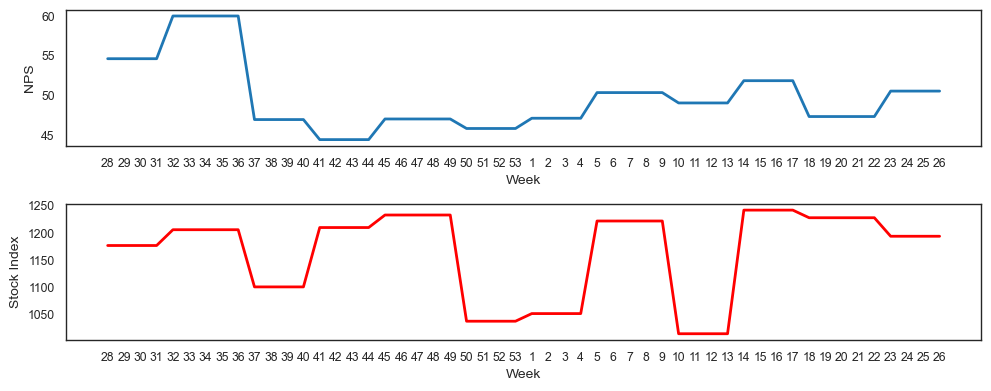

In [279]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(net_promoter_score.iloc[:,0], net_promoter_score.iloc[:,1], linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('NPS', fontsize=10);

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(net_promoter_score.iloc[:,0], net_promoter_score.iloc[:,4], 'r-',linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Stock Index', fontsize=10);

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Consumer NPS score is highest in weeks 32 – 35 , which coincides with the time when maximum discounts were being offered.

### No of items(Luxury/Mass-market) sold per 3 product subcategories

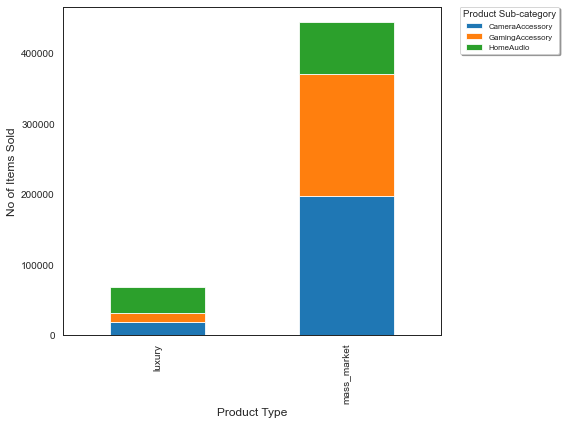

In [280]:
required_df.groupby(["Type_of_product", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(8,6), \
                                                                                             fontsize = 10) 
# plot x axis label
plt.xlabel('Product Type', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Among mass market products sold, Camera and Gaming Accessories related products were sold the most.

Home Audio products were the most popular among the luxury products sold

### Comparison of Trends of Revenue Discount% & Total Media Investment over the weeks

In [281]:
cameraaccessory = eleckart_CameraAccessory.copy()
gamingaccessory = eleckart_GamingAccessory.copy()
homeaudio = eleckart_HomeAudio.copy()

cameraaccessory['Week'] = cameraaccessory['Week'].apply(str)
gamingaccessory['Week'] = gamingaccessory['Week'].apply(str)
homeaudio['Week'] = homeaudio['Week'].apply(str)


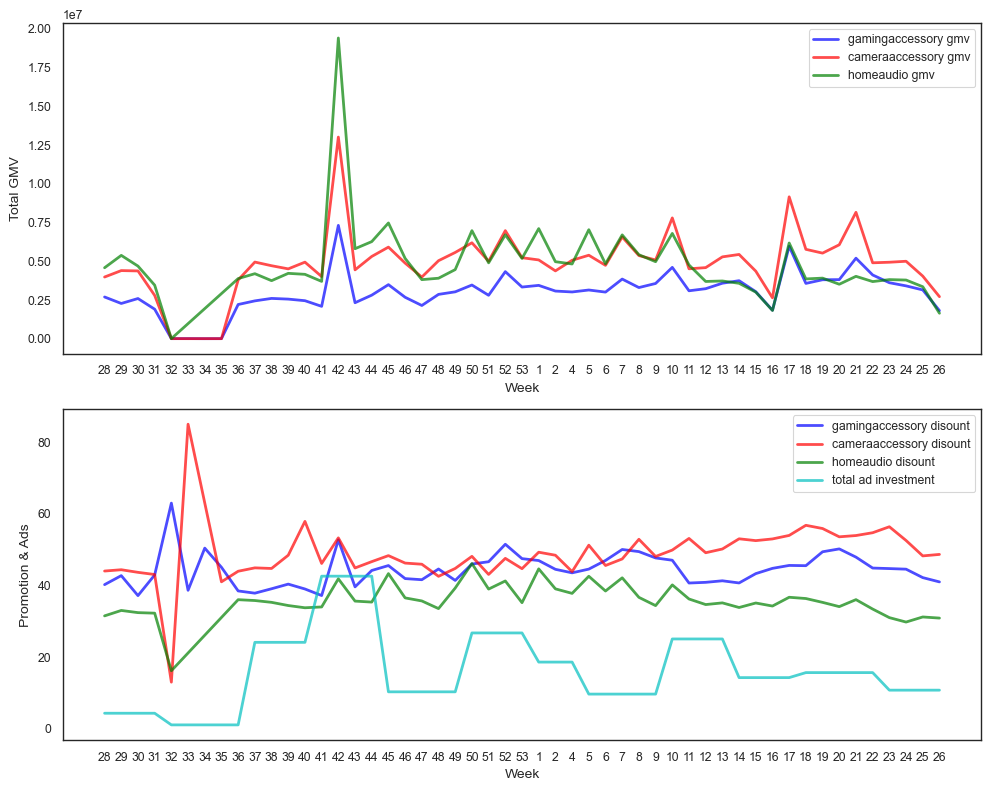

In [282]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 8), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(gamingaccessory.iloc[:,0], gamingaccessory.iloc[:,1], 'b-', linewidth=2, alpha=0.7)
plt.plot(cameraaccessory.iloc[:,0], cameraaccessory.iloc[:,1], 'r-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,1], 'g-', linewidth=2, alpha=0.7)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Total GMV', fontsize=10);
plt.legend(['gamingaccessory gmv','cameraaccessory gmv','homeaudio gmv'])

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(gamingaccessory.iloc[:,0], gamingaccessory.iloc[:,2], 'b-', linewidth=2, alpha=0.7)
plt.plot(cameraaccessory.iloc[:,0], cameraaccessory.iloc[:,2], 'r-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,2], 'g-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,21], 'c-', linewidth=2, alpha=0.7)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Promotion & Ads', fontsize=10);
plt.legend(['gamingaccessory disount','cameraaccessory disount','homeaudio disount','total ad investment'])

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

### Relationship between Revenue and Advertisement Spends

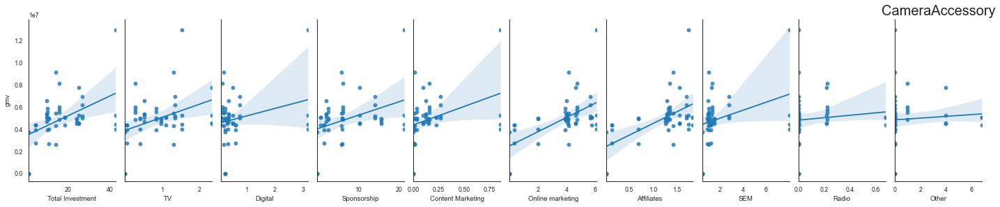

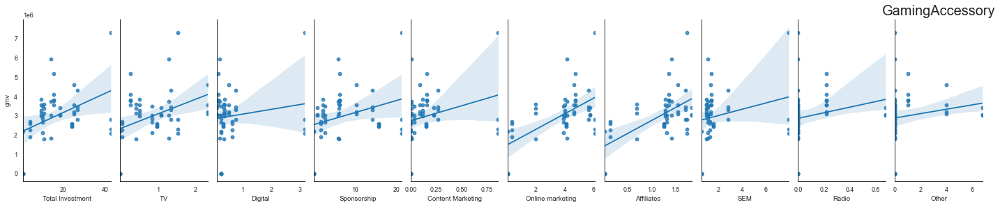

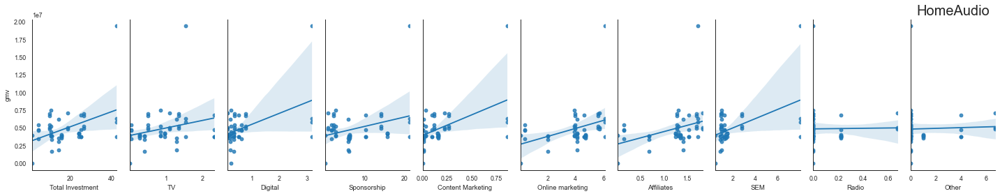

In [283]:
# Slightly alter the figure size to make it more horizontal.
#plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster


sns.pairplot(eleckart_CameraAccessory, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('CameraAccessory', fontsize = 20)

sns.pairplot(eleckart_GamingAccessory, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('GamingAccessory', fontsize = 20)

sns.pairplot(eleckart_HomeAudio, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('HomeAudio', fontsize = 20)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [284]:
rev_ad_columns = ['gmv','Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', \
                  'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', \
                  'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', \
                  'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', \
                  'Content Marketing_SMA_3','Content Marketing_SMA_5','Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', \
                  'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', \
                  'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', \
                  'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', \
                  'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', \
                  'Other_Ad_Stock']

In [285]:
cameraaccessory_ad = eleckart_CameraAccessory[rev_ad_columns]
gamingaccessory_ad = eleckart_GamingAccessory[rev_ad_columns]
homeaudio_ad = eleckart_HomeAudio[rev_ad_columns]

homeaudio_ad.head()

,gmv,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
25,4.573783e+06,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26,5.371525e+06,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,4.679828e+06,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,3.451151e+06,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,2.599000e+03,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Relationship between Revenue and Various Ad Spends for Camera Accessories

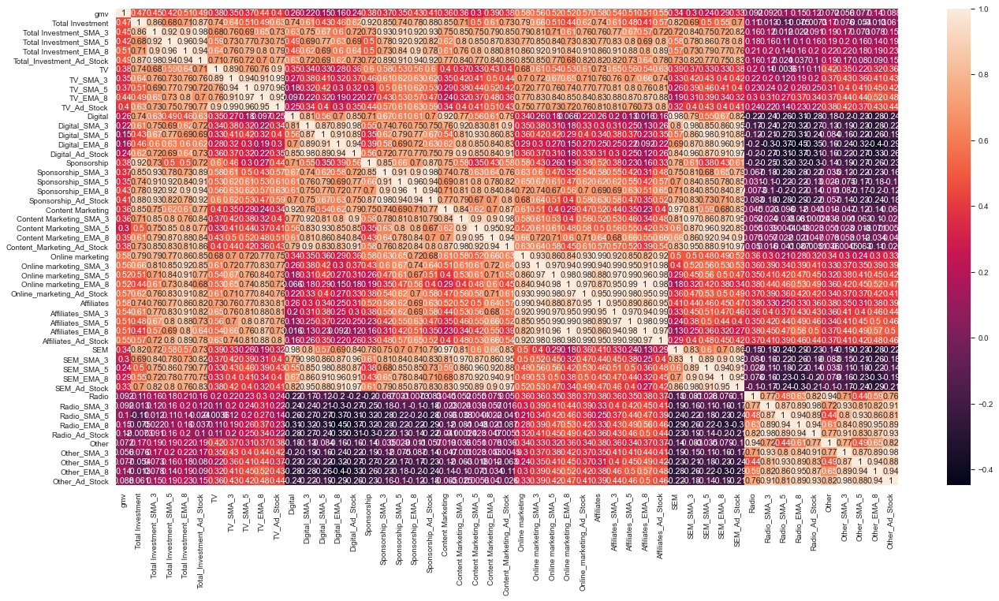

In [286]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
cam_cor = cameraaccessory_ad.corr()
sns.heatmap(cam_cor, annot=True)
plt.show()

### Relationship between Revenue and Various Ad Spends for Gaming Accessories

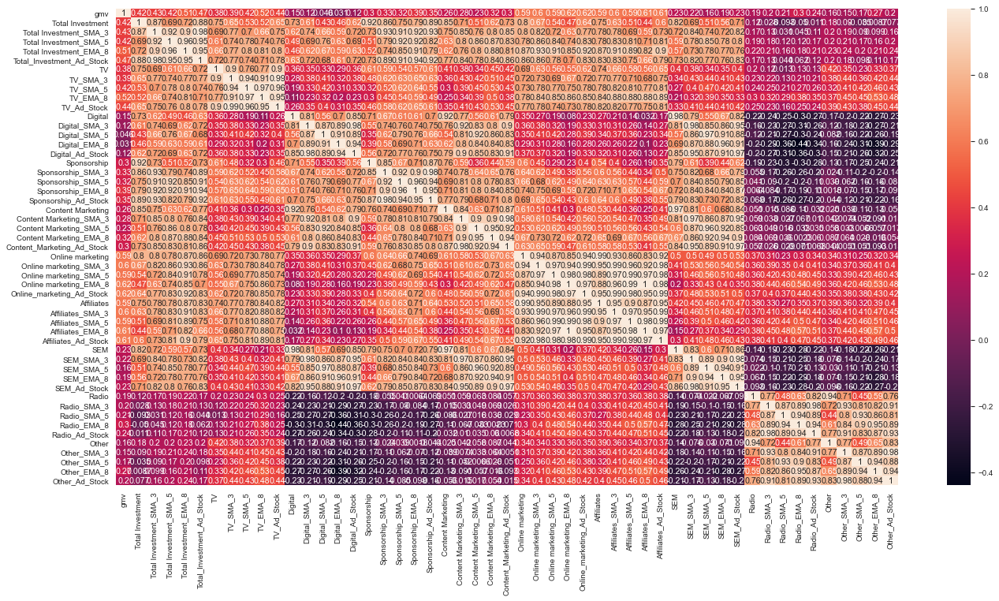

In [287]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
gam_cor = gamingaccessory_ad.corr()
sns.heatmap(gam_cor, annot=True)
plt.show()

### Relationship between Revenue and Various Ad Spends for Home Audio

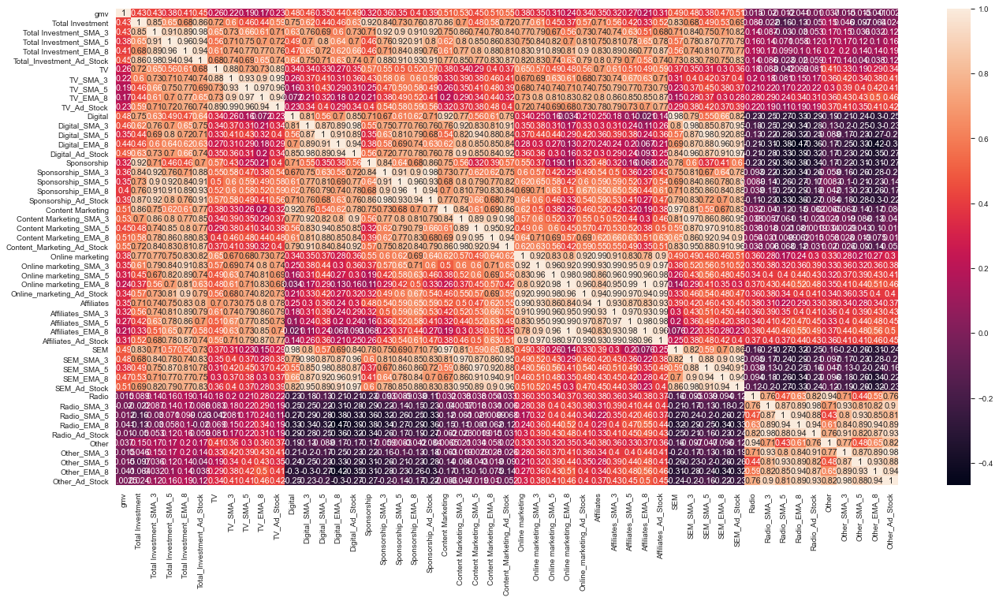

In [288]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
ha_cor = homeaudio_ad.corr()
sns.heatmap(ha_cor, annot=True)
plt.show()

### Total items sold per 3 product subcategories per Week

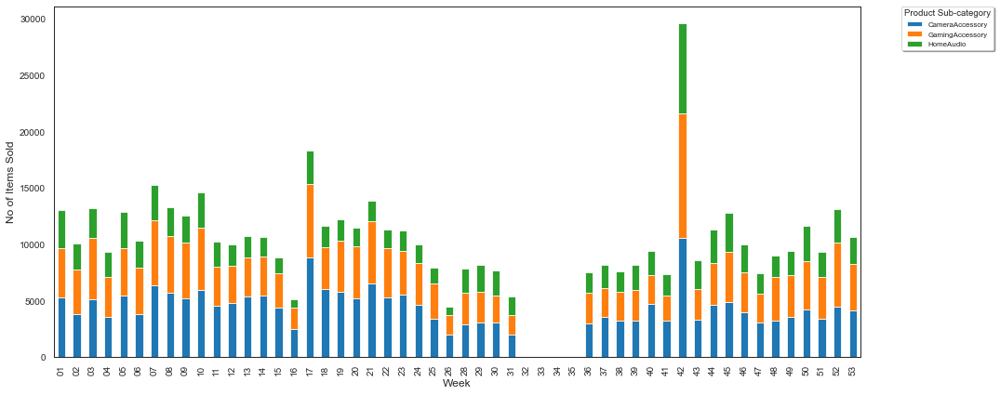

In [289]:
required_df.groupby(["Week", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(15,6), \
                                                                                           fontsize = 10) 
# plot x axis label
plt.xlabel('Week', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

The sale on the 42nd week (Thanksgiving week) is maximum. Overall, October has seen most no of items being sold.

# Step 4: Model Building

## Additive Model




### Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.

#### The equation can be represented as:

						Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ

In [290]:
# making a copy of original dataframes
cameraaccessory_org_df = eleckart_CameraAccessory.copy()
gamingaccessory_org_df = eleckart_GamingAccessory.copy()
homeaudio_org_df = eleckart_HomeAudio.copy()
homeaudio_org_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4.573783e+06,31.450813,0.0,0.0,7.369201,2.863223,0,1366,8,33,1,516.0,23,1374.0,0,0,0,63,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0
26,29,5.371525e+06,32.966657,0.0,0.0,6.984861,2.746318,0,1610,7,50,1,574.0,42,1623.0,0,0,0,69,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0,2
27,30,4.679828e+06,32.357350,0.0,0.0,7.071749,2.860538,0,1569,4,56,0,577.0,36,1430.0,0,0,0,46,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0,0
28,31,3.451151e+06,32.207530,0.0,0.0,7.200750,2.734834,0,1069,2,43,0,420.0,20,1025.0,0,0,0,44,1,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0,0
29,32,2.599000e+03,16.130000,0.0,0.0,9.000000,2.000000,0,0,0,0,0,0.0,0,1.0,0,0,0,0,0,0,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,59.987101,56.395426,55.677091,1206.0,1

In [291]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(gamingaccessory_org_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(gamingaccessory_org_df.isnull().sum()/gamingaccessory_org_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Week,0,0.0
Radio_EMA_8,0,0.0
Radio_SMA_3,0,0.0
Radio,0,0.0
SEM_Ad_Stock,0,0.0


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

### Dropping the `Week` column as it is a row identifier and will not help in prediction of revenue

In [292]:
# removing columns
eleckart_CameraAccessory = eleckart_CameraAccessory.drop('Week', axis=1)
eleckart_GamingAccessory = eleckart_GamingAccessory.drop('Week', axis=1)
eleckart_HomeAudio = eleckart_HomeAudio.drop('Week', axis=1)

In [293]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

eleckart_CameraAccessory[eleckart_CameraAccessory.columns]=scaler.fit_transform(eleckart_CameraAccessory[eleckart_CameraAccessory.columns])
eleckart_GamingAccessory[eleckart_GamingAccessory.columns]=scaler.fit_transform(eleckart_GamingAccessory[eleckart_GamingAccessory.columns])
eleckart_HomeAudio[eleckart_HomeAudio.columns]=scaler.fit_transform(eleckart_HomeAudio[eleckart_HomeAudio.columns])

eleckart_CameraAccessory.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,-0.463986,-0.568488,-0.621962,-0.622705,0.975873,0.285022,0.0,-0.752179,0.406002,0.158350,0.000000,-0.413214,2.553918,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-1.137094,0.707957,-0.429629,-0.879137,-0.032741,-1.205263,-0.204124,-0.439768,-0.193247,-0.428571,-1.309203,-0.142857,-0.997060,-1.083473,0.0,-1.138791,-1.631086,-1.699859,-1.633405,-1.649491,-1.251808,-1.419631,-1.491854,-1.652729,-1.518317,0.060467,-0.830498,-0.901105,0.077377,-0.554946,-0.868524,-1.264503,-1.318554,-1.299296,-1.278783,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-1.849822,-2.030452,-2.004557,-1.933248,-2.030119,-1.887653,-2.094357,-2.029475,-1.901528,-2.051610,-0.283006,-1.038332,-1.119630,-0.486269,-0.870528,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.63299,-0.787503,-0.637838,1.241485,-4.575500,-3.282764,0.138750,-4.698897,-3.338503,0.737609,1.051735,0.904298,-0.994318,0.392712,0.452202,-0.359762,0.347311,-0.269021,-0.478426
26,-0.261122,-0.524957,-0.621962,-0.622705,0.194883,0.370449,0.0,-0.649320,-0.266187,0.323447,0.215047,-0.399653,0.483174,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-0.654105,0.728597,-0.287038,-0.879137,-0.306924,-1.203913,-0.204124,-0.324809,-0.193247,-0.428571,-0.505563,-0.142857,-0.647623,0.922958,0.0,-1.138791,-1.631086,-1.699859,-1.633405,-1.532676,-1.251808,-1.419631,-1.491854,-1.652729,-1.494622,0.060467,-0.830498,-0.901105,0.077377,-0.290548,-0.868524,-1.264503,-1.318554,-1.299296,-1.188393,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-1.849822,-2.030452,-2.004557,-1.933248,-1.984615,-1.887653,-2.094357,-2.029475,-1.901528,-1.990966,-0.283006,-1.038332,-1.119630,-0.486269,-0.660863,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.63299,-0.787503,-0.637838,1.241485,-4.575500,-3.282764,0.138750,-4.698897,-3.338503,1.269795,0.882827,1.256121,-1.034268,1.651885,-0.413172,-0.359762,-0.459971,-0.269021,0.814617
27,-0.271684,-0.611923,-0.620334,-0.619954,0.221648,0.511811,0.0,-0.664260,0.540440,-0.114420,0.287886,-0.114865,1.173422,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-0.930099,0.026832,-0.358333,-0.879137,-0.306924,-1.198514,-0.204124,-0.178778,-0.193247,-0.428571,-0.57

### Splitting into Training and Testing Sets

In [294]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_train, cameraaccessory_test = train_test_split(eleckart_CameraAccessory, train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_train, gamingaccessory_test = train_test_split(eleckart_GamingAccessory, train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_train, homeaudio_test = train_test_split(eleckart_HomeAudio, train_size = 0.7, test_size = 0.3, random_state = 100)

### Dividing the 3 dataframes into X and Y sets for the model building

In [295]:
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train

X_cameraaccessory_train.head()

,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
0,0.060657,-0.621962,-0.622705,-0.497921,0.553036,0.0,0.628082,0.540440,-0.222092,-0.381535,-0.155549,-0.897323,0.381098,-0.169421,-0.415704,3.958114,-0.533081,0.656865,-0.385971,0.380768,0.206217,-0.105319,1.488997,-0.204124,0.010750,-0.193247,-0.428571,-0.359446,-0.142857,-0.123468,-1.083473,0.0,0.186504,0.776833,0.987797,0.863692,0.704290,0.354300,0.677298,0.802561,0.729798,0.657683,-0.605542,-0.025604,0.163219,0.064486,-0.158850,-0.997170,0.476156,0.908352,0.606863,0.225891,0.307176,0.494556,0.605060,0.628475,0.480500,1.062276,1.065636,1.085006,0.986779,1.059869,1.168223,1.032135,1.011728,0.949932,1.043430,-0.391566,0.275496,0.505240,0.448532,0.169488,3.459358,1.031321,0.382238,0.681314,1.525878,3.205892,0.939272,0.342332,0.586754,1.393930,-0.598617,-0.115920,0.048808,-1.446603,-0.319129,-0.095847,-1.071822,-1.932310,-1.381597,1.494331,-0.679084,1.441884,2.654145,1.894972,-0.269021,-0.478426
1,-0.040097,-0.620341,-0.621199,0.437612,-0.028840,0.0,-0.197086,0.540440,-0.336942,-0.770007,-0.365749,0.023008,0.021572,0.152264,-0.415704,-0.252646,-0.533081,0.035879,-0.633653,-0.087409,0.206217,-0.048869,0.240405,-0.204124,-0.377628,-0.193247,-0.428571,0.371136,-0.142857,-0.356426,0.922958,0.0,0.186504,0.504406,0.813250,0.755053,0.531642,0.354300,0.536876,0.712778,0.690811,0.572284,-0.605542,-0.344432,-0.055139,-0.199758,-0.414193,-0.997170,-0.300930,0.402233,0.136855,-0.350919,0.307176,0.423250,0.555838,0.610571,0.453296,1.062276,1.083691,1.095841,1.051716,1.101323,1.168223,1.112439,1.059082,1.038233,1.123928,-0.391566,-0.069779,0.273401,0.198646,-0.094166,3.459358,2.630985,1.421348,1.846339,2.841147,3.205892,2.419383,1.317654,1.655621,2.612992,-0.598617,-0.074344,0.067514,-1.446603,-0.299527,-0.087123,-1.763663,-1.707099,-1.815194,2.030130,-0.679084,-0.088059,-0.359762,-0.156683,6.323587,-0.478426
10,0.043235,-0.420785,-0.405268,-0.666914,-0.470323,0.0,0.396506,-0.736719,-0.164667,1.359652,1.485374,-0.437157,0.021572,0.188007,-0.415704,-0.252646,2.730682,0.656865,-0.117649,-0.296544,0.748895,-0.355309,0.486074,-0.204124,-0.455304,-0.193247,-0.428571,0.955601,-0.142857,0.983082,-1.083473,0.0,0.785597,0.880521,0.321637,0.463286,0.648741,2.252007,2.436440,1.339139,1.533744,

In [296]:
y_cameraaccessory_train.head()

0     0.075108
1    -0.270024
10   -0.167332
42   -0.025289
32   -0.556951
Name: gmv, dtype: float64

### Dividing into X and Y test sets for the model building for 3 dataframes

In [297]:
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

X_cameraaccessory_test.head()

,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraLEDLight,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,-0.928400,-0.621962,-0.622705,4.262882,-1.795333,0.0,-2.215186,-2.686066,-2.231974,-2.393266,-1.925303,-1.587571,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-1.413087,-2.202304,-1.463421,-0.879137,-1.806869,-1.240358,-0.204124,-1.949783,-0.193247,-0.428571,-2.258960,-0.142857,-1.928891,0.922958,0.0,-1.440518,-1.529340,-1.521451,-1.923297,-1.688655,-1.333579,-1.417973,-1.471353,-1.723976,-1.545080,-0.423320,-0.454946,-0.346170,-0.476226,-0.483543,-1.131096,-1.226673,-1.214215,-1.569611,-1.349286,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-2.015055,-2.016227,-1.956838,-2.048812,-2.071647,-2.106313,-2.067589,-1.960372,-2.048923,-2.100098,-0.679831,-0.739753,-0.685445,-0.925896,-0.816907,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.632990,-0.787503,-0.637838,2.562141,1.211033,0.978363,0.506552,0.366960,0.400771,0.844047,1.220643,0.921414,-0.928518,0.670030,-0.814782,-0.359762,-0.834621,-0.269021,1.461139
11,0.167884,0.429363,0.433071,-0.840190,-0.549591,0.0,0.691291,-0.871157,0.215775,1.383932,2.136318,-0.667240,0.381098,0.330978,-0.415704,-0.252646,3.274642,-0.447110,0.191953,-0.118304,0.748895,0.015645,0.711495,-0.204124,-0.138387,-0.193247,1.000000,0.078903,-0.142857,0.575406,0.922958,0.0,0.785597,0.880521,0.651896,0.645360,0.793068,2.252007,2.436440,1.978224,1.895612,2.275711,-0.078124,-0.060323,-0.069539,-0.299714,-0.117269,0.498420,0.582069,0.375435,0.223249,0.471124,-0.281489,-0.320366,-0.334853,-0.287599,-0.340957,0.459661,0.491172,0.448575,0.570794,0.489299,0.652040,0.678799,0.604480,0.706007,0.660870,-0.260872,-0.267843,-0.300286,-0.494134,-0.344308,0.802606,0.981554,0.685504,1.008867,0.922381,1.703747,2.072356,1.662970,1.928511,2.008609,-0.126119,0.153167,0.281961,-1.915867,-0.435344,-0.047244,-0.539636,-0.918861,-0.605142,0.534860,-0.679084,-0.003366,0.341433,0.067598,-0.269021,-0.478426
12,0.508729,1.718407,1.722050,-0.439781,-0.662751,0.0,0.695888,-0.736719,0.158350,0.274012,0.590325,-0.437157,0.381098,0.116521,-0.415704,-0.252646,2.186721,0.449870,-0.385971,0.288083,0.748895,-0.298860,0.851877,-0.204124,0.094640,-0.193247,-0.428571,0.663368,-0.142857,0.750124,-1.083473,0.0,-0.215890,0.519137,0.750613,0.449739,0.386

In [298]:
y_cameraaccessory_test.head()

31   -2.407633
11    0.171542
12    0.247718
3     0.223009
18    0.553224
Name: gmv, dtype: float64

### Building Linear Regression model for `cameraaccessory`

In [299]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_model = LinearRegression().fit(X_cameraaccessory_train, y_cameraaccessory_train)
y_cameraaccessory_test_pred = cameraaccessory_model.predict(X_cameraaccessory_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_cameraaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_cameraaccessory_test_pred)))

R2 Score: 0.7621151014759182
Mean Squared Error: 0.2354338228979267


##### With Simple Linear Regression, we get a r2 score of 0.76 and mse of 0.23

### Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [300]:
y_cameraaccessory = eleckart_CameraAccessory.pop('gmv')
X_cameraaccessory = eleckart_CameraAccessory

In [301]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_model_cv = LinearRegression().fit(X_cameraaccessory, y_cameraaccessory)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model_cv, X_cameraaccessory, y_cameraaccessory, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.8195672603121023
Mean Squared Error: 1.8195672603121025


##### With Simple Linear Regression, using cross validation, we get a r2 score of -0.82 and mse score of 1.82

*Here R2 score is negative which signifies that the chosen model does not follow the trend of the data, so it fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

### Determining Feature Importance for `cameraaccessory` from model without cv

In [302]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_model.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', -0.057),
 ('Discount_per', 0.045),
 ('deliverybdays', -0.06),
 ('deliverycdays', -0.06),
 ('sla', 0.046),
 ('product_procurement_sla', 0.04),
 ('is_cod', 0.0),
 ('is_mass_market', 0.089),
 ('product_vertical_CameraAccessory', 0.034),
 ('product_vertical_CameraBag', 0.166),
 ('product_vertical_CameraBattery', 0.198),
 ('product_vertical_CameraBatteryCharger', -0.097),
 ('product_vertical_CameraBatteryGrip', 0.08),
 ('product_vertical_CameraEyeCup', -0.043),
 ('product_vertical_CameraFilmRolls', -0.103),
 ('product_vertical_CameraHousing', 0.158),
 ('product_vertical_CameraLEDLight', 0.0),
 ('product_vertical_CameraMicrophone', -0.104),
 ('product_vertical_CameraMount', 0.1),
 ('product_vertical_CameraRemoteControl', -0.085),
 ('product_vertical_CameraTripod', 0.005),
 ('product_vertical_ExtensionTube', 0.067),
 ('product_vertical_Filter', 0.099),
 ('product_vertical_Flash', 0.058),
 ('product_vertical_FlashShoeAdapter', 0.014),
 ('product_vertical_Lens', 0.422),
 ('product

In [303]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
25,product_vertical_Lens,0.422
10,product_vertical_CameraBattery,0.198
58,Online marketing,0.168
9,product_vertical_CameraBag,0.166
15,product_vertical_CameraHousing,0.158
63,Affiliates,0.125
18,product_vertical_CameraMount,0.100
22,product_vertical_Filter,0.099
84,NPS_SMA_3,0.099
7,is_mass_market,0.089


### Plotting the Features in descending order of Importance for `cameraaccessory`

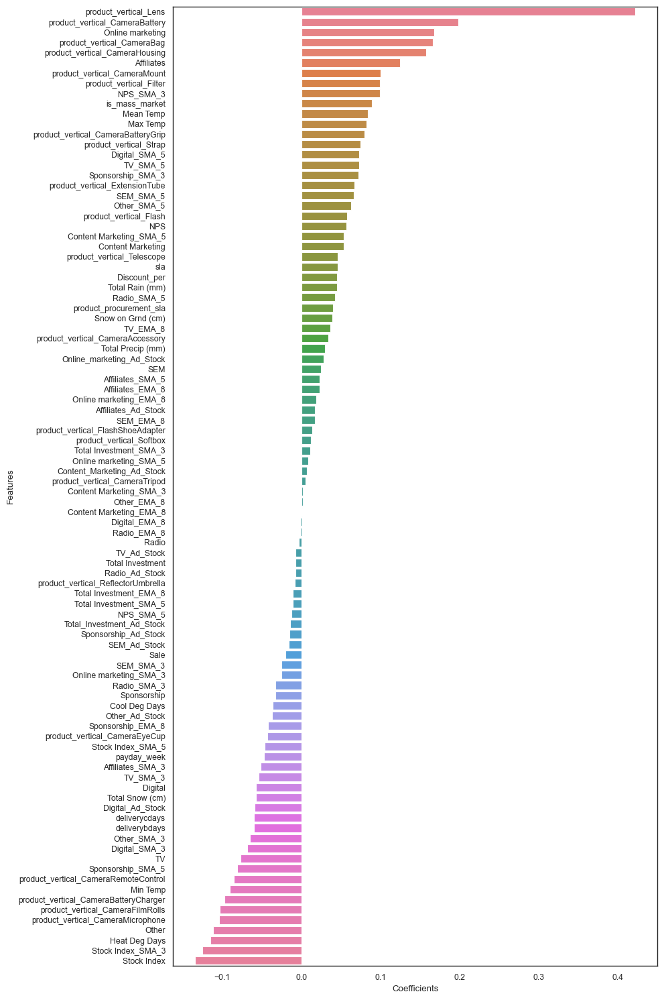

In [304]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:



|Features|Coefficients|
|--------|------------|
|product_vertical_Lens|	0.422|
|product_vertical_CameraBattery|	0.198|
|Online marketing	|0.168|
|product_vertical_CameraBag|	0.166|
|product_vertical_CameraHousing	|0.158|




### Building Linear Regression model for `gamingaccessory`

In [305]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_model = LinearRegression().fit(X_gamingaccessory_train, y_gamingaccessory_train)
y_gamingaccessory_test_pred = gamingaccessory_model.predict(X_gamingaccessory_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gamingaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gamingaccessory_test_pred)))

R2 Score: 0.9389824091425278
Mean Squared Error: 0.04883475499617031


##### With Simple Linear Regression, we get a r2 score of 0.94 and mse of 0.05

### Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [306]:
y_gamingaccessory = eleckart_GamingAccessory.pop('gmv')
X_gamingaccessory = eleckart_GamingAccessory

In [307]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_model_cv = LinearRegression().fit(X_gamingaccessory, y_gamingaccessory)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model_cv, X_gamingaccessory, y_gamingaccessory, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.3134849313777479
Mean Squared Error: 0.6865150686222521


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.31 and mse score of 0.69

### Determining Feature Importance for `gamingaccessory` from model without cv

In [308]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_model.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.023),
 ('Discount_per', -0.003),
 ('deliverybdays', 0.005),
 ('deliverycdays', 0.004),
 ('sla', 0.038),
 ('product_procurement_sla', 0.022),
 ('is_cod', -0.0),
 ('is_mass_market', 0.18),
 ('product_vertical_GameControlMount', -0.011),
 ('product_vertical_GamePad', 0.202),
 ('product_vertical_GamingAccessoryKit', 0.127),
 ('product_vertical_GamingAdapter', 0.046),
 ('product_vertical_GamingChargingStation', 0.009),
 ('product_vertical_GamingHeadset', 0.21),
 ('product_vertical_GamingKeyboard', 0.066),
 ('product_vertical_GamingMemoryCard', 0.033),
 ('product_vertical_GamingMouse', 0.11),
 ('product_vertical_GamingMousePad', 0.016),
 ('product_vertical_GamingSpeaker', 0.044),
 ('product_vertical_JoystickGamingWheel', 0.093),
 ('product_vertical_MotionController', 0.05),
 ('product_vertical_TVOutCableAccessory', 0.085),
 ('payday_week', -0.036),
 ('holiday_week', -0.0),
 ('Total Investment', -0.0),
 ('Total Investment_SMA_3', 0.002),
 ('Total Investment_SMA_5', 0.019),
 ('

In [309]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
13,product_vertical_GamingHeadset,0.210
9,product_vertical_GamePad,0.202
7,is_mass_market,0.180
10,product_vertical_GamingAccessoryKit,0.127
16,product_vertical_GamingMouse,0.110
19,product_vertical_JoystickGamingWheel,0.093
21,product_vertical_TVOutCableAccessory,0.085
84,Cool Deg Days,0.080
29,TV,0.078
14,product_vertical_GamingKeyboard,0.066


### Plotting the Features in descending order of Importance for `gamingaccessory`

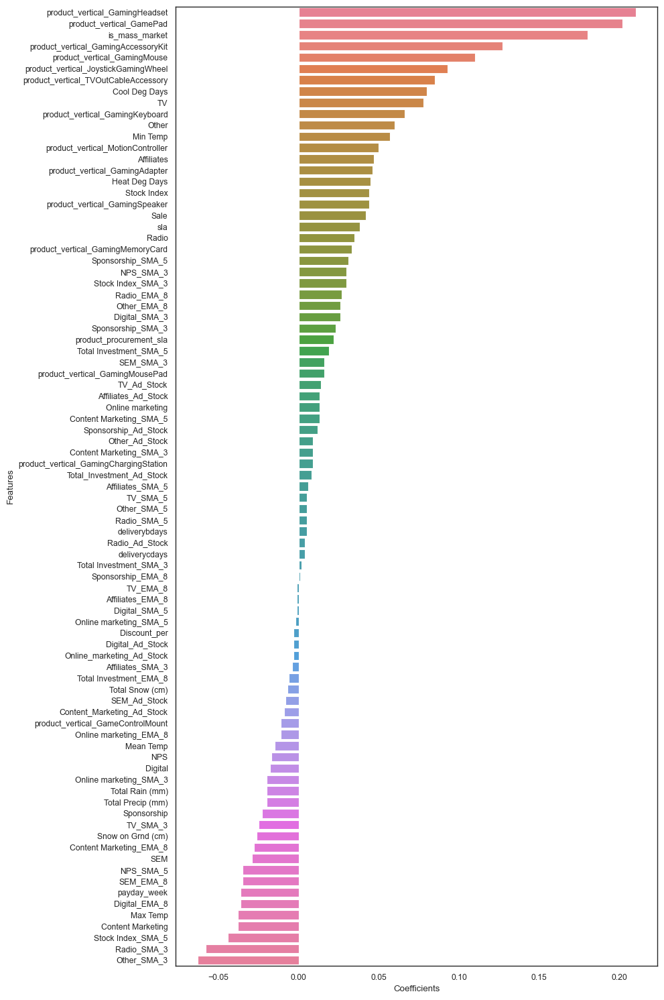

In [310]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_GamingHeadset|	0.210|
|product_vertical_GamePad	|0.202|
|is_mass_market|	0.180|
|product_vertical_GamingAccessoryKit	|0.127|
|product_vertical_GamingMouse	|0.110|

### Building Linear Regression model for `homeaudio`

In [311]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_model = LinearRegression().fit(X_homeaudio_train, y_homeaudio_train)
y_homeaudio_test_pred = homeaudio_model.predict(X_homeaudio_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_pred)))

R2 Score: 0.9535906619328074
Mean Squared Error: 0.11127871132659459


##### With Simple Linear Regression, we get a r2 score of 0.95 and mse of 0.11

### Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [312]:
y_homeaudio = eleckart_HomeAudio.pop('gmv')
X_homeaudio = eleckart_HomeAudio

In [313]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_cv = LinearRegression().fit(X_homeaudio, y_homeaudio)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model_cv, X_homeaudio, y_homeaudio, cv=5)
accuracy = metrics.r2_score(y_homeaudio, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.755447932202055
Mean Squared Error: 0.244552067797945


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.76 and mse score of 0.24

### Determining Feature Importance for `homeaudio` from model without cv

In [314]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.022),
 ('Discount_per', 0.071),
 ('deliverybdays', 0.026),
 ('deliverycdays', 0.008),
 ('sla', -0.094),
 ('product_procurement_sla', -0.074),
 ('is_cod', -0.0),
 ('is_mass_market', 0.153),
 ('product_vertical_DJController', 0.036),
 ('product_vertical_Dock', 0.115),
 ('product_vertical_DockingStation', 0.019),
 ('product_vertical_FMRadio', 0.123),
 ('product_vertical_HiFiSystem', 0.054),
 ('product_vertical_HomeAudioSpeaker', 0.425),
 ('product_vertical_KaraokePlayer', 0.0),
 ('product_vertical_SlingBox', 0.054),
 ('product_vertical_SoundMixer', -0.01),
 ('product_vertical_VoiceRecorder', -0.031),
 ('payday_week', 0.04),
 ('holiday_week', 0.0),
 ('Total Investment', -0.049),
 ('Total Investment_SMA_3', 0.011),
 ('Total Investment_SMA_5', -0.017),
 ('Total Investment_EMA_8', 0.082),
 ('Total_Investment_Ad_Stock', -0.068),
 ('TV', -0.023),
 ('TV_SMA_3', -0.026),
 ('TV_SMA_5', 0.02),
 ('TV_EMA_8', -0.041),
 ('TV_Ad_Stock', -0.044),
 ('Digital', 0.007),
 ('Digital_SMA_3', 

In [315]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
13,product_vertical_HomeAudioSpeaker,0.425
7,is_mass_market,0.153
11,product_vertical_FMRadio,0.123
31,Digital_SMA_3,0.123
58,SEM_EMA_8,0.121
9,product_vertical_Dock,0.115
78,Mean Temp,0.110
56,SEM_SMA_3,0.100
67,Other_SMA_5,0.099
53,Affiliates_EMA_8,0.098


### Plotting the Features in descending order of Importance for `homeaudio`

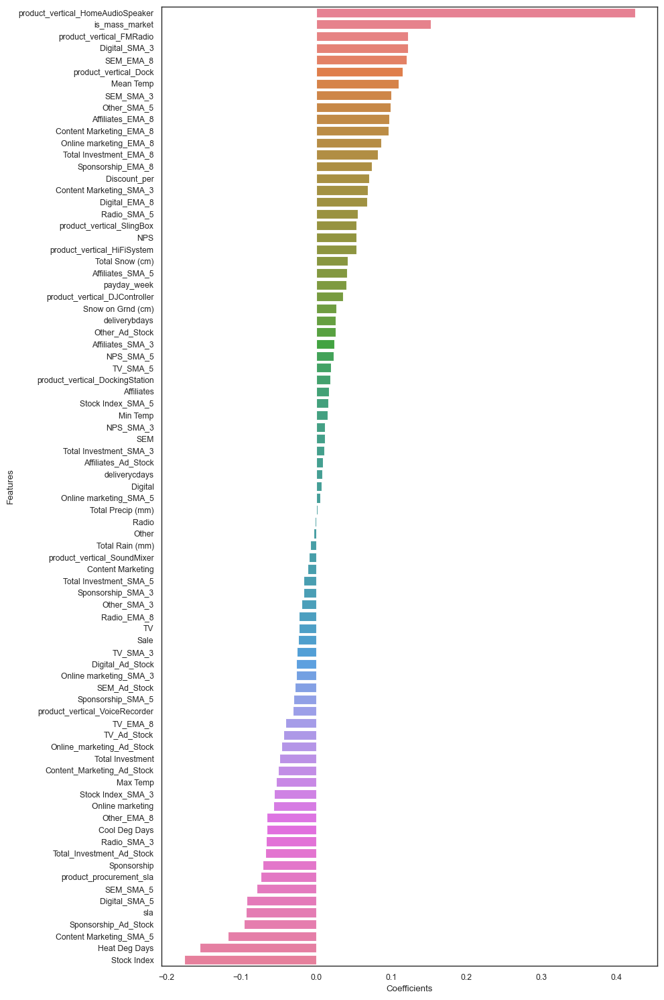

In [316]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_HomeAudioSpeaker|	0.425|
|is_mass_market	|0.153|
|product_vertical_FmRadio	|0.123|
|Digital_SMA_3	|0.123|
|SEM_EMA_8	|0.121|

## Multiplicative Model

*The Linear Regression Model that we built earlier is an additive model that has been an implicit assumption that the different KPIs affect the revenue additively.*

  __Y = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ__

*However when there are interactions between the KPIs, we go for a multiplicative model.*

*To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.*

__Y = e^α .X1^β1 . X2^β2 . X3^β3 . X4^β4 . X5^β5 + ϵ__

__lnY = α + β1ln(X1) + β2ln(X2) + β3ln(X3) + β4ln(X4) + β5ln(X5) + ϵ'__

In [317]:
homeaudio_org_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [318]:
# Making copy of dataframes from the original ones
cameraaccessory_mul_df = cameraaccessory_org_df.copy()
gamingaccessory_mul_df = gamingaccessory_org_df.copy()
homeaudio_mul_df = homeaudio_org_df.copy()
homeaudio_mul_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [319]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Week,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [320]:
# removing columns
cameraaccessory_mul_df = cameraaccessory_mul_df.drop('Week', axis=1)
gamingaccessory_mul_df = gamingaccessory_mul_df.drop('Week', axis=1)
homeaudio_mul_df = homeaudio_mul_df.drop('Week', axis=1)
homeaudio_mul_df.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [321]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### Taking Logarithm of both the Dependent and the independent variables

##### After taking log, all 0 values will be transformed to `inf`. Retransforming these values to 0.

In [322]:
cameraaccessory_mul_df = cameraaccessory_mul_df.applymap(lambda x: np.log(x))
cameraaccessory_mul_df = cameraaccessory_mul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_mul_df = cameraaccessory_mul_df.replace(np.nan, 0)

gamingaccessory_mul_df = gamingaccessory_mul_df.applymap(lambda x: np.log(x))
gamingaccessory_mul_df = gamingaccessory_mul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_mul_df = gamingaccessory_mul_df.replace(np.nan, 0)

homeaudio_mul_df = homeaudio_mul_df.applymap(lambda x: np.log(x))
homeaudio_mul_df = homeaudio_mul_df.replace([np.inf, -np.inf], 0)
homeaudio_mul_df = homeaudio_mul_df.replace(np.nan, 0)


homeaudio_mul_df.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,15.336,3.448,0.000,0.000,1.997,1.052,0.000,7.220,2.079,3.497,0.000,6.246,3.135,7.225,0.000,0.000,0.000,4.143,0.000,0.000,1.450,0.000,0.000,1.450,1.450,-2.919,0.000,0.000,-2.919,-2.919,-0.457,0.000,0.000,-0.457,-0.457,0.617,0.000,0.000,0.617,0.617,0.000,0.000,0.000,0.000,0.000,-1.103,0.000,0.000,-1.103,-1.103,-1.988,0.000,0.000,-1.988,-1.988,0.228,0.000,0.000,0.228,0.228,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,7.071,0.000,0.000,3.332,2.526,3.001,-1.261,0.869,1.485,0.000,1.485,0.000,0.000
26,15.497,3.495,0.000,0.000,1.944,1.010,0.000,7.384,1.946,3.912,0.000,6.353,3.738,7.392,0.000,0.000,0.000,4.234,0.000,0.000,1.450,0.000,0.000,1.450,1.920,-2.919,0.000,0.000,-2.919,-2.449,-0.457,0.000,0.000,-0.457,0.013,0.617,0.000,0.000,0.617,1.087,0.000,0.000,0.000,0.000,0.000,-1.103,0.000,0.000,-1.103,-0.633,-1.988,0.000,0.000,-1.988,-1.518,0.228,0.000,0.000,0.228,0.698,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,7.071,0.000,0.000,3.497,2.398,3.143,0.000,1.645,0.336,0.000,0.336,0.000,0.693
27,15.359,3.477,0.000,0.000,1.956,1.051,0.000,7.358,1.386,4.025,0.000,6.358,3.584,7.265,0.000,0.000,0.000,3.829,0.000,0.000,1.450,1.450,0.000,1.450,2.123,-2.919,-2.919,0.000,-2.919,-2.246,-0.457,-0.457,0.000,-0.457,0.216,0.617,0.617,0.000,0.617,1.290,0.000,0.000,0.000,0.000,0.000,-1.103,-1.103,0.000,-1.103,-0.430,-1.988,-1.988,0.000,-1.988,-1.315,0.228,0.228,0.000,0.228,0.901,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,7.071,7.071,0.000,3.450,2.674,3.138,0.000,1.621,0.077,0.000,0.077,0.000,0.000
28,15.054,3.472,0.000,0.000,1.974,1.006,0.000,6.974,0.693,3.761,0.000,6.040,2.996,6.932,0.000,0.000,0.000,3.784,0.000,0.000,1.450,1.450,0.000,1.450,2.228,-2.919,-2.919,0.000,-2.919,-2.141,-0.457,-0.457,0.000,-0.457,0.320,0.617,0.617,0.000,0.617,1.395,0.000,0.000,0.000,0.000,0.000,-1.103,-1.103,0.000,-1.103,-0.325,-1.988,-1.988,0.000,-1.988,-1.210,0.228,0.228,0.000,0.228,1.005,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,7.071,7.071,0.000,3.512,2.773,3.201,0.000,1.882,1.533,0.000,1.533,0.000,0.000
29,7.863,2.781,0.000,0.000,2.197,0.693,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.013,1.157,1.285,1.265,1.884,-6.908,-3.315,-3.137,-3.165,-2.638,-1.363,-0.679,-0.584,-0.599,0.079,-1.546,0.268,0.423,0.398,0.968,0.000,0.000,0.000,0.000,0.000,-3.650,-1.470,-1.306,-1.332,-0.778,-4.200,-2.340,-2.184,-2.208,-1.641,-0.687,0.005,0.100,0.085,0.762,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.094,4.032,4.020,7.095,7.079,7.0

In [323]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [324]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_mul_df[cameraaccessory_mul_df.columns]=scaler.fit_transform(cameraaccessory_mul_df[cameraaccessory_mul_df.columns])
gamingaccessory_mul_df[gamingaccessory_mul_df.columns]=scaler.fit_transform(gamingaccessory_mul_df[gamingaccessory_mul_df.columns])
homeaudio_mul_df[homeaudio_mul_df.columns]=scaler.fit_transform(homeaudio_mul_df[homeaudio_mul_df.columns])

homeaudio_mul_df.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,0.137,-0.777,0.390,0.354,1.799,1.220,0.000,0.106,1.325,0.174,-1.879,0.198,-0.104,0.094,0.000,-0.146,-0.588,0.047,0.000,0.000,-1.455,-3.028,-2.631,-2.055,-2.806,-1.388,0.352,0.279,-2.223,-2.497,0.603,1.095,1.052,0.404,-0.799,-0.892,-1.722,-1.718,-1.778,-2.291,1.425,1.520,1.735,1.889,1.143,-1.727,-1.088,-1.215,-2.260,-2.713,-1.752,-0.043,-0.133,-2.218,-2.757,-0.188,-0.651,-0.678,-0.503,-1.881,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,-4.780,-3.311,0.186,-4.791,-3.316,0.679,1.216,0.771,-2.166,0.608,0.841,-0.226,0.751,-0.309,-0.443
26,0.279,-0.465,0.390,0.354,1.428,0.555,0.000,0.255,1.130,0.585,-1.879,0.310,0.794,0.242,0.000,-0.146,-0.588,0.177,0.000,0.000,-1.455,-3.028,-2.631,-2.055,-2.175,-1.388,0.352,0.279,-2.223,-2.139,0.603,1.095,1.052,0.404,-0.107,-0.892,-1.722,-1.718,-1.778,-1.752,1.425,1.520,1.735,1.889,1.143,-1.727,-1.088,-1.215,-2.260,-2.296,-1.752,-0.043,-0.133,-2.218,-2.298,-0.188,-0.651,-0.678,-0.503,-1.059,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,-4.780,-3.311,0.186,-4.791,-3.316,0.916,1.102,0.887,-1.163,1.556,-0.261,-0.226,-0.326,-0.309,0.999
27,0.157,-0.588,0.390,0.354,1.514,1.205,0.000,0.232,0.314,0.698,-1.879,0.315,0.564,0.129,0.000,-0.146,-0.588,-0.402,0.000,0.000,-1.455,-1.326,-2.631,-2.055,-1.903,-1.388,-1.892,0.279,-2.223,-1.984,0.603,0.502,1.052,0.404,0.192,-0.892,-1.079,-1.718,-1.778,-1.520,1.425,1.520,1.735,1.889,1.143,-1.727,-2.169,-1.215,-2.260,-2.116,-1.752,-2.280,-0.133,-2.218,-2.100,-0.188,-0.262,-0.678,-0.503,-0.704,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,0.350,-3.311,0.186,0.218,-3.316,0.849,1.348,0.882,-1.163,1.526,-0.510,-0.226,-0.569,-0.309,-0.443
28,-0.112,-0.619,0.390,0.354,1.639,0.488,0.000,-0.115,-0.698,0.436,-1.879,-0.017,-0.313,-0.168,0.000,-0.146,-0.588,-0.466,0.000,0.000,-1.455,-1.326,-2.631,-2.055,-1.763,-1.388,-1.892,0.279,-2.223,-1.905,0.603,0.502,1.052,0.404,0.346,-0.892,-1.079,-1.718,-1.778,-1.400,1.425,1.520,1.735,1.889,1.143,-1.727,-2.169,-1.215,-2.260,-2.023,-1.752,-2.280,-0.133,-2.218,-1.998,-0.188,-0.262,-0.678,-0.503,-0.522,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,0.350,-3.311,0.186,0.218,-3.316,0.937,1.435,0.934,-1.163,1.844,0.887,-0.226,0.796,-0.309,-0.443
29,-6.479,-5.201,0.390,0.354,3.181,-4.506,0.000,-6.419,-1.709,-3.284,-1.879,-6.340,-4.779,-6.360,0.000,-0.146,-0.588,-5.874,0.000,0.000,-3.264,-1.670,-1.291,-2.368,-2.224,-3.850,-2.197,-2.380,-2.447,-2.283,-0.502,0.215,0.271,0.163,-0.009,-2.890,-1.443,-1.274,-2.111,-1.889,1.425,1.520,1.735,1.889,1.143,-3.791,-2.529,-2.602,-2.499,-2.425,-3.77

### Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [325]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_mul_train, cameraaccessory_mul_test = train_test_split(cameraaccessory_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_mul_train, gamingaccessory_mul_test = train_test_split(gamingaccessory_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_mul_train, homeaudio_mul_test = train_test_split(homeaudio_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

### Dividing the 3 dataframes into X and Y sets for the model building

In [326]:
y_cameraaccessory_mul_train = cameraaccessory_mul_train.pop('gmv')
X_cameraaccessory_mul_train = cameraaccessory_mul_train

y_gamingaccessory_mul_train = gamingaccessory_mul_train.pop('gmv')
X_gamingaccessory_mul_train = gamingaccessory_mul_train

y_homeaudio_mul_train = homeaudio_mul_train.pop('gmv')
X_homeaudio_mul_train = homeaudio_mul_train

X_homeaudio_mul_train.head()

,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
12,-0.301,0.873,0.920,0.231,0.240,0.000,-0.064,0.639,0.080,1.001,0.103,0.644,-0.162,0.000,6.856,0.450,0.736,0.000,0.000,0.060,0.566,0.633,0.472,0.468,0.575,0.878,0.915,0.879,0.861,-0.699,-0.022,0.024,-0.316,-0.163,0.205,0.563,0.652,0.318,0.440,-1.764,-0.633,-0.772,-0.800,-1.068,0.316,0.375,0.386,0.452,0.391,0.385,0.421,0.404,0.523,0.461,-0.469,-0.316,-0.288,-0.591,-0.392,0.526,-1.413,-0.677,-0.944,-0.735,-0.406,1.351,1.565,1.358,1.292,0.812,0.236,0.315,0.944,0.164,0.255,-0.603,-1.033,-1.473,1.077,-0.451,0.236,-2.093,0.357,-0.309,-0.443
10,-0.142,0.082,0.137,-0.030,-0.359,0.000,0.101,1.130,-0.227,-0.072,0.250,0.605,-0.025,0.000,-0.146,-0.588,0.492,0.000,0.000,0.771,0.749,0.432,0.481,0.617,0.934,1.000,0.678,0.836,0.929,0.375,0.259,0.037,-0.158,0.177,0.701,0.718,0.353,0.233,0.525,-0.183,-0.351,-0.475,-0.485,-0.497,0.405,0.410,0.349,0.468,0.416,0.466,0.453,0.337,0.527,0.475,-0.135,-0.206,-0.405,-0.542,-0.311,-2.063,-0.968,-0.936,-0.751,-0.213,1.990,2.041,1.135,1.674,1.777,0.013,0.211,0.314,-1.901,0.113,0.272,0.230,-1.033,-0.244,0.830,-0.451,1.862,-0.226,1.749,-0.309,-0.443
32,-0.024,0.390,0.354,0.655,0.258,0.000,0.060,1.130,0.624,-0.323,0.230,0.388,-0.097,0.000,-0.146,-0.588,-0.434,0.000,0.000,0.723,0.252,-0.205,-0.507,0.185,0.394,0.017,-0.522,-0.417,0.062,-0.159,-0.418,-0.607,-0.583,-0.467,1.081,0.732,0.234,0.157,0.708,0.154,-0.278,-0.985,-1.255,-0.527,0.310,-0.100,-0.680,-0.561,-0.059,0.274,-0.232,-0.977,-0.667,-0.124,0.151,-0.337,-0.819,-0.885,-0.373,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,-0.615,0.269,0.407,-0.754,0.193,0.302,0.653,1.251,0.789,-1.163,0.690,-0.493,-0.226,-0.552,-0.309,-0.443
22,-1.150,0.850,0.894,-0.743,0.282,0.000,-0.084,-0.106,-0.541,0.813,0.101,-1.679,-0.164,0.000,-0.146,2.326,0.679,0.000,0.000,-0.296,-0.080,0.095,-0.071,-0.136,-0.128,-0.416,-0.659,-0.138,-0.282,-0.103,-0.519,-0.887,-1.103,-0.623,0.232,0.194,0.218,0.099,0.159,-1.628,-0.696,-0.515,-0.928,-1.107,-0.274,-0.042,0.156,0.223,0.044,-0.273,-0.143,-0.020,0.189,0.009,-0.665,-0.514,-0.355,-0.668,-0.532,0.526,-2.163,-0.927,-1.228,-1.297,-0.406,-2.188,-0.935,-1.438,-0.804,0.444,0.222,0.296,0.389,0.235,0.324,0.916,0.872,0.818,-1.843,1.153,-0.493,-0.226,-0.552,-0.309,-0.443
45,0.638,0.390,0.354,0.289,0.937,0.000,0.050,0.639,0.389,0.588,0.087,0.341,0.256,0.000,-0.146,-0.588,-0.071,0.000,0.000,0.853,0.555,0.313,0.603,0.601,0.598,0.479,0.317,0.524,0.551,0.836,0.423,0.012,0.757,0.596,0.987,0.718,0.382,0.753,0.754,0.531,0.209,-0.273,0.194,0.342,0.567,0.501,0.406,0.521,0.520,0.552,0.470,0.358,0.523,0.519,1.099,0.703,0.295,0.942,0.805,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0

### Dividing into X and Y test sets for the model building for 3 dataframes

In [327]:
y_cameraaccessory_mul_test = cameraaccessory_mul_test.pop('gmv')
X_cameraaccessory_mul_test = cameraaccessory_mul_test

y_gamingaccessory_mul_test = gamingaccessory_mul_test.pop('gmv')
X_gamingaccessory_mul_test = gamingaccessory_mul_test

y_homeaudio_mul_test = homeaudio_mul_test.pop('gmv')
X_homeaudio_mul_test = homeaudio_mul_test

X_homeaudio_mul_test.head()

,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,0.070,0.390,0.354,-0.128,1.406,0.000,0.171,1.130,0.643,-0.646,0.372,0.522,-0.016,0.000,-0.146,-0.588,0.406,0.000,0.000,0.723,-0.490,-0.830,-1.254,-0.385,0.394,-0.515,-1.107,-0.912,-0.293,-0.159,-0.539,-0.686,-0.563,-0.535,1.081,0.031,-0.460,-0.601,0.191,0.154,-0.824,-1.660,-1.900,-1.085,0.310,-0.770,-1.400,-1.109,-0.467,0.274,-0.993,-1.818,-1.247,-0.566,0.151,-0.923,-1.270,-1.195,-0.767,0.526,0.702,0.890,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,-0.615,0.374,0.451,-0.754,0.214,0.312,0.894,0.923,0.736,-0.967,0.676,-0.623,-0.226,-0.679,-0.309,-0.443
5,1.152,-1.640,-1.664,-0.743,-0.264,0.000,0.412,-1.709,0.624,-0.323,0.212,-0.240,0.592,0.000,-0.146,-0.588,0.475,0.000,0.000,-0.433,-0.373,0.059,0.019,-0.219,0.006,-0.156,0.033,0.238,0.091,-0.010,-0.150,-0.672,-0.506,-0.357,-0.675,-0.834,-1.084,-0.794,-0.947,-0.016,-0.157,-0.041,-0.088,-0.082,0.286,0.266,0.424,0.508,0.385,0.298,0.246,0.391,0.537,0.408,-0.595,-0.694,-0.669,-0.463,-0.616,0.526,0.702,-0.285,-0.599,-0.641,-0.406,-0.313,1.321,1.071,0.706,0.390,0.245,0.305,0.715,0.244,0.298,0.002,-1.033,-0.327,0.865,-0.451,-0.584,-0.226,-0.641,0.407,1.843
9,0.149,-0.525,-0.529,-0.399,-0.515,0.000,0.167,-1.709,0.080,0.911,0.194,-0.104,0.215,0.000,-0.146,1.057,0.475,0.000,0.000,0.771,0.479,0.246,0.327,0.481,0.934,0.770,0.461,0.697,0.822,0.375,0.137,-0.046,-0.235,0.107,0.701,0.407,0.086,-0.000,0.361,-0.183,-0.281,-0.427,-0.415,-0.440,0.405,0.364,0.318,0.462,0.401,0.466,0.388,0.291,0.513,0.454,-0.135,-0.354,-0.504,-0.574,-0.374,-2.063,-1.413,-1.300,-0.828,-0.392,1.990,1.351,0.529,1.358,1.580,0.013,0.223,0.319,-1.901,0.159,0.291,-0.127,-1.033,0.113,0.592,-0.451,-1.249,-0.226,-1.291,-0.309,-0.443
3,1.221,-2.009,-2.124,-0.995,0.915,0.000,0.387,0.314,0.012,-0.323,0.259,-0.240,0.640,0.000,-0.146,-0.588,0.458,0.000,0.000,-0.433,0.193,0.310,0.358,0.153,0.006,0.273,0.261,0.430,0.324,-0.010,-0.969,-1.334,-0.545,-0.709,-0.675,-1.312,-1.435,-0.492,-0.904,-0.016,0.210,0.186,0.116,0.222,0.286,0.517,0.572,0.607,0.509,0.298,0.527,0.562,0.638,0.539,-0.595,-0.609,-0.617,-0.160,-0.444,0.526,-0.174,0.337,-0.101,0.594,-0.406,2.253,2.357,2.137,1.884,0.390,0.189,0.280,0.715,0.175,0.267,-0.426,-1.033,-0.714,0.979,-0.451,0.590,-0.226,0.506,-0.309,0.999
18,-0.253,0.839,0.882,-0.785,0.127,0.000,-0.058,1.130,-3.284,1.161,0.015,-0.844,-0.156,0.000,-0.146,1.488,0.831,0.000,0.000,0.178,0.196,0.197,0.178,0.161,-0.386,-0.644,-0.042,0.264,-0.078,-1.123,-1.331,-1.243,-1.331,-1.336,0.243,0.202,0.205,0.130,0.173,0.176,0.067,-0.523,-0.626,-0.206,0.426,0.435,0.381,0.469,0.437,0.344,0.303,0.280,0.457,0.387,-0.034,-0.099,-0.286,-0.495,-0.196,-2.048,-0.958,-0.927,-0.9

### Building Linear Regression model for `cameraaccessory`

In [328]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_mul_model = LinearRegression().fit(X_cameraaccessory_mul_train, y_cameraaccessory_mul_train)
y_cameraaccessory_mul_test_pred = cameraaccessory_mul_model.predict(X_cameraaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))

R2 Score: 0.8400732513545739
Mean Squared Error: 0.35468013043396485


##### With Simple Linear Regression, we get a r2 score of 0.84 and mse of 0.35

### Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [329]:
y_cameraaccessory_mul = cameraaccessory_mul_df.pop('gmv')
X_cameraaccessory_mul = cameraaccessory_mul_df

In [330]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_mul_model_cv = LinearRegression().fit(X_cameraaccessory_mul, y_cameraaccessory_mul)
cameraaccessory_mul_predictions_cv = cross_val_predict(cameraaccessory_mul_model_cv, X_cameraaccessory_mul, \
                                                       y_cameraaccessory_mul, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.9226709232909948
Mean Squared Error: 0.07732907670900527


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.92 and mse score of 0.08

### Determining Feature Importance for `cameraaccessory` from model with cv

In [331]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_mul_lr_model_parameters = list(cameraaccessory_mul_model_cv.coef_)
cameraaccessory_mul_lr_model_parameters.insert(0, cameraaccessory_mul_model_cv.intercept_)
cameraaccessory_mul_lr_model_parameters = [round(x, 3) for x in cameraaccessory_mul_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_mul_lr_coef = list(zip(cols, cameraaccessory_mul_lr_model_parameters))
cameraaccessory_mul_lr_coef

[('constant', 0.0),
 ('Discount_per', -0.108),
 ('deliverybdays', -0.044),
 ('deliverycdays', 0.062),
 ('sla', -0.098),
 ('product_procurement_sla', 0.047),
 ('is_cod', 0.0),
 ('is_mass_market', 0.154),
 ('product_vertical_CameraAccessory', 0.064),
 ('product_vertical_CameraBag', 0.042),
 ('product_vertical_CameraBattery', 0.15),
 ('product_vertical_CameraBatteryCharger', 0.12),
 ('product_vertical_CameraBatteryGrip', -0.037),
 ('product_vertical_CameraEyeCup', 0.045),
 ('product_vertical_CameraFilmRolls', -0.074),
 ('product_vertical_CameraHousing', -0.005),
 ('product_vertical_CameraLEDLight', -0.0),
 ('product_vertical_CameraMicrophone', -0.056),
 ('product_vertical_CameraMount', 0.051),
 ('product_vertical_CameraRemoteControl', 0.073),
 ('product_vertical_CameraTripod', 0.084),
 ('product_vertical_ExtensionTube', 0.035),
 ('product_vertical_Filter', 0.022),
 ('product_vertical_Flash', -0.045),
 ('product_vertical_FlashShoeAdapter', -0.0),
 ('product_vertical_Lens', 0.184),
 ('produ

In [332]:
cameraaccessory_mul_lr_coef_df = pd.DataFrame(cameraaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.rename(columns=col_rename)
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.iloc[1:,:]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.loc[cameraaccessory_mul_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_mul_lr_coef_df

,Features,Coefficients
25,product_vertical_Lens,0.184
7,is_mass_market,0.154
10,product_vertical_CameraBattery,0.150
11,product_vertical_CameraBatteryCharger,0.120
57,Content_Marketing_Ad_Stock,0.108
96,Total Precip (mm),0.107
38,TV,0.105
41,TV_EMA_8,0.099
63,Affiliates,0.089
20,product_vertical_CameraTripod,0.084



### Plotting the Features in descending order of Importance for `cameraaccessory`

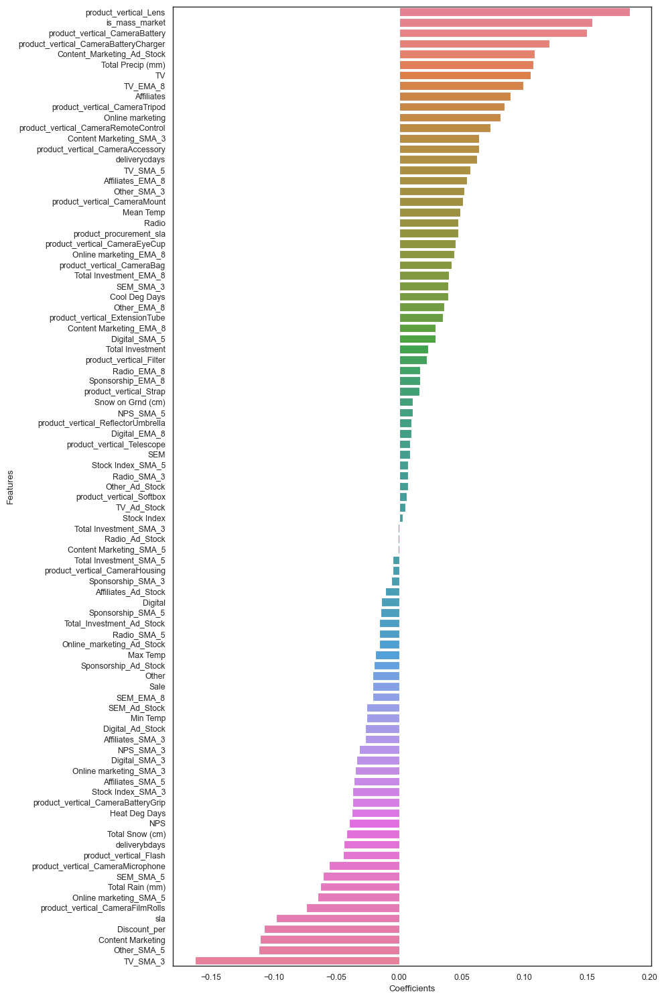

In [333]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_Lens	|0.184|
|is_mass_market	|0.154|
|product_vertical_CameraBattery	|0.150|
|product_vertical_CameraBatteryCharger	|0.120|
|Content_Marketing_Ad_Stock	|0.108|

### Building Linear Regression model for `gamingaccessory`

In [334]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_mul_model = LinearRegression().fit(X_gamingaccessory_mul_train, y_gamingaccessory_mul_train)
y_gamingaccessory_mul_test_pred = gamingaccessory_mul_model.predict(X_gamingaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))

R2 Score: 0.9349112240513577
Mean Squared Error: 0.10228544835529625


##### With Simple Linear Regression, we get a r2 score of 0.93 and mse of 0.10

### Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [335]:
y_gamingaccessory_mul = gamingaccessory_mul_df.pop('gmv')
X_gamingaccessory_mul = gamingaccessory_mul_df

In [336]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_mul_model_cv = LinearRegression().fit(X_gamingaccessory_mul, y_gamingaccessory_mul)
gamingaccessory_mul_predictions_cv = cross_val_predict(gamingaccessory_mul_model_cv, X_gamingaccessory_mul, \
                                                       y_gamingaccessory_mul, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.9427118671904613
Mean Squared Error: 0.05728813280953875


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.94 and mse score of 0.06

### Determining Feature Importance for `gamingaccessory` with model with cv

In [337]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_mul_lr_model_parameters = list(gamingaccessory_mul_model_cv.coef_)
gamingaccessory_mul_lr_model_parameters.insert(0, gamingaccessory_mul_model_cv.intercept_)
gamingaccessory_mul_lr_model_parameters = [round(x, 3) for x in gamingaccessory_mul_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_mul_lr_coef = list(zip(cols, gamingaccessory_mul_lr_model_parameters))
gamingaccessory_mul_lr_coef

[('constant', 0.0),
 ('Discount_per', -0.088),
 ('deliverybdays', 0.021),
 ('deliverycdays', -0.012),
 ('sla', 0.038),
 ('product_procurement_sla', -0.008),
 ('is_cod', -0.0),
 ('is_mass_market', 0.24),
 ('product_vertical_GameControlMount', 0.0),
 ('product_vertical_GamePad', 0.209),
 ('product_vertical_GamingAccessoryKit', -0.061),
 ('product_vertical_GamingAdapter', -0.027),
 ('product_vertical_GamingChargingStation', 0.057),
 ('product_vertical_GamingHeadset', 0.256),
 ('product_vertical_GamingKeyboard', -0.035),
 ('product_vertical_GamingMemoryCard', -0.122),
 ('product_vertical_GamingMouse', 0.224),
 ('product_vertical_GamingMousePad', 0.043),
 ('product_vertical_GamingSpeaker', -0.015),
 ('product_vertical_JoystickGamingWheel', 0.133),
 ('product_vertical_MotionController', 0.075),
 ('product_vertical_TVOutCableAccessory', -0.035),
 ('payday_week', -0.0),
 ('holiday_week', -0.0),
 ('Total Investment', 0.006),
 ('Total Investment_SMA_3', -0.065),
 ('Total Investment_SMA_5', -0.06

In [338]:
gamingaccessory_mul_lr_coef_df = pd.DataFrame(gamingaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.rename(columns=col_rename)
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.iloc[1:,:]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.loc[gamingaccessory_mul_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_GamingHeadset,0.256
7,is_mass_market,0.240
16,product_vertical_GamingMouse,0.224
9,product_vertical_GamePad,0.209
50,Online marketing_SMA_3,0.162
48,Content_Marketing_Ad_Stock,0.136
19,product_vertical_JoystickGamingWheel,0.133
40,Sponsorship_SMA_3,0.105
55,Affiliates_SMA_3,0.098
71,Other_SMA_5,0.076


### Plotting the Features in descending order of Importance for `gamingaccessory`

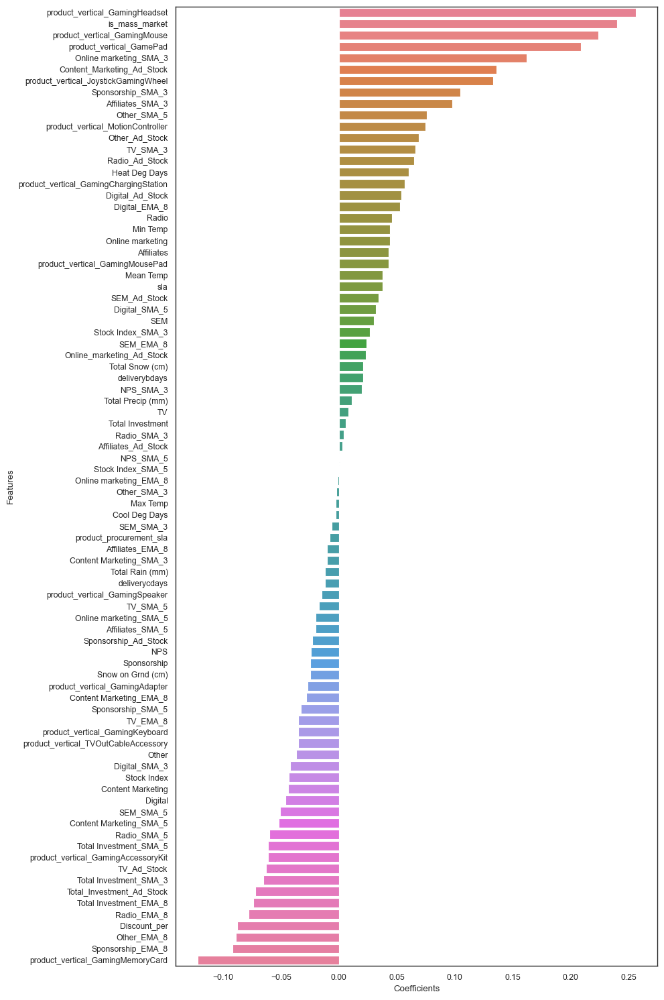

In [339]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_GamingHeadset	|0.256|
|is_mass_market	|0.240|
|product_vertical_GamingMouse	|0.224|
|product_vertical_GamePad	|0.209|
|Online marketing_SMA_3	|0.162|

### Building Linear Regression model for `homeaudio`

In [340]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_mul_model = LinearRegression().fit(X_homeaudio_mul_train, y_homeaudio_mul_train)
y_homeaudio_mul_test_pred = homeaudio_mul_model.predict(X_homeaudio_mul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))

R2 Score: -0.5027933343857536
Mean Squared Error: 0.31447051152820565


##### With Simple Linear Regression, we get a r2 score of -0.50 and mse of 0.31

*Here R2 is negative which signifies that the chosen model does not follow the trend of the data, so fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

### Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [341]:
y_homeaudio_mul = homeaudio_mul_df.pop('gmv')
X_homeaudio_mul = homeaudio_mul_df

In [342]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_mul_model_cv = LinearRegression().fit(X_homeaudio_mul, y_homeaudio_mul)
homeaudio_mul_predictions_cv = cross_val_predict(homeaudio_mul_model_cv, X_homeaudio_mul, y_homeaudio_mul, cv=5)
accuracy = metrics.r2_score(y_homeaudio_mul, homeaudio_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_mul, homeaudio_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.887555939592786
Mean Squared Error: 0.11244406040721404


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.89 and mse score of 0.11

### Determining Feature Importance for `homeaudio` with model with cv

In [343]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_mul_lr_model_parameters = list(homeaudio_mul_model_cv.coef_)
homeaudio_mul_lr_model_parameters.insert(0, homeaudio_mul_model_cv.intercept_)
homeaudio_mul_lr_model_parameters = [round(x, 3) for x in homeaudio_mul_lr_model_parameters]
cols = X_homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_mul_lr_coef = list(zip(cols, homeaudio_mul_lr_model_parameters))
homeaudio_mul_lr_coef

[('constant', -0.0),
 ('Discount_per', 0.108),
 ('deliverybdays', 0.063),
 ('deliverycdays', -0.106),
 ('sla', -0.025),
 ('product_procurement_sla', -0.033),
 ('is_cod', 0.0),
 ('is_mass_market', 0.217),
 ('product_vertical_DJController', 0.024),
 ('product_vertical_Dock', 0.006),
 ('product_vertical_DockingStation', 0.039),
 ('product_vertical_FMRadio', 0.19),
 ('product_vertical_HiFiSystem', -0.022),
 ('product_vertical_HomeAudioSpeaker', 0.46),
 ('product_vertical_KaraokePlayer', -0.0),
 ('product_vertical_SlingBox', 0.005),
 ('product_vertical_SoundMixer', -0.004),
 ('product_vertical_VoiceRecorder', -0.005),
 ('payday_week', -0.0),
 ('holiday_week', 0.0),
 ('Total Investment', 0.097),
 ('Total Investment_SMA_3', -0.035),
 ('Total Investment_SMA_5', -0.082),
 ('Total Investment_EMA_8', 0.048),
 ('Total_Investment_Ad_Stock', 0.017),
 ('TV', -0.032),
 ('TV_SMA_3', -0.032),
 ('TV_SMA_5', -0.105),
 ('TV_EMA_8', 0.044),
 ('TV_Ad_Stock', 0.003),
 ('Digital', -0.031),
 ('Digital_SMA_3', 0

In [344]:
homeaudio_mul_lr_coef_df = pd.DataFrame(homeaudio_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.rename(columns=col_rename)
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.iloc[1:,:]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.loc[homeaudio_mul_lr_coef_df['Coefficients']!=0.0]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_HomeAudioSpeaker,0.460
7,is_mass_market,0.217
11,product_vertical_FMRadio,0.190
35,Sponsorship,0.158
69,Other_Ad_Stock,0.154
56,SEM_SMA_3,0.132
83,Total Precip (mm),0.125
42,Content Marketing_SMA_5,0.123
1,Discount_per,0.108
64,Radio_Ad_Stock,0.104


### Plotting the Features in descending order of Importance for `homeaudio`

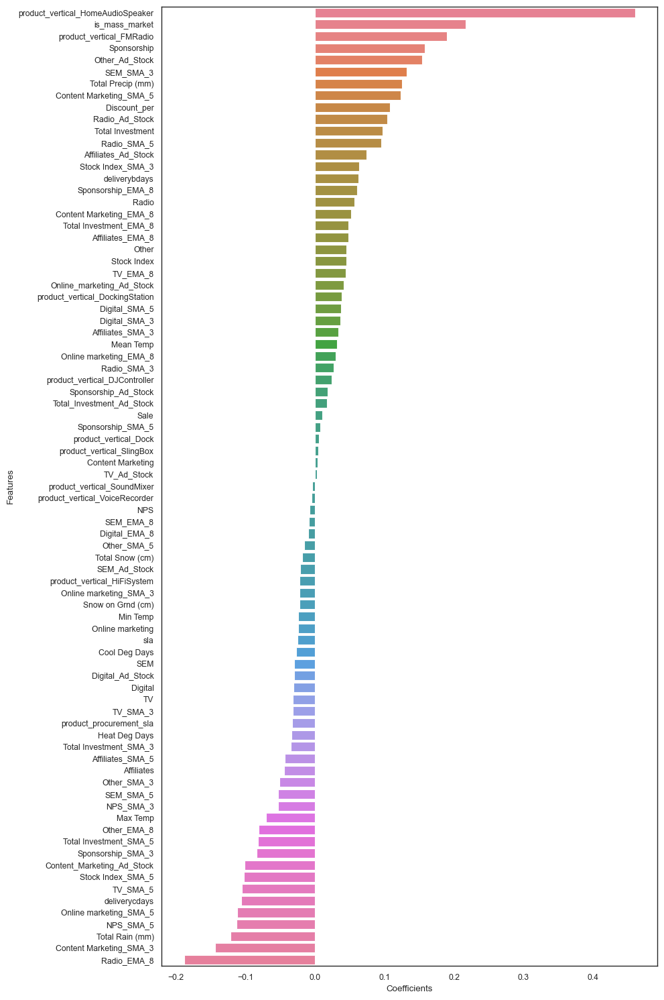

In [345]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_HomeAudioSpeaker	|0.460|
|is_mass_market	|0.217|
|product_vertical_FMRadio	|0.190|
|Sponsorship	|0.158|
|Other_Ad_Stock	|0.154|

## Koyck Model

*The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.*

*The Koyck tells us that the current revenue generated is not just influenced by the different independent attributes, but also because of the revenue generated over the last periods. ie. Current revenue(Yt) is also dependent on the past revenue values(Yt-1).*


  __Yt__ = __α__ +             __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__
  
  __Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

In [346]:
homeaudio_org_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [347]:
# Making copy of dataframes from the original ones
cameraaccessory_koy_df = cameraaccessory_org_df.copy()
gamingaccessory_koy_df = gamingaccessory_org_df.copy()
homeaudio_koy_df = homeaudio_org_df.copy()
homeaudio_koy_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [348]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_koy_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_koy_df.isnull().sum()/homeaudio_koy_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Week,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### Creating a new variable which is the Lag of 1 week of the dependent variable (GMV)

In [349]:
GMV_Lag = ['gmv']

In [350]:
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [351]:
cameraaccessory_koy_df = lag_variables(cameraaccessory_koy_df,GMV_Lag,1) 
gamingaccessory_koy_df = lag_variables(gamingaccessory_koy_df,GMV_Lag,1) 
homeaudio_koy_df = lag_variables(homeaudio_koy_df,GMV_Lag,1) 
homeaudio_koy_df.head()

,Week,gmv,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,NaN,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [352]:
# Imputing all null values with 0
cameraaccessory_koy_df.fillna(value=0, inplace=True)
gamingaccessory_koy_df.fillna(value=0, inplace=True)
homeaudio_koy_df.fillna(value=0, inplace=True)
homeaudio_koy_df.head(10)

,Week,gmv,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,0.000,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0
30,36,3875305.000,2599.000,35.972,0.000,0.000,5.599,2.790,0,1307,5

### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [353]:
# removing columns
cameraaccessory_koy_df = cameraaccessory_koy_df.drop('Week', axis=1)
gamingaccessory_koy_df = gamingaccessory_koy_df.drop('Week', axis=1)
homeaudio_koy_df = homeaudio_koy_df.drop('Week', axis=1)
homeaudio_koy_df.head()

,gmv,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,0.000,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [354]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_koy_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_koy_df.isnull().sum()/homeaudio_koy_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [355]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_koy_df[cameraaccessory_koy_df.columns]=scaler.fit_transform(cameraaccessory_koy_df[cameraaccessory_koy_df.columns])
gamingaccessory_koy_df[gamingaccessory_koy_df.columns]=scaler.fit_transform(gamingaccessory_koy_df[gamingaccessory_koy_df.columns])
homeaudio_koy_df[homeaudio_koy_df.columns]=scaler.fit_transform(homeaudio_koy_df[homeaudio_koy_df.columns])

homeaudio_koy_df.head()

,gmv,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,-0.107,-1.832,-0.920,-0.639,-0.639,1.882,1.297,0.000,-0.170,1.670,-0.198,-1.132,0.062,-0.420,-0.206,-0.146,-0.197,-0.542,-0.233,-1.043,0.000,-1.229,-1.739,-1.806,-1.814,-1.789,-1.331,-1.512,-1.593,-1.803,-1.633,0.042,-0.831,-0.893,0.061,-0.563,-0.922,-1.326,-1.378,-1.404,-1.357,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.266,-2.221,-2.172,-2.283,-2.144,-2.346,-2.246,-2.136,-2.313,-0.308,-1.054,-1.129,-0.519,-0.896,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,-4.560,-3.235,0.157,-4.601,-3.265,0.776,1.118,0.959,-1.035,0.461,0.430,-0.368,0.324,-0.275,-0.435
26,0.203,-0.092,-0.594,-0.639,-0.639,1.437,0.560,0.000,0.137,1.267,0.481,-1.132,0.374,0.967,0.079,-0.146,-0.197,-0.542,-0.021,0.959,0.000,-1.229,-1.739,-1.806,-1.814,-1.667,-1.331,-1.512,-1.593,-1.803,-1.608,0.042,-0.831,-0.893,0.061,-0.303,-0.922,-1.326,-1.378,-1.404,-1.265,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.266,-2.221,-2.172,-2.234,-2.144,-2.346,-2.246,-2.136,-2.248,-0.308,-1.054,-1.129,-0.519,-0.687,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,-4.560,-3.235,0.157,-4.601,-3.265,1.308,0.947,1.314,-1.075,1.755,-0.424,-0.368,-0.472,-0.275,0.870
27,-0.066,0.212,-0.725,-0.639,-0.639,1.538,1.280,0.000,0.085,0.059,0.721,-1.310,0.390,0.529,-0.142,-0.146,-0.197,-0.542,-0.835,-1.043,0.000,-1.229,-1.299,-1.806,-1.814,-1.594,-1.331,-1.420,-1.593,-1.803,-1.593,0.042,0.082,-0.893,0.061,-0.147,-0.922,-0.994,-1.378,-1.404,-1.210,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.071,-2.221,-2.172,-2.205,-2.144,-2.083,-2.246,-2.136,-2.208,-0.308,-0.317,-1.129,-0.519,-0.563,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,0.743,-3.235,0.157,0.255,-3.265,1.149,1.347,1.300,-1.075,1.698,-0.515,-0.368,-0.557,-0.275,-0.435
28,-0.543,-0.052,-0.757,-0.639,-0.639,1.687,0.487,0.000,-0.545,-0.747,0.202,-1.310,-0.455,-0.639,-0.606,-0.146,-0.197,-0.542,-0.906,0.959,0.000,-1.229,-1.299,-1.806,-1.814,-1.550,-1.331,-1.420,-1.593,-1.803,-1.585,0.042,0.082,-0.893,0.061,-0.054,-0.922,-0.994,-1.378,-1.404,-1.176,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.071,-2.221,-2.172,-2.187,-2.144,-2.083,-2.246,-2.136,-2.185,-0.308,-0.317,-1.129,-0.519,-0.488,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,0.743,-3.235,0.157,0.255,-3.265,1.361,1.518,1.473,-1.075,2.395,0.491,-0.368,0.382,-0.275,-0.435
29,-1.882,-0.519,-4.223,-0.639,-0.639,3.768,-4.146,0.000,-1.893,-1.552,-1.517,-1.310,-2.715,-2.099,-1.779,-0.146,-0.197,-0.542,-2.465,-1.043,0.000,-1.538,-1.411,-1.408,-1.922,-1.679,-1.414,-1.450,-1.514,-1.829,-1.619,-0.434,-0.100,

### Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [356]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_train, cameraaccessory_test = train_test_split(cameraaccessory_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_train, gamingaccessory_test = train_test_split(gamingaccessory_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_train, homeaudio_test = train_test_split(homeaudio_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

### Dividing the 3 dataframes into X and Y sets for the model building

In [357]:
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train

X_homeaudio_train.head()

,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
12,-0.417,-0.416,1.839,1.854,0.152,0.222,0.000,-0.467,0.461,-0.318,0.999,-0.180,0.675,-0.598,-0.146,6.119,0.223,1.148,-1.043,0.000,-0.283,0.470,0.708,0.394,0.331,0.628,1.853,2.252,1.697,1.682,-0.482,-0.222,-0.131,-0.437,-0.329,-0.242,0.280,0.475,0.067,0.152,-0.678,-0.493,-0.500,-0.515,-0.587,0.125,0.344,0.410,0.465,0.333,0.358,0.556,0.607,0.631,0.540,-0.413,-0.340,-0.310,-0.566,-0.430,-0.476,0.435,0.651,0.566,0.256,-0.456,1.162,1.617,1.283,0.913,0.769,0.292,0.340,0.970,-0.101,-0.019,-0.978,-1.278,-1.209,1.287,-0.641,-0.155,0.330,-0.076,-0.275,-0.435
10,-0.023,-0.239,-0.347,-0.317,-0.099,-0.403,0.000,-0.181,1.267,-0.638,-0.422,0.202,0.602,-0.402,-0.146,-0.197,-0.159,0.582,-1.043,0.000,0.744,0.842,0.268,0.409,0.604,2.237,2.432,1.312,1.529,1.995,-0.094,-0.074,-0.124,-0.345,-0.156,0.454,0.538,0.017,-0.040,0.280,-0.307,-0.351,-0.341,-0.292,-0.361,0.404,0.438,0.319,0.510,0.409,0.612,0.640,0.461,0.640,0.583,-0.286,-0.292,-0.363,-0.540,-0.391,0.771,0.945,0.319,0.869,0.765,1.658,2.021,1.050,1.620,1.733,-0.022,0.201,0.337,-1.866,-0.413,0.096,-0.021,-0.707,-0.695,0.656,-0.641,2.802,-0.368,2.538,-0.275,-0.435
32,-0.238,-0.106,-0.639,-0.639,0.583,0.241,0.000,-0.257,1.267,0.561,-0.600,0.148,0.237,-0.508,-0.146,-0.197,-0.542,-0.871,0.959,0.000,0.654,-0.049,-0.680,-0.858,-0.110,0.108,-0.414,-0.888,-1.051,-0.499,-0.329,-0.382,-0.418,-0.575,-0.453,1.308,0.563,-0.132,-0.130,0.590,-0.042,-0.305,-0.588,-0.745,-0.375,0.106,-0.659,-1.257,-1.303,-0.740,0.041,-0.723,-1.288,-1.335,-0.797,-0.154,-0.349,-0.525,-0.710,-0.421,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,-0.613,0.421,0.714,-0.792,0.086,0.299,0.723,1.175,1.011,-1.075,0.538,-0.509,-0.368,-0.552,-0.275,-0.435
22,-0.383,-1.292,1.691,1.694,-0.740,0.267,0.000,-0.498,-0.344,-0.878,0.644,-0.186,-1.515,-0.600,-0.146,-0.197,2.137,1.007,0.959,0.000,-0.616,-0.465,-0.304,-0.389,-0.510,-0.763,-0.886,-0.993,-0.739,-0.925,-0.309,-0.416,-0.508,-0.787,-0.508,-0.212,-0.199,-0.152,-0.196,-0.209,-0.669,-0.518,-0.366,-0.590,-0.599,-1.115,-0.562,-0.102,-0.095,-0.539,-1.064,-0.589,-0.205,-0.137,-0.558,-0.476,-0.418,-0.341,-0.606,-0.492,-0.476,-0.070,0.328,0.214,-0.094,-0.456,-0.341,-0.226,-0.253,-0.402,0.399,0.243,0.269,0.370,0.372,0.453,1.308,0.662,1.097,-1.015,1.081,-0.509,-0.368,-0.552,-0.275,-0.435
45,0.818,0.693,-0.639,-0.639,0.210,0.979,0.000,-0.275,0.461,0.122,0.289,-0.218,0.164,0.107,-0.146,-0.197,-0.542,-0.410,0.959,0.000,0.904,0.449,0.045,0.624,0.574,0.703,0.491,0.304,0.527,0.560,0.210,0.028,-0.138,0.394,0.121,1.063,0.538,0.055,0.718,0.676,0.461,0.136,-0.202,0.468,0.247,0.994,0.699,0.459,0.659,0.754,0.910,0.685,0

### Dividing into X and Y test sets for the model building for 3 dataframes

In [358]:
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

X_homeaudio_test.head()

,gmv_lag1,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,-0.358,0.004,-0.639,-0.639,-0.191,1.508,0.000,-0.043,1.267,0.601,-0.777,0.562,0.456,-0.388,-0.146,-0.197,-0.542,0.404,-1.043,0.000,0.654,-0.842,-1.187,-1.428,-0.761,0.108,-0.962,-1.239,-1.417,-0.936,-0.329,-0.422,-0.445,-0.565,-0.478,1.308,-0.362,-0.734,-0.825,-0.172,-0.042,-0.563,-0.767,-0.946,-0.592,0.106,-1.455,-1.731,-1.745,-1.339,0.041,-1.520,-1.753,-1.764,-1.389,-0.154,-0.554,-0.662,-0.842,-0.587,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,-0.613,0.844,0.902,-0.792,0.230,0.363,1.255,0.719,0.860,-0.895,0.524,-0.549,-0.368,-0.589,-0.275,-0.435
5,0.003,1.370,-0.636,-0.636,-0.740,-0.306,0.000,0.522,-1.149,0.561,-0.600,0.100,-0.566,0.971,-0.146,-0.197,-0.542,0.546,0.959,0.000,-0.721,-0.747,-0.355,-0.276,-0.599,-0.604,-0.635,-0.236,-0.133,-0.452,-0.273,-0.279,-0.441,-0.538,-0.411,-0.843,-0.906,-1.022,-0.953,-1.015,-0.193,-0.219,-0.002,0.096,-0.113,0.038,0.068,0.506,0.623,0.314,0.105,0.138,0.579,0.668,0.384,-0.455,-0.482,-0.470,-0.496,-0.528,-0.476,-0.584,1.378,1.153,0.333,-0.456,-0.555,1.276,1.017,0.287,0.346,0.328,0.301,0.720,0.441,0.268,-0.340,-1.677,-0.759,0.734,-0.641,-0.820,-0.368,-0.842,0.560,1.523
9,0.750,0.096,-0.582,-0.583,-0.439,-0.563,0.000,-0.051,-1.149,-0.318,0.822,0.051,-0.420,0.022,-0.146,-0.197,0.606,0.546,0.959,0.000,0.744,0.312,-0.071,0.160,0.353,2.237,1.410,0.656,1.043,1.517,-0.094,-0.142,-0.171,-0.391,-0.195,0.454,0.057,-0.296,-0.304,0.041,-0.307,-0.307,-0.311,-0.233,-0.331,0.404,0.314,0.245,0.493,0.365,0.612,0.473,0.364,0.604,0.520,-0.286,-0.356,-0.405,-0.557,-0.421,0.771,0.435,-0.013,0.741,0.566,1.658,1.162,0.483,1.283,1.356,-0.022,0.244,0.356,-1.866,-0.129,0.223,-0.500,-0.593,-0.329,0.208,-0.641,-0.679,-0.368,-0.710,-0.275,-0.435
3,0.001,1.464,-0.638,-0.638,-0.951,0.955,0.000,0.457,0.059,-0.398,-0.600,0.229,-0.566,1.123,-0.146,-0.197,-0.542,0.511,-1.043,0.000,-0.721,-0.132,0.038,0.208,-0.154,-0.604,0.019,0.183,0.288,-0.015,-0.273,-0.537,-0.617,-0.557,-0.536,-0.843,-1.060,-1.123,-0.745,-0.996,-0.193,0.138,0.245,0.355,0.132,0.038,0.751,0.913,0.922,0.718,0.105,0.842,0.989,0.952,0.787,-0.455,-0.453,-0.451,-0.313,-0.454,-0.476,2.572,3.433,2.458,2.144,-0.456,2.363,3.203,2.213,1.965,0.346,0.119,0.207,0.720,-0.027,0.060,-0.819,-0.935,-0.985,1.012,-0.641,0.142,-0.368,0.056,-0.275,0.870
18,-0.346,-0.363,1.622,1.619,-0.776,0.102,0.000,-0.457,1.267,-1.477,1.354,-0.385,-1.077,-0.590,-0.146,-0.197,0.989,1.396,0.959,0.000,-0.150,-0.128,-0.150,-0.061,-0.143,-0.986,-1.047,-0.351,-0.081,-0.696,-0.562,-0.609,-0.598,-0.862,-0.696,-0.200,-0.190,-0.166,-0.161,-0.193,-0.020,-0.022,-0.371,-0.399,-0.197,0.474,0.509,0.396,0.511,0.477,

### Building Linear Regression model for `cameraaccessory`

In [359]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_model = LinearRegression().fit(X_cameraaccessory_train, y_cameraaccessory_train)
y_cameraaccessory_test_pred = cameraaccessory_model.predict(X_cameraaccessory_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_cameraaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_cameraaccessory_test_pred)))

R2 Score: 0.8349716043463112
Mean Squared Error: 0.16332800575622214


##### With Simple Linear Regression, we get a r2 score of 0.83 and mse of 0.16

### Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [360]:
y_cameraaccessory = cameraaccessory_koy_df.pop('gmv')
X_cameraaccessory = cameraaccessory_koy_df

In [361]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_model_cv = LinearRegression().fit(X_cameraaccessory, y_cameraaccessory)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model_cv, X_cameraaccessory, y_cameraaccessory, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.3143826530920284
Mean Squared Error: 0.6856173469079717


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.31 and mse score of 0.69

### Determining Feature Importance for `cameraaccessory` with model without cv

In [362]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_model.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', -0.032),
 ('gmv_lag1', -0.13),
 ('Discount_per', -0.006),
 ('deliverybdays', -0.049),
 ('deliverycdays', -0.049),
 ('sla', 0.058),
 ('product_procurement_sla', -0.068),
 ('is_cod', 0.0),
 ('is_mass_market', 0.06),
 ('product_vertical_CameraAccessory', 0.045),
 ('product_vertical_CameraBag', 0.221),
 ('product_vertical_CameraBattery', 0.149),
 ('product_vertical_CameraBatteryCharger', -0.017),
 ('product_vertical_CameraBatteryGrip', 0.02),
 ('product_vertical_CameraEyeCup', 0.02),
 ('product_vertical_CameraFilmRolls', -0.091),
 ('product_vertical_CameraHousing', 0.15),
 ('product_vertical_CameraLEDLight', -0.023),
 ('product_vertical_CameraMicrophone', -0.096),
 ('product_vertical_CameraMount', 0.111),
 ('product_vertical_CameraRemoteControl', -0.004),
 ('product_vertical_CameraTripod', 0.005),
 ('product_vertical_ExtensionTube', 0.091),
 ('product_vertical_Filter', 0.119),
 ('product_vertical_Flash', -0.042),
 ('product_vertical_FlashShoeAdapter', -0.025),
 ('product_vert

In [363]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
26,product_vertical_Lens,0.337
10,product_vertical_CameraBag,0.221
16,product_vertical_CameraHousing,0.150
11,product_vertical_CameraBattery,0.149
59,Online marketing,0.144
64,Affiliates,0.119
23,product_vertical_Filter,0.119
19,product_vertical_CameraMount,0.111
22,product_vertical_ExtensionTube,0.091
55,Content Marketing_SMA_3,0.073


### Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

#### Calculating the coefficient of lag variable

In [364]:
cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   -0.130
Name: Coefficients, dtype: float64

In [365]:
cameraaccessory_lr_coef_df['Total Effect'] = cameraaccessory_lr_coef_df['Coefficients']/(1-(-0.130))
cameraaccessory_lr_coef_df

,Features,Coefficients,Total Effect
26,product_vertical_Lens,0.337,0.298
10,product_vertical_CameraBag,0.221,0.196
16,product_vertical_CameraHousing,0.150,0.133
11,product_vertical_CameraBattery,0.149,0.132
59,Online marketing,0.144,0.127
64,Affiliates,0.119,0.105
23,product_vertical_Filter,0.119,0.105
19,product_vertical_CameraMount,0.111,0.098
22,product_vertical_ExtensionTube,0.091,0.081
55,Content Marketing_SMA_3,0.073,0.065


### Plotting the Features in descending order of Importance for `cameraaccessory`

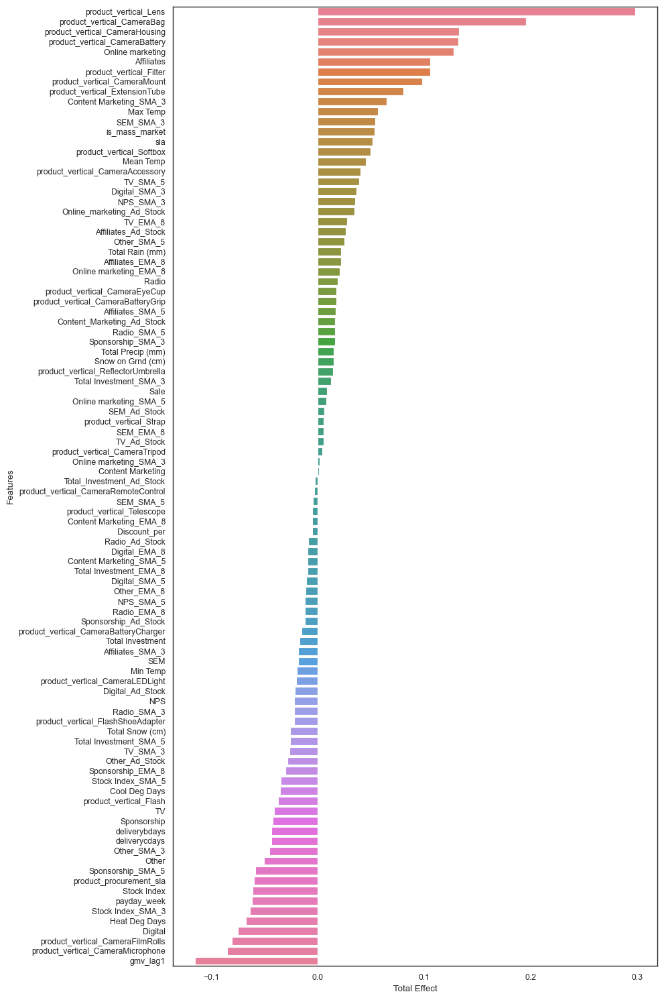

In [366]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_Lens|	0.298|
|product_vertical_CameraBag|	0.221|
|product_vertical_CameraHousing	|0.150|
|product_vertical_CameraBattery|	0.149|
|Online marketing|	0.144|

### Building Linear Regression model for `gamingaccessory`

In [367]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_model = LinearRegression().fit(X_gamingaccessory_train, y_gamingaccessory_train)
y_gamingaccessory_test_pred = gamingaccessory_model.predict(X_gamingaccessory_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gamingaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gamingaccessory_test_pred)))

R2 Score: 0.9367253722676729
Mean Squared Error: 0.050641149533416585


##### With Simple Linear Regression, we get a r2 score of 0.94 and mse of 0.05

### Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [368]:
y_gamingaccessory = gamingaccessory_koy_df.pop('gmv')
X_gamingaccessory = gamingaccessory_koy_df

In [369]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_model_cv = LinearRegression().fit(X_gamingaccessory, y_gamingaccessory)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model_cv, X_gamingaccessory, y_gamingaccessory, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.3606369424348653
Mean Squared Error: 0.6393630575651347


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.36 and mse score of 0.64

### Determining Feature Importance for `gamingaccessory` with model without cv

In [370]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_model.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.023),
 ('gmv_lag1', -0.02),
 ('Discount_per', -0.003),
 ('deliverybdays', 0.012),
 ('deliverycdays', 0.012),
 ('sla', 0.055),
 ('product_procurement_sla', 0.03),
 ('is_cod', -0.0),
 ('is_mass_market', 0.175),
 ('product_vertical_GameControlMount', -0.011),
 ('product_vertical_GamePad', 0.202),
 ('product_vertical_GamingAccessoryKit', 0.116),
 ('product_vertical_GamingAdapter', 0.053),
 ('product_vertical_GamingChargingStation', 0.007),
 ('product_vertical_GamingHeadset', 0.191),
 ('product_vertical_GamingKeyboard', 0.077),
 ('product_vertical_GamingMemoryCard', 0.035),
 ('product_vertical_GamingMouse', 0.115),
 ('product_vertical_GamingMousePad', 0.014),
 ('product_vertical_GamingSpeaker', 0.035),
 ('product_vertical_JoystickGamingWheel', 0.09),
 ('product_vertical_MotionController', 0.051),
 ('product_vertical_TVOutCableAccessory', 0.088),
 ('payday_week', -0.045),
 ('holiday_week', 0.0),
 ('Total Investment', 0.003),
 ('Total Investment_SMA_3', 0.0),
 ('Total Investme

In [371]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
10,product_vertical_GamePad,0.202
14,product_vertical_GamingHeadset,0.191
8,is_mass_market,0.175
11,product_vertical_GamingAccessoryKit,0.116
17,product_vertical_GamingMouse,0.115
20,product_vertical_JoystickGamingWheel,0.090
22,product_vertical_TVOutCableAccessory,0.088
85,Cool Deg Days,0.079
15,product_vertical_GamingKeyboard,0.077
30,TV,0.074


### Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

##### Calculating the coefficient of lag variable

In [372]:
gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   -0.020
Name: Coefficients, dtype: float64

In [373]:
gamingaccessory_lr_coef_df['Total Effect'] = gamingaccessory_lr_coef_df['Coefficients']/(1-(-0.020))
gamingaccessory_lr_coef_df

,Features,Coefficients,Total Effect
10,product_vertical_GamePad,0.202,0.198
14,product_vertical_GamingHeadset,0.191,0.187
8,is_mass_market,0.175,0.172
11,product_vertical_GamingAccessoryKit,0.116,0.114
17,product_vertical_GamingMouse,0.115,0.113
20,product_vertical_JoystickGamingWheel,0.090,0.088
22,product_vertical_TVOutCableAccessory,0.088,0.086
85,Cool Deg Days,0.079,0.077
15,product_vertical_GamingKeyboard,0.077,0.075
30,TV,0.074,0.073


### Plotting the Features in descending order of Importance for `gamingaccessory`

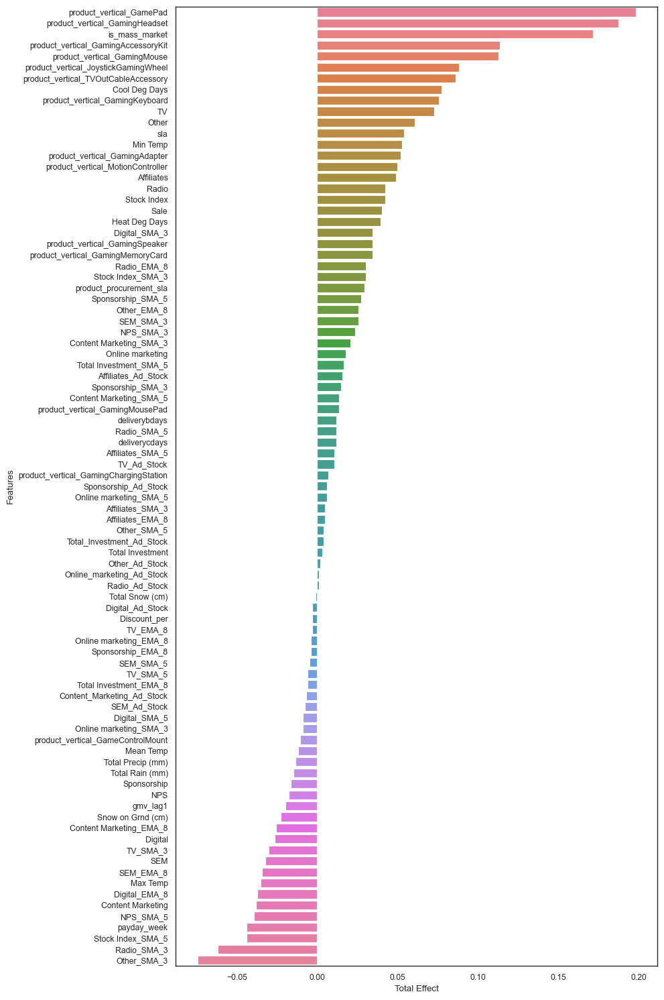

In [374]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_GamePad|	0.202|
|product_vertical_GamingHeadset	|0.191|
|is_mass_market	|0.175|
|product_vertical_GamingAccessoryKit|	0.116|
|product_vertical_GamingMouse |0.115|

### Building Linear Regression model for `homeaudio`

In [375]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_model = LinearRegression().fit(X_homeaudio_train, y_homeaudio_train)
y_homeaudio_test_pred = homeaudio_model.predict(X_homeaudio_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_pred)))

R2 Score: 0.9549487921051122
Mean Squared Error: 0.10802223360719614


##### With Simple Linear Regression, we get a r2 score of 0.95 and mse of 0.11

### Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [376]:
y_homeaudio = homeaudio_koy_df.pop('gmv')
X_homeaudio = homeaudio_koy_df

In [377]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_cv = LinearRegression().fit(X_homeaudio, y_homeaudio)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model_cv, X_homeaudio, y_homeaudio, cv=5)
accuracy = metrics.r2_score(y_homeaudio, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7353084703238013
Mean Squared Error: 0.2646915296761985


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.74 and mse score of 0.26

### Determining Feature Importance for `homeaudio` with model without cv

In [378]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.022),
 ('gmv_lag1', 0.055),
 ('Discount_per', 0.096),
 ('deliverybdays', -0.008),
 ('deliverycdays', -0.022),
 ('sla', -0.13),
 ('product_procurement_sla', -0.103),
 ('is_cod', 0.0),
 ('is_mass_market', 0.2),
 ('product_vertical_DJController', 0.055),
 ('product_vertical_Dock', 0.036),
 ('product_vertical_DockingStation', 0.005),
 ('product_vertical_FMRadio', 0.084),
 ('product_vertical_HiFiSystem', 0.075),
 ('product_vertical_HomeAudioSpeaker', 0.428),
 ('product_vertical_KaraokePlayer', 0.0),
 ('product_vertical_SlingBox', 0.055),
 ('product_vertical_SoundMixer', -0.0),
 ('product_vertical_VoiceRecorder', 0.047),
 ('payday_week', 0.045),
 ('holiday_week', -0.0),
 ('Total Investment', -0.036),
 ('Total Investment_SMA_3', 0.006),
 ('Total Investment_SMA_5', -0.002),
 ('Total Investment_EMA_8', 0.064),
 ('Total_Investment_Ad_Stock', -0.057),
 ('TV', 0.007),
 ('TV_SMA_3', -0.05),
 ('TV_SMA_5', 0.023),
 ('TV_EMA_8', -0.038),
 ('TV_Ad_Stock', -0.043),
 ('Digital', 0.013),


In [379]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
14,product_vertical_HomeAudioSpeaker,0.428
8,is_mass_market,0.200
71,NPS,0.113
59,SEM_EMA_8,0.110
79,Mean Temp,0.101
68,Other_SMA_5,0.101
2,Discount_per,0.096
12,product_vertical_FMRadio,0.084
44,Content Marketing_EMA_8,0.081
13,product_vertical_HiFiSystem,0.075


### Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

##### Calculating the coefficient of lag variable

In [380]:
homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   0.055
Name: Coefficients, dtype: float64

In [381]:
homeaudio_lr_coef_df['Total Effect'] = homeaudio_lr_coef_df['Coefficients']/(1-(0.055))
homeaudio_lr_coef_df

,Features,Coefficients,Total Effect
14,product_vertical_HomeAudioSpeaker,0.428,0.453
8,is_mass_market,0.200,0.212
71,NPS,0.113,0.120
59,SEM_EMA_8,0.110,0.116
79,Mean Temp,0.101,0.107
68,Other_SMA_5,0.101,0.107
2,Discount_per,0.096,0.102
12,product_vertical_FMRadio,0.084,0.089
44,Content Marketing_EMA_8,0.081,0.086
13,product_vertical_HiFiSystem,0.075,0.079


### Plotting the Features in descending order of Importance for `homeaudio`

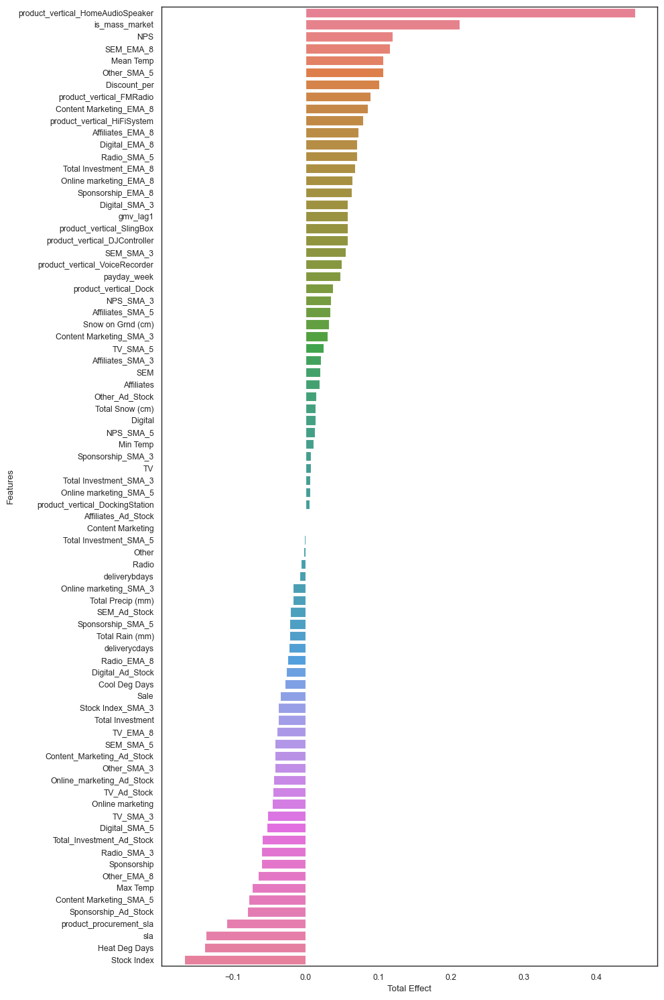

In [382]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_HomeAudioSpeaker|	0.428|
|is_mass_market|	0.200|
|NPS|	0.113|
|SEM_SMA_8|	0.110|
|Mean Temp	|0.101|

## Distributive Lag Model(Additive)

*The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.*

*In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.*


  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [383]:
homeaudio_org_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [384]:
# Making copy of dataframes from the original ones
cameraaccessory_dladd_df = cameraaccessory_org_df.copy()
gamingaccessory_dladd_df = gamingaccessory_org_df.copy()
homeaudio_dladd_df = homeaudio_org_df.copy()
homeaudio_dladd_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [385]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Week,0,0.000
Affiliates_Ad_Stock,0,0.000
Radio_SMA_5,0,0.000
Radio_SMA_3,0,0.000
Radio,0,0.000


### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [386]:
# removing columns
cameraaccessory_dladd_df = cameraaccessory_dladd_df.drop('Week', axis=1)
gamingaccessory_dladd_df = gamingaccessory_dladd_df.drop('Week', axis=1)
homeaudio_dladd_df = homeaudio_dladd_df.drop('Week', axis=1)
homeaudio_dladd_df.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


### Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [387]:
cameraaccessory_dladd_df_columns = cameraaccessory_dladd_df.columns
gamingaccessory_dladd_df_columns = gamingaccessory_dladd_df.columns
homeaudio_dladd_df_columns = homeaudio_dladd_df.columns

In [388]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,3)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,3)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,3)
homeaudio_dladd_df.head()

,gmv,gmv_lag3,Discount_per,Discount_per_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,is_cod,is_cod_lag3,is_mass_market,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Sale,Sale_lag3
25,4573783.133,NaN,31.451,NaN,0.000,NaN,0.000,NaN,7.369,NaN,2.863,NaN,0,NaN,1366,NaN,8,NaN,33,NaN,1,NaN,516.000,NaN,23,NaN,1374.000,NaN,0,NaN,0,NaN,0,NaN,63,NaN,0,NaN,0,NaN,4.265,NaN,0.000,NaN,0.000,NaN,4.265,NaN,4.265,NaN,0.054,NaN,0.000,NaN,0.000,NaN,0.054,NaN,0.054,NaN,0.633,NaN,0.000,NaN,0.000,NaN,0.633,NaN,0.633,NaN,1.854,NaN,0.000,NaN,0.000,NaN,1.854,NaN,1.854,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.332,NaN,0.000,NaN,0.000,NaN,0.332,NaN,0.332,NaN,0.137,NaN,0.000,NaN,0.000,NaN,0.137,NaN,0.137,NaN,1.256,NaN,0.000,NaN,0.000,NaN,1.256,NaN,1.256,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,54.600,NaN,0.000,NaN,0.000,NaN,1177.000,NaN,0.000,NaN,0.000,NaN,28.000,NaN,12.500,NaN,20.100,NaN,0.283,NaN,2.383,NaN,4.4

### Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [389]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,2)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,2)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,2)
homeaudio_dladd_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock

### Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [390]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,1)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,1)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,1)
homeaudio_dladd_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

###  Imputing all null values with 0

In [391]:
# Imputing all null values with 0
cameraaccessory_dladd_df.fillna(value=0, inplace=True)
gamingaccessory_dladd_df.fillna(value=0, inplace=True)
homeaudio_dladd_df.fillna(value=0, inplace=True)
homeaudio_dladd_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

In [392]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.000
SEM_SMA_3_lag2,0,0.000
SEM_EMA_8_lag2,0,0.000
SEM_EMA_8_lag1,0,0.000
SEM_EMA_8,0,0.000


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [393]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_dladd_df[cameraaccessory_dladd_df.columns]=scaler.fit_transform(cameraaccessory_dladd_df[cameraaccessory_dladd_df.columns])
gamingaccessory_dladd_df[gamingaccessory_dladd_df.columns]=scaler.fit_transform(gamingaccessory_dladd_df[gamingaccessory_dladd_df.columns])
homeaudio_dladd_df[homeaudio_dladd_df.columns]=scaler.fit_transform(homeaudio_dladd_df[homeaudio_dladd_df.columns])

homeaudio_dladd_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

### Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [394]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_dladd_train, cameraaccessory_dladd_test = train_test_split(cameraaccessory_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dladd_train, gamingaccessory_dladd_test = train_test_split(gamingaccessory_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dladd_train, homeaudio_dladd_test = train_test_split(homeaudio_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

### Dividing the 3 dataframes into X and Y sets for the model building

In [395]:
y_cameraaccessory_dladd_train = cameraaccessory_dladd_train.pop('gmv')
X_cameraaccessory_dladd_train = cameraaccessory_dladd_train

y_gamingaccessory_dladd_train = gamingaccessory_dladd_train.pop('gmv')
X_gamingaccessory_dladd_train = gamingaccessory_dladd_train

y_homeaudio_dladd_train = homeaudio_dladd_train.pop('gmv')
X_homeaudio_dladd_train = homeaudio_dladd_train

X_homeaudio_dladd_train.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,

### Dividing into X and Y test sets for the model building for 3 dataframes

In [396]:
y_cameraaccessory_dladd_test = cameraaccessory_dladd_test.pop('gmv')
X_cameraaccessory_dladd_test = cameraaccessory_dladd_test

y_gamingaccessory_dladd_test = gamingaccessory_dladd_test.pop('gmv')
X_gamingaccessory_dladd_test = gamingaccessory_dladd_test

y_homeaudio_dladd_test = homeaudio_dladd_test.pop('gmv')
X_homeaudio_dladd_test = homeaudio_dladd_test

X_homeaudio_dladd_test.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,

### Building Linear Regression model for `cameraaccessory`

In [397]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_dladd_model = LinearRegression().fit(X_cameraaccessory_dladd_train, y_cameraaccessory_dladd_train)
y_cameraaccessory_dladd_test_pred = cameraaccessory_dladd_model.predict(X_cameraaccessory_dladd_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dladd_test, y_cameraaccessory_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dladd_test, y_cameraaccessory_dladd_test_pred)))

R2 Score: 0.8787244808495536
Mean Squared Error: 0.12002594227153049


##### With Simple Linear Regression, we get a r2 score of 0.88 and mse of 0.12

### Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [398]:
y_cameraaccessory_dladd = cameraaccessory_dladd_df.pop('gmv')
X_cameraaccessory_dladd = cameraaccessory_dladd_df

In [399]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_dladd_model_cv = LinearRegression().fit(X_cameraaccessory_dladd, y_cameraaccessory_dladd)
cameraaccessory_dladd_predictions_cv = cross_val_predict(cameraaccessory_dladd_model_cv, X_cameraaccessory_dladd, \
                                                         y_cameraaccessory_dladd, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dladd, cameraaccessory_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dladd, cameraaccessory_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.8220185645803091
Mean Squared Error: 0.177981435419691


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.82 and mse score of 0.18

### Determining Feature Importance for `cameraaccessory` with model with cv

In [400]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_dladd_model_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_dladd_model_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_dladd_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', -0.02),
 ('gmv_lag2', -0.017),
 ('gmv_lag3', 0.001),
 ('Discount_per', 0.003),
 ('Discount_per_lag1', 0.007),
 ('Discount_per_lag2', 0.011),
 ('Discount_per_lag3', 0.019),
 ('deliverybdays', 0.001),
 ('deliverybdays_lag1', -0.003),
 ('deliverybdays_lag2', -0.002),
 ('deliverybdays_lag3', 0.004),
 ('deliverycdays', 0.001),
 ('deliverycdays_lag1', -0.003),
 ('deliverycdays_lag2', -0.002),
 ('deliverycdays_lag3', 0.005),
 ('sla', -0.004),
 ('sla_lag1', -0.001),
 ('sla_lag2', 0.007),
 ('sla_lag3', 0.002),
 ('product_procurement_sla', 0.031),
 ('product_procurement_sla_lag1', 0.015),
 ('product_procurement_sla_lag2', -0.006),
 ('product_procurement_sla_lag3', -0.016),
 ('is_cod', -0.0),
 ('is_cod_lag1', -0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', -0.0),
 ('is_mass_market', 0.084),
 ('is_mass_market_lag1', -0.019),
 ('is_mass_market_lag2', 0.002),
 ('is_mass_market_lag3', 0.0),
 ('product_vertical_CameraAccessory', 0.053),
 ('product_vertical_CameraAccess

In [401]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
100,product_vertical_Lens,0.128
88,product_vertical_Filter,0.123
36,product_vertical_CameraBag,0.107
76,product_vertical_CameraRemoteControl,0.097
80,product_vertical_CameraTripod,0.086
28,is_mass_market,0.084
40,product_vertical_CameraBattery,0.074
82,product_vertical_CameraTripod_lag2,0.061
32,product_vertical_CameraAccessory,0.053
120,product_vertical_Telescope,0.051


### Plotting the Features in descending order of Importance for `cameraaccessory`

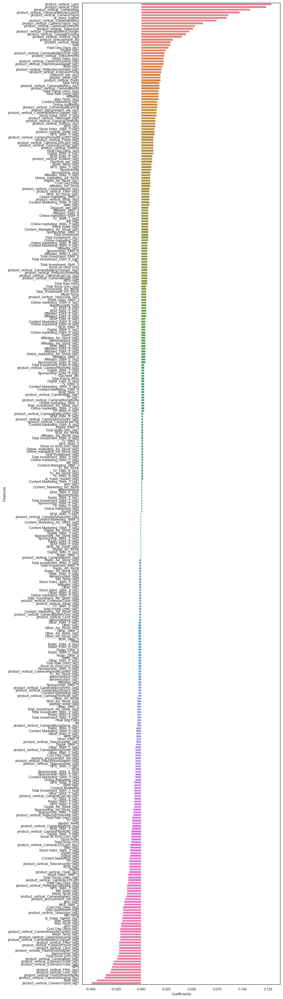

In [402]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_Lens	|0.128|
|product_vertical_Filter	|0.123|
|product_vertical_CameraBag	|0.107|
|product_vertical_CameraRemoteControl	|0.097|
|product_vertical_CameraTripod	|0.086|

### Building Linear Regression model for `gamingaccessory`

In [403]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_dladd_model = LinearRegression().fit(X_gamingaccessory_dladd_train, y_gamingaccessory_dladd_train)
y_gamingaccessory_dladd_test_pred = gamingaccessory_dladd_model.predict(X_gamingaccessory_dladd_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dladd_test, y_gamingaccessory_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dladd_test, y_gamingaccessory_dladd_test_pred)))

R2 Score: 0.8866858908057751
Mean Squared Error: 0.0906896959113819


##### With Simple Linear Regression, we get a r2 score of 0.89 and mse of 0.09

### Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [404]:
y_gamingaccessory_dladd = gamingaccessory_dladd_df.pop('gmv')
X_gamingaccessory_dladd = gamingaccessory_dladd_df

In [405]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_dladd_model_cv = LinearRegression().fit(X_gamingaccessory_dladd, y_gamingaccessory_dladd)
gamingaccessory_dladd_predictions_cv = cross_val_predict(gamingaccessory_dladd_model_cv, X_gamingaccessory_dladd, \
                                                         y_gamingaccessory_dladd, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dladd, gamingaccessory_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dladd, gamingaccessory_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.9200856950298009
Mean Squared Error: 0.07991430497019911


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.92 and mse score of 0.08

### Determining Feature Importance for `gamingaccessory` with model with cv

In [406]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_dladd_model_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_dladd_model_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_dladd_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', -0.016),
 ('gmv_lag2', -0.018),
 ('gmv_lag3', -0.004),
 ('Discount_per', 0.009),
 ('Discount_per_lag1', -0.008),
 ('Discount_per_lag2', 0.02),
 ('Discount_per_lag3', -0.007),
 ('deliverybdays', 0.021),
 ('deliverybdays_lag1', -0.008),
 ('deliverybdays_lag2', 0.0),
 ('deliverybdays_lag3', 0.019),
 ('deliverycdays', 0.021),
 ('deliverycdays_lag1', -0.007),
 ('deliverycdays_lag2', -0.0),
 ('deliverycdays_lag3', 0.019),
 ('sla', 0.015),
 ('sla_lag1', -0.01),
 ('sla_lag2', 0.007),
 ('sla_lag3', -0.019),
 ('product_procurement_sla', 0.021),
 ('product_procurement_sla_lag1', -0.011),
 ('product_procurement_sla_lag2', 0.013),
 ('product_procurement_sla_lag3', 0.011),
 ('is_cod', 0.0),
 ('is_cod_lag1', -0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', 0.0),
 ('is_mass_market', 0.118),
 ('is_mass_market_lag1', -0.005),
 ('is_mass_market_lag2', -0.013),
 ('is_mass_market_lag3', -0.006),
 ('product_vertical_GameControlMount', 0.005),
 ('product_vertical_GameControlMo

In [407]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
36,product_vertical_GamePad,0.152
28,is_mass_market,0.118
40,product_vertical_GamingAccessoryKit,0.115
80,product_vertical_MotionController,0.101
52,product_vertical_GamingHeadset,0.094
56,product_vertical_GamingKeyboard,0.094
64,product_vertical_GamingMouse,0.091
84,product_vertical_TVOutCableAccessory,0.086
68,product_vertical_GamingMousePad,0.080
72,product_vertical_GamingSpeaker,0.076


### Plotting the Features in descending order of Importance for `gamingaccessory`

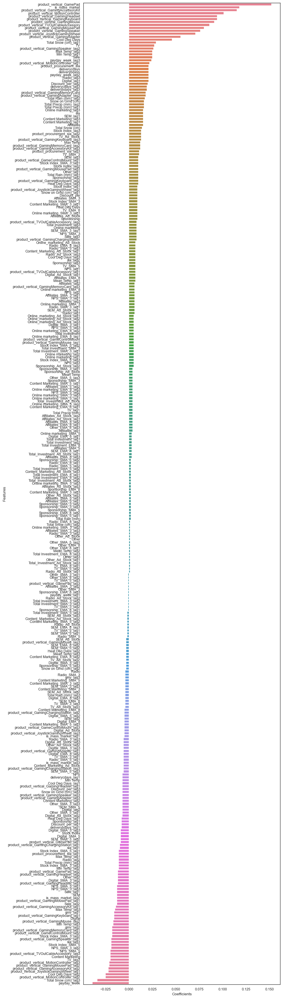

In [408]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_GamePad	|0.152|
|is_mass_market	|0.118|
|product_vertical_GamingAccessoryKit	|0.115|
|product_vertical_MotionController	|0.101|
|product_vertical_GamingHeadset	|0.094|

### Building Linear Regression model for `homeaudio`

In [409]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_dladd_model = LinearRegression().fit(X_homeaudio_dladd_train, y_homeaudio_dladd_train)
y_homeaudio_dladd_test_pred = homeaudio_dladd_model.predict(X_homeaudio_dladd_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dladd_test, y_homeaudio_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dladd_test, y_homeaudio_dladd_test_pred)))

R2 Score: 0.3668295072466644
Mean Squared Error: 1.518194385397279


##### With Simple Linear Regression, we get a r2 score of 0.37 and mse of 1.52

### Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [410]:
y_homeaudio_dladd = homeaudio_dladd_df.pop('gmv')
X_homeaudio_dladd = homeaudio_dladd_df

In [411]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_dladd_model_cv = LinearRegression().fit(X_homeaudio_dladd, y_homeaudio_dladd)
homeaudio_dladd_predictions_cv = cross_val_predict(homeaudio_dladd_model_cv, X_homeaudio_dladd, y_homeaudio_dladd, cv=10)
accuracy = metrics.r2_score(y_homeaudio_dladd, homeaudio_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dladd, homeaudio_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.48831861177525604
Mean Squared Error: 0.5116813882247438


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.49 and mse score of 0.51

### Determining Feature Importance for `homeaudio`

In [412]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_dladd_model_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_dladd_model_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_dladd_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.0),
 ('gmv_lag1', -0.039),
 ('gmv_lag2', -0.022),
 ('gmv_lag3', -0.002),
 ('Discount_per', 0.098),
 ('Discount_per_lag1', -0.005),
 ('Discount_per_lag2', -0.006),
 ('Discount_per_lag3', 0.027),
 ('deliverybdays', -0.004),
 ('deliverybdays_lag1', -0.013),
 ('deliverybdays_lag2', -0.001),
 ('deliverybdays_lag3', -0.006),
 ('deliverycdays', -0.002),
 ('deliverycdays_lag1', -0.013),
 ('deliverycdays_lag2', 0.001),
 ('deliverycdays_lag3', -0.006),
 ('sla', -0.025),
 ('sla_lag1', -0.005),
 ('sla_lag2', 0.027),
 ('sla_lag3', -0.024),
 ('product_procurement_sla', -0.045),
 ('product_procurement_sla_lag1', 0.028),
 ('product_procurement_sla_lag2', -0.005),
 ('product_procurement_sla_lag3', 0.026),
 ('is_cod', -0.001),
 ('is_cod_lag1', 0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', -0.0),
 ('is_mass_market', 0.19),
 ('is_mass_market_lag1', -0.025),
 ('is_mass_market_lag2', -0.015),
 ('is_mass_market_lag3', -0.005),
 ('product_vertical_DJController', 0.015),
 ('product_vertical_DJ

In [413]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
52,product_vertical_HomeAudioSpeaker,0.216
56,product_vertical_KaraokePlayer,0.197
28,is_mass_market,0.190
44,product_vertical_FMRadio,0.112
4,Discount_per,0.098
36,product_vertical_Dock,0.073
48,product_vertical_HiFiSystem,0.063
121,Digital_lag1,0.052
68,product_vertical_VoiceRecorder,0.042
221,SEM_lag1,0.041


### Plotting the Features in descending order of Importance for `homeaudio`

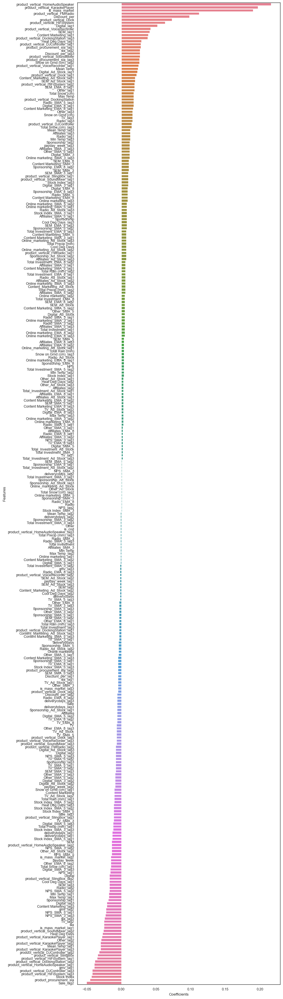

In [414]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_HomeAudioSpeaker	|0.216|
|product_vertical_KaraokePlayer	|0.197|
|is_mass_market	|0.191|
|product_vertical_FMRadio	|0.112|
|Discount_per	|0.096|

## Distributive Lag Model(Multiplicative)

*The Distributive Lag Model(Additive) helped us capture the not only the current, but also the carry-over effect of all the variables(depedent and independent).*


  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ
        
*Now the Distributive Lag Model(Multiplicative) will help us capture the interactions between current and carry over effects of the KPIs.*

*To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.*

  __Yt__ = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....

        + β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....

        + β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....

        + β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....

        + β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....

        + β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....

        + ϵ'

In [415]:
homeaudio_org_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [416]:
# Making copy of dataframes from the original ones
cameraaccessory_dlmul_df = cameraaccessory_org_df.copy()
gamingaccessory_dlmul_df = gamingaccessory_org_df.copy()
homeaudio_dlmul_df = homeaudio_org_df.copy()
homeaudio_dlmul_df.head()

,Week,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [417]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv_lag1,0,0.000
SEM_SMA_3_lag3,0,0.000
SEM_EMA_8_lag3,0,0.000
SEM_EMA_8_lag2,0,0.000
SEM_EMA_8_lag1,0,0.000


#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [418]:
# removing columns
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.drop('Week', axis=1)
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.drop('Week', axis=1)
homeaudio_dlmul_df = homeaudio_dlmul_df.drop('Week', axis=1)
homeaudio_dlmul_df.head()

,gmv,Discount_per,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_DJController,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,0,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,0,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,0,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,0,1069,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


### Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [419]:
cameraaccessory_dlmul_df_columns = cameraaccessory_dlmul_df.columns
gamingaccessory_dlmul_df_columns = gamingaccessory_dlmul_df.columns
homeaudio_dlmul_df_columns = homeaudio_dlmul_df.columns

In [420]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,3)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,3)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,3)
homeaudio_dlmul_df.head()

,gmv,gmv_lag3,Discount_per,Discount_per_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,is_cod,is_cod_lag3,is_mass_market,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Sale,Sale_lag3
25,4573783.133,NaN,31.451,NaN,0.000,NaN,0.000,NaN,7.369,NaN,2.863,NaN,0,NaN,1366,NaN,8,NaN,33,NaN,1,NaN,516.000,NaN,23,NaN,1374.000,NaN,0,NaN,0,NaN,0,NaN,63,NaN,0,NaN,0,NaN,4.265,NaN,0.000,NaN,0.000,NaN,4.265,NaN,4.265,NaN,0.054,NaN,0.000,NaN,0.000,NaN,0.054,NaN,0.054,NaN,0.633,NaN,0.000,NaN,0.000,NaN,0.633,NaN,0.633,NaN,1.854,NaN,0.000,NaN,0.000,NaN,1.854,NaN,1.854,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.332,NaN,0.000,NaN,0.000,NaN,0.332,NaN,0.332,NaN,0.137,NaN,0.000,NaN,0.000,NaN,0.137,NaN,0.137,NaN,1.256,NaN,0.000,NaN,0.000,NaN,1.256,NaN,1.256,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,0.000,NaN,54.600,NaN,0.000,NaN,0.000,NaN,1177.000,NaN,0.000,NaN,0.000,NaN,28.000,NaN,12.500,NaN,20.100,NaN,0.283,NaN,2.383,NaN,4.4

### Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [421]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,2)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,2)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,2)
homeaudio_dlmul_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock

### Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [422]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,1)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,1)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,1)
homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

####  Imputing all null values with 0

In [423]:
# Imputing all null values with 0
cameraaccessory_dlmul_df.fillna(value=0, inplace=True)
gamingaccessory_dlmul_df.fillna(value=0, inplace=True)
homeaudio_dlmul_df.fillna(value=0, inplace=True)
homeaudio_dlmul_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

In [424]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv_lag1,0,0.000
SEM_SMA_3_lag3,0,0.000
SEM_EMA_8_lag3,0,0.000
SEM_EMA_8_lag2,0,0.000
SEM_EMA_8_lag1,0,0.000


### Taking Logarithm of both the Dependent and the independent variables

##### After taking log, all 0 values will be transformed to `inf`. Retransforming these values to 0.

In [425]:
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.applymap(lambda x: np.log(x))
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.replace(np.nan, 0)

gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.applymap(lambda x: np.log(x))
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.replace(np.nan, 0)

homeaudio_dlmul_df = homeaudio_dlmul_df.applymap(lambda x: np.log(x))
homeaudio_dlmul_df = homeaudio_dlmul_df.replace([np.inf, -np.inf], 0)
homeaudio_dlmul_df = homeaudio_dlmul_df.replace(np.nan, 0)


homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

In [426]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dlmul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dlmul_df.isnull().sum()/homeaudio_dlmul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,0,0.000
SEM_SMA_3_lag2,0,0.000
SEM_EMA_8_lag2,0,0.000
SEM_EMA_8_lag1,0,0.000
SEM_EMA_8,0,0.000


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [427]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_dlmul_df[cameraaccessory_dlmul_df.columns]=scaler.fit_transform(cameraaccessory_dlmul_df[cameraaccessory_dlmul_df.columns])
gamingaccessory_dlmul_df[gamingaccessory_dlmul_df.columns]=scaler.fit_transform(gamingaccessory_dlmul_df[gamingaccessory_dlmul_df.columns])
homeaudio_dlmul_df[homeaudio_dlmul_df.columns]=scaler.fit_transform(homeaudio_dlmul_df[homeaudio_dlmul_df.columns])

homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_l

### Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [428]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_dlmul_train, cameraaccessory_dlmul_test = train_test_split(cameraaccessory_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dlmul_train, gamingaccessory_dlmul_test = train_test_split(gamingaccessory_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dlmul_train, homeaudio_dlmul_test = train_test_split(homeaudio_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

### Dividing the 3 dataframes into X and Y sets for the model building

In [429]:
y_cameraaccessory_dlmul_train = cameraaccessory_dlmul_train.pop('gmv')
X_cameraaccessory_dlmul_train = cameraaccessory_dlmul_train

y_gamingaccessory_dlmul_train = gamingaccessory_dlmul_train.pop('gmv')
X_gamingaccessory_dlmul_train = gamingaccessory_dlmul_train

y_homeaudio_dlmul_train = homeaudio_dlmul_train.pop('gmv')
X_homeaudio_dlmul_train = homeaudio_dlmul_train

X_homeaudio_dlmul_train.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,

### Dividing into X and Y test sets for the model building for 3 dataframes

In [430]:
y_cameraaccessory_dlmul_test = cameraaccessory_dlmul_test.pop('gmv')
X_cameraaccessory_dlmul_test = cameraaccessory_dlmul_test

y_gamingaccessory_dlmul_test = gamingaccessory_dlmul_test.pop('gmv')
X_gamingaccessory_dlmul_test = gamingaccessory_dlmul_test

y_homeaudio_dlmul_test = homeaudio_dlmul_test.pop('gmv')
X_homeaudio_dlmul_test = homeaudio_dlmul_test

X_homeaudio_dlmul_test.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount_per,Discount_per_lag1,Discount_per_lag2,Discount_per_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_DJController,product_vertical_DJController_lag1,product_vertical_DJController_lag2,product_vertical_DJController_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,

### Building Linear Regression model for `cameraaccessory`

In [431]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_dlmul_model = LinearRegression().fit(X_cameraaccessory_dlmul_train, y_cameraaccessory_dlmul_train)
y_cameraaccessory_dlmul_test_pred = cameraaccessory_dlmul_model.predict(X_cameraaccessory_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dlmul_test, y_cameraaccessory_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlmul_test, y_cameraaccessory_dlmul_test_pred)))

R2 Score: 0.7654278488206592
Mean Squared Error: 0.520226177804208


##### With Simple Linear Regression, we get a r2 score of 0.77 and mse of 0.52

### Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [432]:
y_cameraaccessory_dlmul = cameraaccessory_dlmul_df.pop('gmv')
X_cameraaccessory_dlmul = cameraaccessory_dlmul_df

In [433]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_dlmul_model_cv = LinearRegression().fit(X_cameraaccessory_dlmul, y_cameraaccessory_dlmul)
cameraaccessory_dlmul_predictions_cv = cross_val_predict(cameraaccessory_dlmul_model_cv, X_cameraaccessory_dlmul, \
                                                         y_cameraaccessory_dlmul, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dlmul, cameraaccessory_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlmul, cameraaccessory_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.8046193500140999
Mean Squared Error: 0.19538064998590016


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.80 and mse score of 0.20

### Determining Feature Importance for `cameraaccessory` with model with cv

In [434]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_dlmul_model_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_dlmul_model_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_dlmul_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', 0.003),
 ('gmv_lag2', -0.006),
 ('gmv_lag3', -0.004),
 ('Discount_per', 0.0),
 ('Discount_per_lag1', 0.007),
 ('Discount_per_lag2', 0.019),
 ('Discount_per_lag3', -0.009),
 ('deliverybdays', -0.002),
 ('deliverybdays_lag1', -0.009),
 ('deliverybdays_lag2', 0.004),
 ('deliverybdays_lag3', -0.003),
 ('deliverycdays', -0.002),
 ('deliverycdays_lag1', -0.007),
 ('deliverycdays_lag2', 0.005),
 ('deliverycdays_lag3', -0.005),
 ('sla', -0.035),
 ('sla_lag1', -0.004),
 ('sla_lag2', 0.003),
 ('sla_lag3', 0.014),
 ('product_procurement_sla', 0.054),
 ('product_procurement_sla_lag1', -0.019),
 ('product_procurement_sla_lag2', -0.029),
 ('product_procurement_sla_lag3', 0.024),
 ('is_cod', -0.0),
 ('is_cod_lag1', -0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', 0.0),
 ('is_mass_market', 0.064),
 ('is_mass_market_lag1', 0.006),
 ('is_mass_market_lag2', -0.009),
 ('is_mass_market_lag3', -0.007),
 ('product_vertical_CameraAccessory', 0.064),
 ('product_vertical_CameraAc

In [435]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
32,product_vertical_CameraAccessory,0.064
28,is_mass_market,0.064
40,product_vertical_CameraBattery,0.063
80,product_vertical_CameraTripod,0.063
100,product_vertical_Lens,0.063
36,product_vertical_CameraBag,0.060
76,product_vertical_CameraRemoteControl,0.059
88,product_vertical_Filter,0.058
44,product_vertical_CameraBatteryCharger,0.057
20,product_procurement_sla,0.054


### Plotting the Features in descending order of Importance for `cameraaccessory`

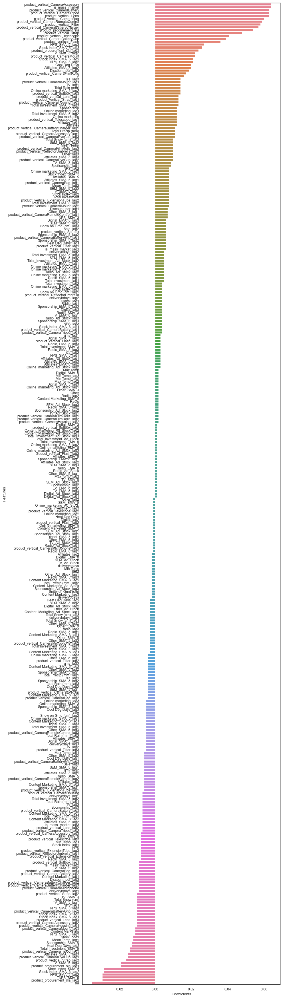

In [436]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|is_mass_market	|0.064|
|product_vertical_CameraAccessory	|0.064|
|product_vertical_CameraBattery	|0.063|
|product_vertical_CameraTripod	|0.063|
|product_vertical_Lens	|0.063|


### Building Linear Regression model for `gamingaccessory`

In [437]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_dlmul_model = LinearRegression().fit(X_gamingaccessory_dlmul_train, y_gamingaccessory_dlmul_train)
y_gamingaccessory_dlmul_test_pred = gamingaccessory_dlmul_model.predict(X_gamingaccessory_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dlmul_test, y_gamingaccessory_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlmul_test, y_gamingaccessory_dlmul_test_pred)))

R2 Score: 0.9280132595869814
Mean Squared Error: 0.11312543386269533


##### With Simple Linear Regression, we get a r2 score of 0.93 and mse score of 0.11

### Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [438]:
y_gamingaccessory_dlmul = gamingaccessory_dlmul_df.pop('gmv')
X_gamingaccessory_dlmul = gamingaccessory_dlmul_df

In [439]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_dlmul_model_cv = LinearRegression().fit(X_gamingaccessory_dlmul, y_gamingaccessory_dlmul)
gamingaccessory_dlmul_predictions_cv = cross_val_predict(gamingaccessory_dlmul_model_cv, X_gamingaccessory_dlmul, \
                                                         y_gamingaccessory_dlmul, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dlmul, gamingaccessory_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlmul, gamingaccessory_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.8858313065088613
Mean Squared Error: 0.1141686934911387


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.89 and mse score of 0.11

### Determining Feature Importance for `gamingaccessory` with model with cv

In [440]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_dlmul_model_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_dlmul_model_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_dlmul_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', 0.001),
 ('gmv_lag2', -0.003),
 ('gmv_lag3', -0.002),
 ('Discount_per', -0.061),
 ('Discount_per_lag1', -0.006),
 ('Discount_per_lag2', -0.003),
 ('Discount_per_lag3', 0.001),
 ('deliverybdays', -0.007),
 ('deliverybdays_lag1', -0.002),
 ('deliverybdays_lag2', -0.003),
 ('deliverybdays_lag3', 0.015),
 ('deliverycdays', -0.007),
 ('deliverycdays_lag1', -0.005),
 ('deliverycdays_lag2', -0.003),
 ('deliverycdays_lag3', 0.017),
 ('sla', 0.027),
 ('sla_lag1', 0.045),
 ('sla_lag2', -0.055),
 ('sla_lag3', -0.005),
 ('product_procurement_sla', 0.01),
 ('product_procurement_sla_lag1', -0.006),
 ('product_procurement_sla_lag2', 0.007),
 ('product_procurement_sla_lag3', 0.016),
 ('is_cod', 0.0),
 ('is_cod_lag1', 0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', 0.0),
 ('is_mass_market', 0.088),
 ('is_mass_market_lag1', 0.005),
 ('is_mass_market_lag2', 0.002),
 ('is_mass_market_lag3', -0.006),
 ('product_vertical_GameControlMount', -0.0),
 ('product_vertical_GameContr

In [441]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
36,product_vertical_GamePad,0.094
64,product_vertical_GamingMouse,0.090
28,is_mass_market,0.088
56,product_vertical_GamingKeyboard,0.079
40,product_vertical_GamingAccessoryKit,0.076
84,product_vertical_TVOutCableAccessory,0.074
52,product_vertical_GamingHeadset,0.073
68,product_vertical_GamingMousePad,0.068
44,product_vertical_GamingAdapter,0.065
76,product_vertical_JoystickGamingWheel,0.062


### Plotting the Features in descending order of Importance for `gamingaccessory`

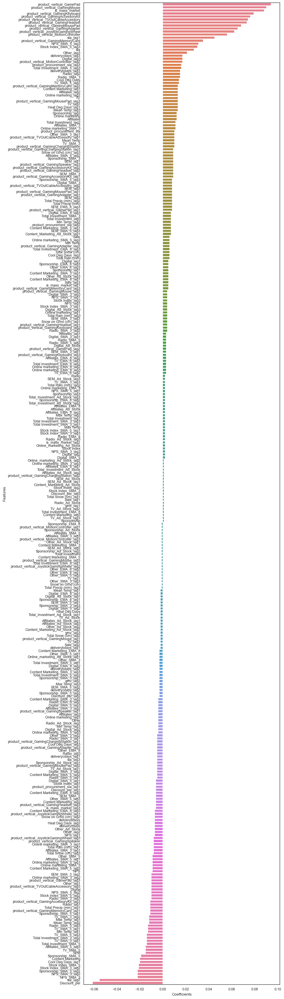

In [442]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_GamePad|	0.095|
|product_vertical_GamingMouse|	0.090|
|is_mass_market	|0.089|
|product_vertical_GamingKeyboard	|0.079|
|product_vertical_GamingAccessoryKit	|0.076|

### Building Linear Regression model for `homeaudio`

In [443]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_dlmul_model = LinearRegression().fit(X_homeaudio_dlmul_train, y_homeaudio_dlmul_train)
y_homeaudio_dlmul_test_pred = homeaudio_dlmul_model.predict(X_homeaudio_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dlmul_test, y_homeaudio_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlmul_test, y_homeaudio_dlmul_test_pred)))

R2 Score: -0.38498876194032783
Mean Squared Error: 0.28981904195510116


##### With Simple Linear Regression, we get a r2 score of -0.39 and mse of 0.29

*Here R2 is negative which signifies that the chosen model does not follow the trend of the data, so fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

### Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [444]:
y_homeaudio_dlmul = homeaudio_dlmul_df.pop('gmv')
X_homeaudio_dlmul = homeaudio_dlmul_df

In [445]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_dlmul_cv = LinearRegression().fit(X_homeaudio_dlmul, y_homeaudio_dlmul)
homeaudio_dlmul_predictions_cv = cross_val_predict(homeaudio_model_dlmul_cv, X_homeaudio_dlmul, y_homeaudio_dlmul, cv=5)
accuracy = metrics.r2_score(y_homeaudio_dlmul, homeaudio_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlmul, homeaudio_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.5082011763207455
Mean Squared Error: 0.4917988236792546


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.51 and mse score of 0.49

### Determining Feature Importance for `homeaudio` with model with cv

In [446]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model_dlmul_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model_dlmul_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_dlmul_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.0),
 ('gmv_lag1', -0.008),
 ('gmv_lag2', 0.002),
 ('gmv_lag3', -0.002),
 ('Discount_per', 0.114),
 ('Discount_per_lag1', 0.001),
 ('Discount_per_lag2', -0.002),
 ('Discount_per_lag3', 0.003),
 ('deliverybdays', -0.004),
 ('deliverybdays_lag1', 0.017),
 ('deliverybdays_lag2', -0.007),
 ('deliverybdays_lag3', -0.011),
 ('deliverycdays', -0.004),
 ('deliverycdays_lag1', 0.016),
 ('deliverycdays_lag2', -0.006),
 ('deliverycdays_lag3', -0.012),
 ('sla', -0.056),
 ('sla_lag1', 0.007),
 ('sla_lag2', 0.001),
 ('sla_lag3', -0.008),
 ('product_procurement_sla', 0.039),
 ('product_procurement_sla_lag1', 0.017),
 ('product_procurement_sla_lag2', -0.012),
 ('product_procurement_sla_lag3', 0.015),
 ('is_cod', -0.0),
 ('is_cod_lag1', 0.0),
 ('is_cod_lag2', 0.0),
 ('is_cod_lag3', -0.0),
 ('is_mass_market', 0.151),
 ('is_mass_market_lag1', -0.019),
 ('is_mass_market_lag2', 0.003),
 ('is_mass_market_lag3', -0.005),
 ('product_vertical_DJController', 0.031),
 ('product_vertical_DJControl

In [447]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
52,product_vertical_HomeAudioSpeaker,0.156
28,is_mass_market,0.151
44,product_vertical_FMRadio,0.138
68,product_vertical_VoiceRecorder,0.117
4,Discount_per,0.114
48,product_vertical_HiFiSystem,0.100
36,product_vertical_Dock,0.065
41,product_vertical_DockingStation_lag1,0.041
20,product_procurement_sla,0.039
32,product_vertical_DJController,0.031


### Plotting the Features in descending order of Importance for `homeaudio`

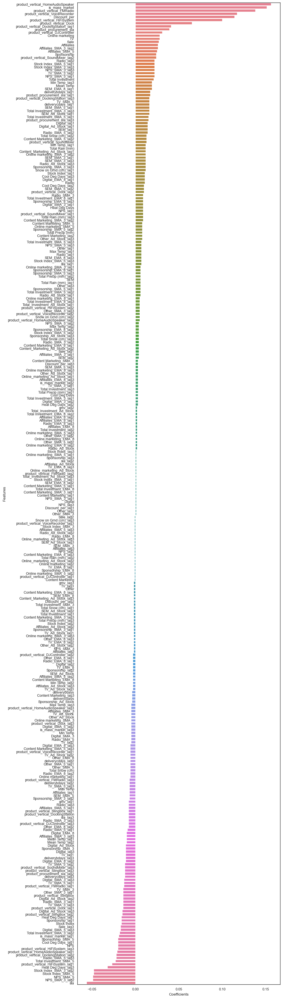

In [448]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_HomeAudioSpeaker|	0.156|
|is_mass_market|	0.151|
|product_vertical_FMRadio|	0.138|
|product_vertical_VoiceRecorder	|0.117|
|Discount_per	|0.115|


# Step 5: Model Dashboard

|Product Sub-category|Linear Regression Model|Cross Validation|R-square on Test Dataset|Mean Square Error|
|--------------------|-----------------------|----------------|------------------------|-----------------|
|<font color = RED>__cameraaccessory__</font>|Additive|No|0.76|0.23|
|||Yes|-0.82|1.82|
||__Multiplicative__|No|0.84|0.35|
|||<font color = blue>__Yes__<font color = blue>|<font color = blue>__0.92__<font color = blue>|<font color = blue>__0.08__<font color = blue>|
||Koyck|No|0.83|0.16|
|||Yes|0.31|0.69|
||Distributive Lag Model (Additive)|No|0.88|0.12|
|||Yes|0.82|0.18|
||Distributive Lag Model (Multiplicaitive)|No|0.77|0.52|
|||Yes|0.80|0.20|
|<font color = RED>__gamingaccessory__</font>|Additive|No|0.94|0.05|
|||Yes|0.31|0.69|
||__Multiplicative__|No|0.93|0.10|
|||<font color = blue>__Yes__<font color = blue>|<font color = blue>__0.94__<font color = blue>|<font color = blue>__0.06__<font color = blue>|
||Koyck|No|0.94|0.05|
|||Yes|0.36|0.64|
||Distributive Lag Model (Additive)|No|0.89|0.09|
|||Yes|0.92|0.08|
||Distributive Lag Model (Multiplicaitive)|No|0.93|0.11|
|||Yes|0.89|0.11|
|<font color = RED>__homeaudio__</font>|Additive|No|0.95|0.11|
|||Yes|0.76|0.24|
||__Multiplicative__|No|-0.50|0.31|
|||<font color = blue>__Yes__|<font color = blue>__0.89__|<font color = blue>__0.11__|
||Koyck|No|0.94|0.11|
|||Yes|0.74|0.26|
||Distributive Lag Model (Additive)|No|0.37|1.52|
|||Yes|0.49|0.51|
||Distributive Lag Model (Multiplicaitive)|No|-0.39|0.29|
|||Yes|0.51|0.49|

## Model Selection

By refering above dashboard we are finalizing the following **Multiplicative with CV** models for the 3 mentioned product subcategories - Camera Accessory, Gaming Accessory & Home Audio. 

The criteria of choosing the model is based on the accuracy parameters **R2 score & MSE score** and the business relevance of the important attributes chosen by the model.

|Product Sub-category|Linear Regression Model|R-square on Test Dataset|Mean Square Error|Top 5 KPIs|
|--------------------|-----------------------|------------------------|-----------------|----------|
|<font color = RED>__cameraaccessory__</font>|__Multiplicative with CV__|0.92|0.08|product_vertical_Lens (<font color = blue>__0.184__)</font>|
|||||is_mass_market (<font color = blue>__0.154__)</font>|
|||||product_vertical_CameraBattery (<font color = blue>__0.150__)</font>|
|||||product_vertical_camerabatterycharger (<font color = blue>__0.120__)</font>|
|||||Content_Marketing_Ad_Stock (<font color = blue>__0.108__)</font>|
|<font color = RED>__gamingaccessory__</font>|__Multiplicative with CV__|0.94|0.06|product_vertical_GamingHeadset (<font color = blue>__0.256__)</font>|
|||||is_mass_market (<font color = blue>__0.240__)</font>|
|||||product_vertical_GamingMouse (<font color = blue>__0.224__)</font>|
|||||product_vertical_GamePad (<font color = blue>__0.209__)</font>|
|||||Online marketing_SMA_3 (<font color = blue>__0.162__)</font>|
|<font color = RED>__HomeAudio__</font>|__Multiplicative with CV__|0.89|0.11|product_vertical_HomeAudioSpeaker (<font color = blue>__0.460__)</font>|
|||||is_mass_market (<font color = blue>__0.217__)</font>|
|||||product_vertical_FMRadio (<font color = blue>__0.190__)</font>|
|||||Sponsorship (<font color = blue>__0.158__)</font>|
|||||Other_Ad_Stock (<font color = blue>__0.154__)</font>|

These models tell us about the growth of revenue vs the interactive growth of the KPIs.

# Step 6: Model Evaluation

## Let's evaluate final models

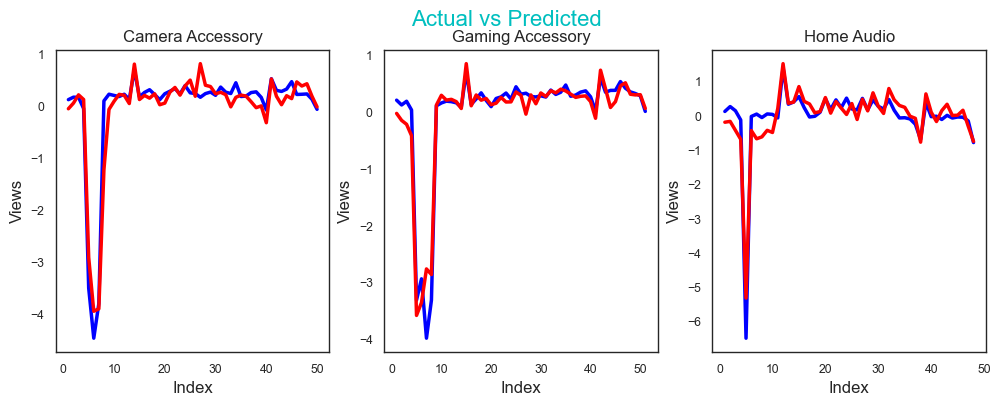

In [449]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
c = [i for i in range(1,51,1)]
plt.plot(c,y_cameraaccessory_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,cameraaccessory_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.suptitle('Actual vs Predicted', fontsize=16, color = 'c')              # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# subplot 2
plt.subplot(1, 3, 2)
c = [i for i in range(1,52,1)]
plt.plot(c,y_gamingaccessory_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,gamingaccessory_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.title('Gaming Accessory', fontsize=12)
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# subplot 3
plt.subplot(1, 3, 3)
c = [i for i in range(1,49,1)]
plt.plot(c,y_homeaudio_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,homeaudio_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.title('Home Audio', fontsize=12)
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# display the plot
plt.show()

## Now let's plot actual and predicted price valuesfrom the datasets to check the likeness

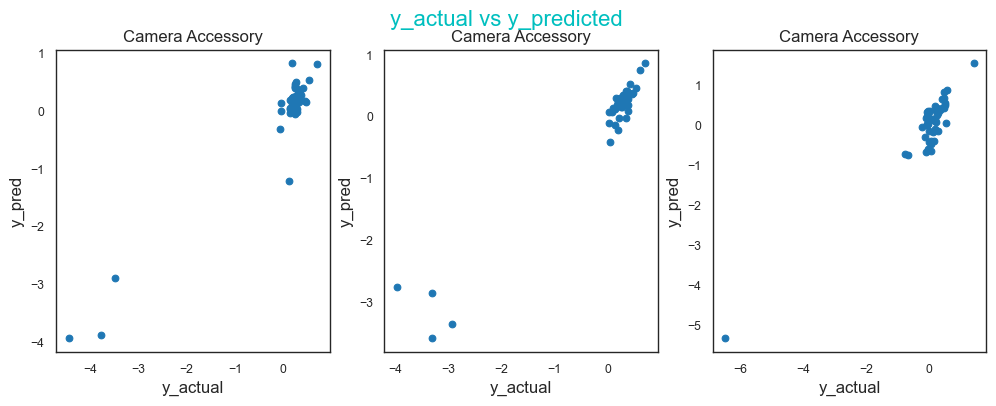

In [450]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_cameraaccessory_mul,cameraaccessory_mul_predictions_cv)
plt.suptitle('y_actual vs y_predicted', fontsize=16, color = 'c')              # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 2
plt.subplot(1, 3, 2)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_gamingaccessory_mul,gamingaccessory_mul_predictions_cv)
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 3
plt.subplot(1, 3, 3)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_homeaudio_mul,homeaudio_mul_predictions_cv)
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# display the plot
plt.show()

## Now let's scatter plot actual and predicted price values from the datasets to check the spread

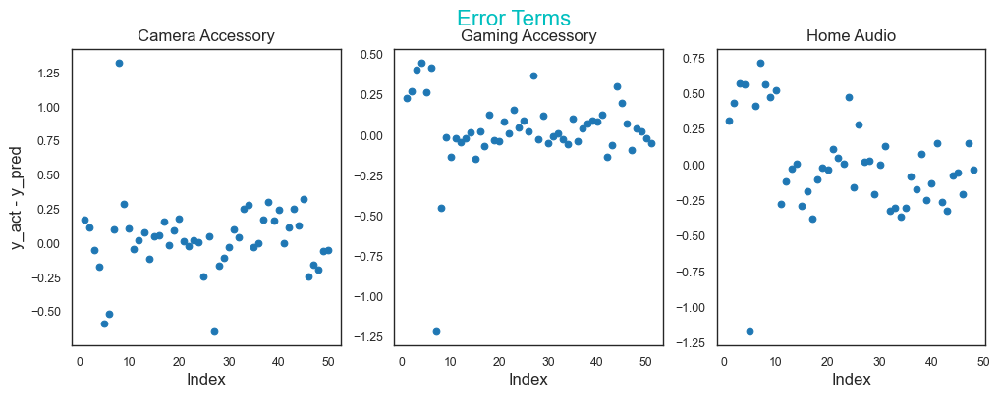

In [451]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Error terms
c = [i for i in range(1,51,1)]
plt.scatter(c,y_cameraaccessory_mul - cameraaccessory_mul_predictions_cv)
plt.suptitle('Error Terms', fontsize=16, color = 'c')              # Plot heading
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label
plt.ylabel('y_act - y_pred', fontsize=12)                # Y-label

# subplot 2
plt.subplot(1, 3, 2)
# Error terms
c = [i for i in range(1,52,1)]
plt.scatter(c,y_gamingaccessory_mul - gamingaccessory_mul_predictions_cv)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label

# subplot 3
plt.subplot(1, 3, 3)
# Error terms
c = [i for i in range(1,49,1)]
plt.scatter(c,y_homeaudio_mul - homeaudio_mul_predictions_cv)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label

# display the plot
plt.show()

## Let's draw a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

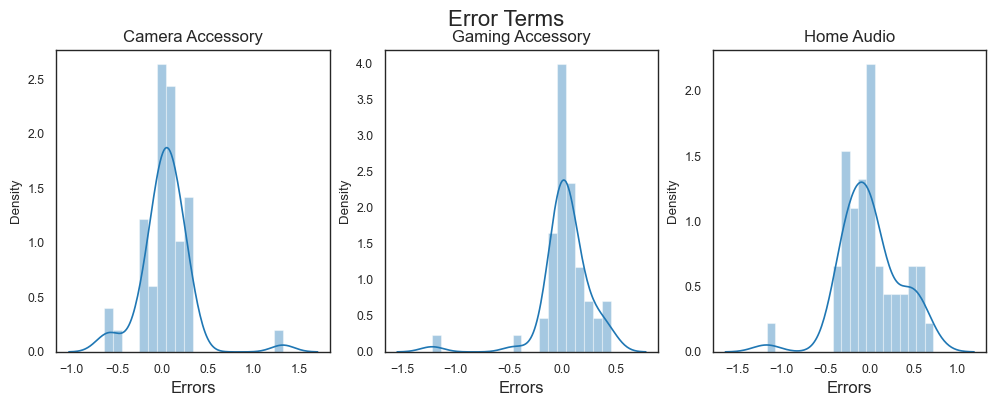

In [452]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plot the histogram of the error terms
sns.distplot((y_cameraaccessory_mul-cameraaccessory_mul_predictions_cv), bins = 20)
plt.suptitle('Error Terms', fontsize = 16)                  # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label


# subplot 2
plt.subplot(1, 3, 2)
# Plot the histogram of the error terms
sns.distplot((y_gamingaccessory_mul-gamingaccessory_mul_predictions_cv), bins = 20)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label

# subplot 3
plt.subplot(1, 3, 3)
# Plot the histogram of the error terms
sns.distplot((y_homeaudio_mul-homeaudio_mul_predictions_cv), bins = 20)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label

# display the plot
plt.show()

## Let's plot the distribution of the error terms. The error terms follow a normal distrbution with mean at 0 barring a few outlier values.

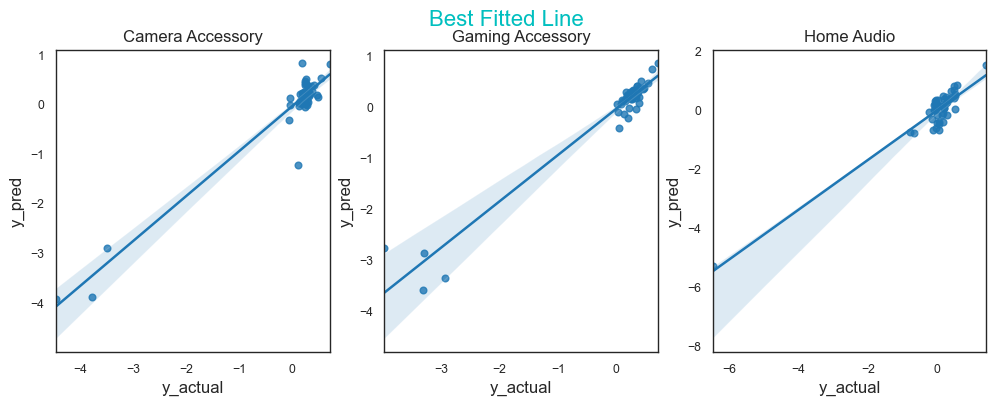

In [453]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plot the histogram of the error terms
sns.regplot(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)
plt.suptitle('Best Fitted Line', fontsize=16, color = 'c')              # Plot heading  
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label


# subplot 2
plt.subplot(1, 3, 2)
# Plot the histogram of the error terms
sns.regplot(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 3
plt.subplot(1, 3, 3)
# Plot the histogram of the error terms
sns.regplot(y_homeaudio_mul, homeaudio_mul_predictions_cv)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# display the plot
plt.show()

# Step 7: Model Equation

Considering the top 5 KPIs from the models for our 3 product subcategories, we can see that the equation of our best fitted lines as follows:

**Camera Accessory:**

Revenue = 0.0 + (0.184 × product_vertical_Lens) + (0.150 × product_vertical_CameraBattery) + (0.154 × is_mass_market) + (0.120 × product_vertical_camerabatterycharger) + (0.108 × Content_Marketing_Ad_Stock)


**Gaming Accessory:**

Revenue = 0.0 + (0.256 × product_vertical_GamingHeadset) + (0.240 × is_mass_market) + (0.224 × product_vertical_GamingMouse) + (0.209 × product_vertical_GamePad) + (0.162 × Online marketing_SMA_3)


**Home Audio:**

Revenue = 0.0 + (0.460 × product_vertical_HomeAudioSpeaker) + (0.217 × is_mass_market) + (0.190 × product_vertical_FMRadio) + (0.154 × Other_Ad_Stock) + (0.158 × Sponsorship)

This equation implies how much the Revenue will grow with a unit growth in any of these independent KPIs with all other KPIs held constant.

In [454]:
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.head().append(cameraaccessory_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.head().append(gamingaccessory_mul_lr_coef_df.tail())
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.head().append(homeaudio_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_GamingHeadset,0.256
7,is_mass_market,0.240
16,product_vertical_GamingMouse,0.224
9,product_vertical_GamePad,0.209
50,Online marketing_SMA_3,0.162
67,Radio_EMA_8,-0.078
1,Discount_per,-0.088
72,Other_EMA_8,-0.089
42,Sponsorship_EMA_8,-0.092
15,product_vertical_GamingMemoryCard,-0.122


## Let's plot the Top 5 features that affect Each of the 3 Product Sub-categories(both positively and adversely) as per our Chosen Models

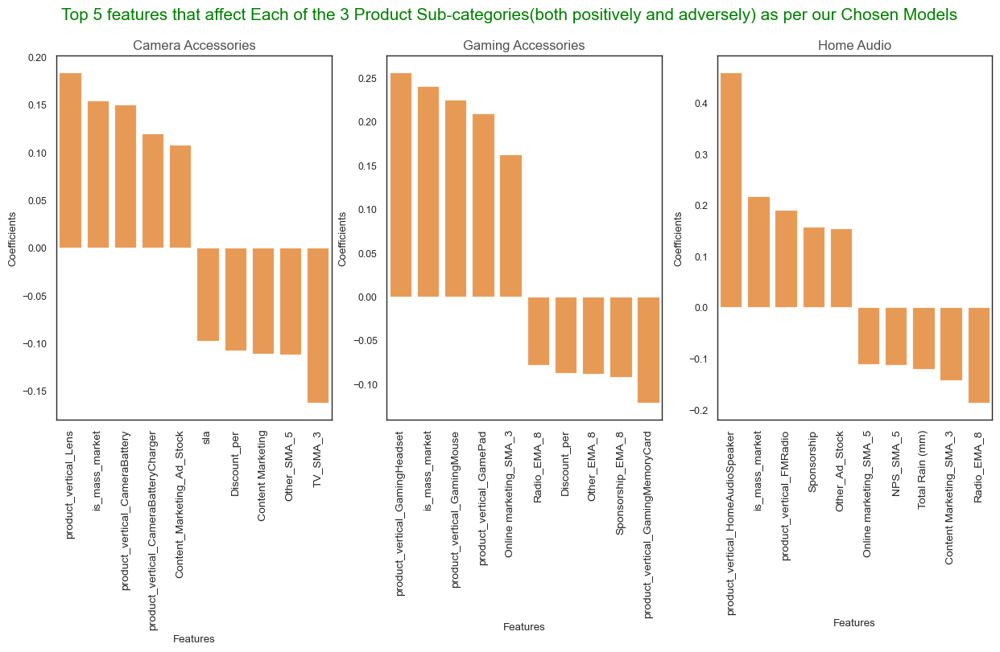

In [455]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(15,6), dpi=100, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 3, 1)
sns.barplot(x='Features', y='Coefficients', color = 'tab:orange',alpha=0.8, data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
plt.title('Camera Accessories', fontsize=12, alpha=0.8)
plt.xticks(rotation='vertical', fontsize=10)

# subplot 1
plt.subplot(1, 3, 2)
sns.barplot(x='Features', y='Coefficients', color = 'tab:orange',alpha=0.8, data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
plt.title('Gaming Accessories', fontsize=12,  alpha=0.8)
plt.xticks(rotation='vertical', fontsize=10)

# subplot 1
plt.subplot(1, 3, 3)
sns.barplot(x='Features', y='Coefficients', color = 'tab:orange',alpha=0.8, data=homeaudio_mul_lr_coef_df, estimator=np.sum)
plt.title('Home Audio', fontsize=12,  alpha=0.8)
plt.suptitle('Top 5 features that affect Each of the 3 Product Sub-categories(both positively and adversely) \
as per our Chosen Models', fontsize=15, color = 'g', alpha=1)
plt.xticks(rotation='vertical', fontsize=10)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
#plt.tight_layout()

# display the plot
plt.show()

# Recommendations:

In [456]:
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.head().append(cameraaccessory_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.head().append(gamingaccessory_mul_lr_coef_df.tail())
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.head().append(homeaudio_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_GamingHeadset,0.256
7,is_mass_market,0.240
16,product_vertical_GamingMouse,0.224
9,product_vertical_GamePad,0.209
50,Online marketing_SMA_3,0.162
67,Radio_EMA_8,-0.078
1,Discount_per,-0.088
72,Other_EMA_8,-0.089
42,Sponsorship_EMA_8,-0.092
15,product_vertical_GamingMemoryCard,-0.122


## **Camera Accessory:**

1. Content Marketing AdStock (carry over effect of Content Marketing Advertisement) spends helps to increase Camera Accessories sales by significant level.

2. Camera Accessories products like lens, Battery Charger and Camera Battery generates maximum revenues, so company should focus on these products.

3. Mass Market products helps to increase the revenue.

4. Company should avoid in giving higher percentage of discounts since it negatively impact the revenue generation.

## **Gaming Accessory:**

1. Comapny should focus on products like Gaming Headsets, Gaming Mouse and GamePads since it generates highest revenue.

2. Mass Market products helps to increase the revenue of Gaming Accessories as well.

3. Company should avoid in giving higher percentage of discounts since it negatively impact the revenue generation.

## **Home Audio:**

1. Home Audio Accessories products like Home Audio Speakers and FM Radio , generates maximum revenues, so company should focus on these products.

2. Other AdStock (carry over effect of other types of  Advertisement) spends helps to increase Home Audio Accessories sales by significant level.

3. Advertisement spends on Sponsorship has a positive impact on revenue.

4. Like Camera and Gaming Accessories, Mass Market products helps to increase the revenue of Home Audio segment as well.